## Setup

In [1]:
import torch
from matplotlib import pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.preprocessing import StandardScaler
from torch import nn, optim
from torch.utils.data import TensorDataset
from torcheval.metrics import functional as funcmetrics
from ucimlrepo import fetch_ucirepo

from common import *

In [2]:
torch.manual_seed(2024)
torch.use_deterministic_algorithms(True)

In [3]:
class WineNN(nn.Module):
    def __init__(self, num_features=13, hidden_sizes=(64, 64), output_size=3):
        super(WineNN, self).__init__()

        self.layer1 = nn.Sequential(
            nn.Linear(num_features, hidden_sizes[0]),
            nn.ReLU(),
        )
        self.layer2 = nn.Sequential(
            nn.Linear(hidden_sizes[0], hidden_sizes[1]),
            nn.ReLU(),
            nn.Dropout(0.1),
        )
        self.out = nn.Sequential(
            nn.Linear(hidden_sizes[1], output_size),
            nn.Softmax(dim=-1),
        )

    def forward(self, x):
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.out(x)
        return x

In [4]:
# import wine dataset
wine = fetch_ucirepo(id=109)

In [5]:
wine_scaler = StandardScaler()
wine_dataset = TensorDataset(
    torch.tensor(wine_scaler.fit_transform(
        wine.data.features), dtype=torch.float),
    torch.tensor(wine.data.targets.to_numpy() - 1).flatten()
)

wine_datasets = shuffle_train_valid_test_split(wine_dataset)
wine_headers: list = wine.data.headers[:-1].to_list()

In [6]:
def optimizer_factory(model):
    return optim.SGD(model.parameters(), lr=0.01,
                     momentum=0.9, weight_decay=5e-4)


criterion = nn.CrossEntropyLoss()

In [7]:
labels = ("accuracy", "f1-score")


def score_outputs(outputs, targets):
    return (
        funcmetrics.multiclass_accuracy(
            outputs, targets, average='macro', num_classes=3).item(),
        funcmetrics.multiclass_f1_score(
            outputs, targets, average='macro', num_classes=3).item(),
    )

## Base model

/home/szynka/Projects/Studia/xai/.venv/lib64/python3.12/site-packages/torcheval/metrics/functional/classification/accuracy.py:275: UserWarning: The reduce argument of torch.scatter with Tensor src is deprecated and will be removed in a future PyTorch release. Use torch.scatter_reduce instead for more reduction options. (Triggered internally at ../aten/src/ATen/native/TensorAdvancedIndexing.cpp:232.)
  num_correct = mask.new_zeros(num_classes).scatter_(0, target, mask, reduce="add")


test: ('accuracy', 'f1-score'): (0.9722222685813904, 0.9646739363670349)


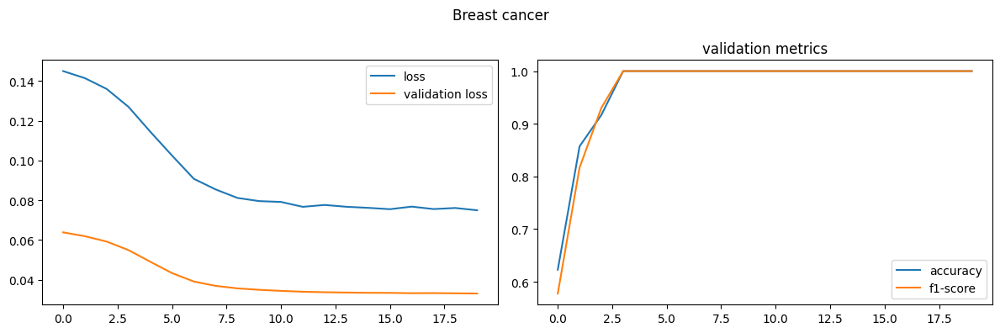

In [8]:
datasets = wine_datasets

model = WineNN()
optimizer = optimizer_factory(model)

metrics = model_train(datasets, model, optimizer, criterion, score_outputs, 20)

with torch.no_grad():
    inputs, targets = datasets["test"][:]
    outputs = model(inputs)

    test_metrics = score_outputs(outputs, targets)

print(f"test: {labels}: {test_metrics}")
plot_metrics('Breast cancer', metrics, labels)

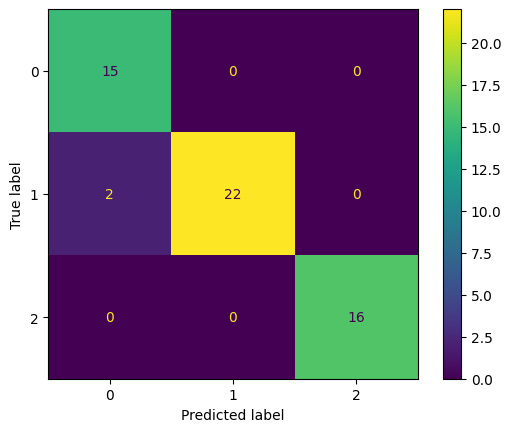

In [9]:
ConfusionMatrixDisplay.from_predictions(targets, outputs.argmax(dim=1))
plt.show()

## DGSM

In [10]:
best_model = WineNN()

### input layer

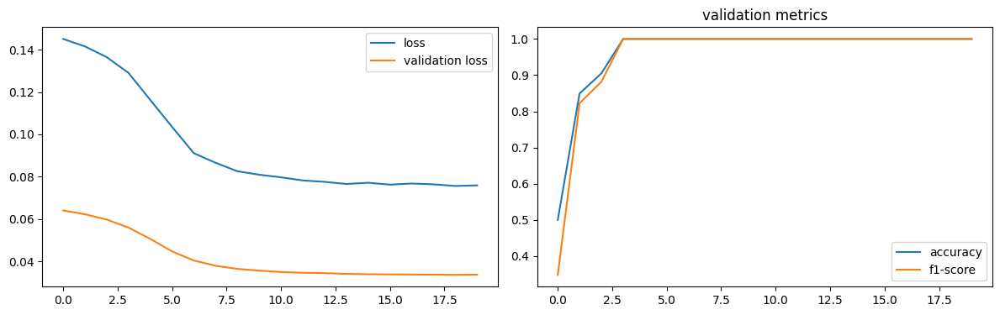

num of dropped: 0
Test: loss: 0.5749284029006958, avg metrics: (0.9777778148651123, 0.9717391490936279)
dropping feature: (7, 'Nonflavanoid_phenols')


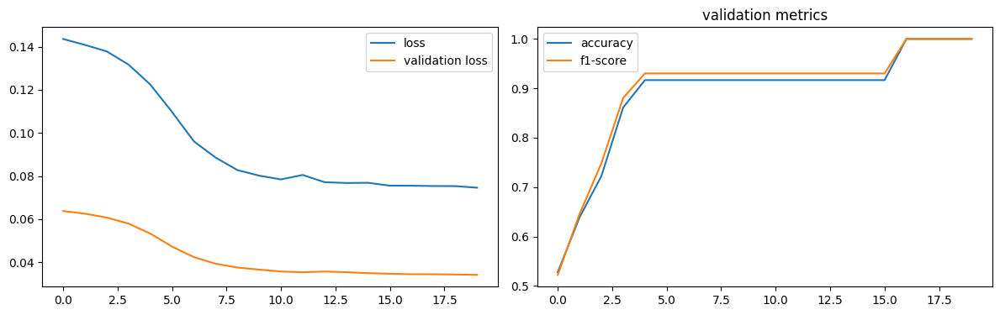

num of dropped: 1
Test: loss: 0.6018698215484619, avg metrics: (0.9777778148651123, 0.9717391490936279)
dropping feature: (1, 'Malicacid')


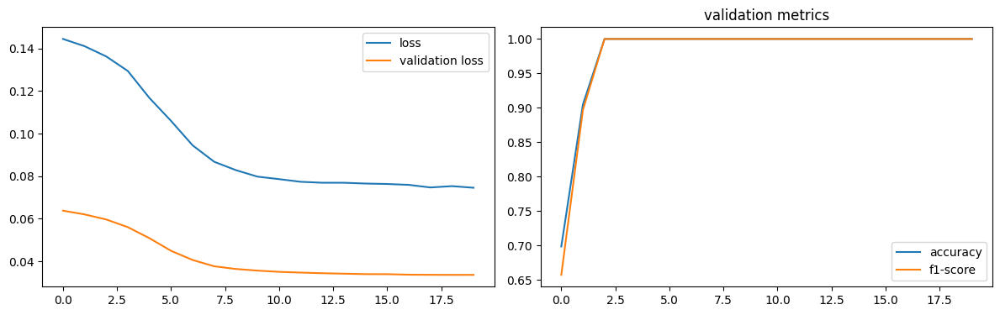

num of dropped: 2
Test: loss: 0.5988855361938477, avg metrics: (0.9750000357627868, 0.968170166015625)
dropping feature: (5, 'Flavanoids')


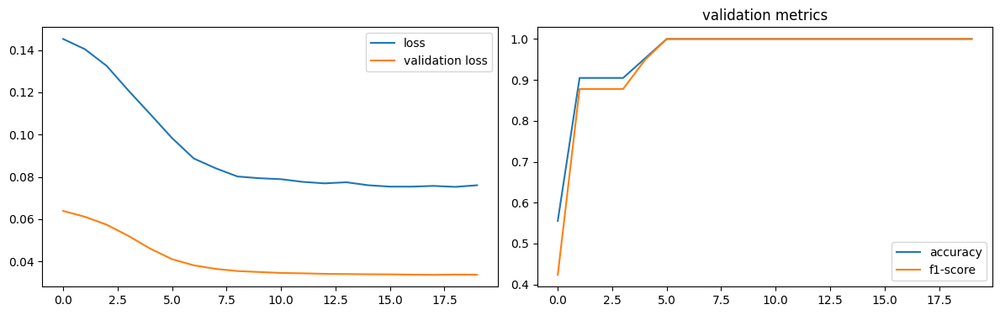

num of dropped: 3
Test: loss: 0.5989266633987427, avg metrics: (0.9638889074325562, 0.9540316462516785)
dropping feature: (3, 'Magnesium')


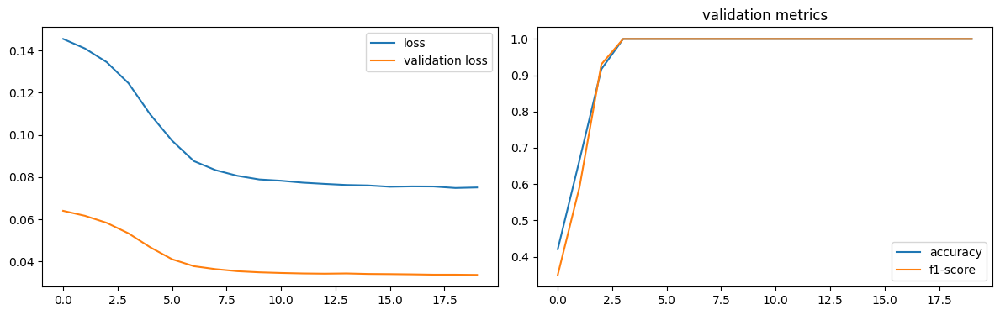

num of dropped: 4
Test: loss: 0.5670080780982971, avg metrics: (1.0, 1.0)
dropping feature: (3, 'Total_phenols')


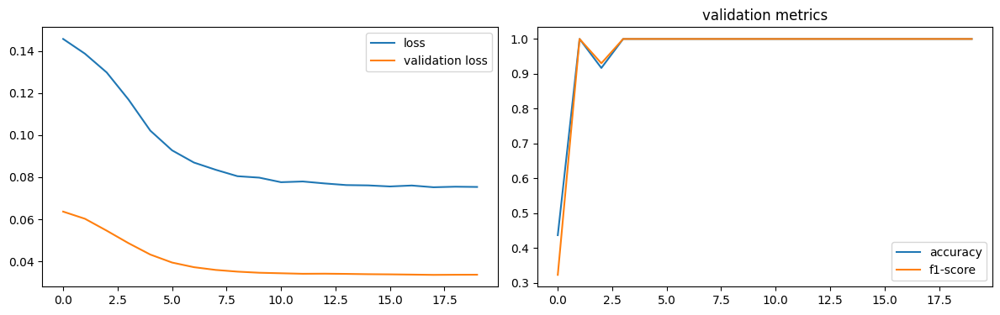

num of dropped: 5
Test: loss: 0.5732084512710571, avg metrics: (0.9911111116409301, 0.9926811933517456)
dropping feature: (3, 'Proanthocyanins')


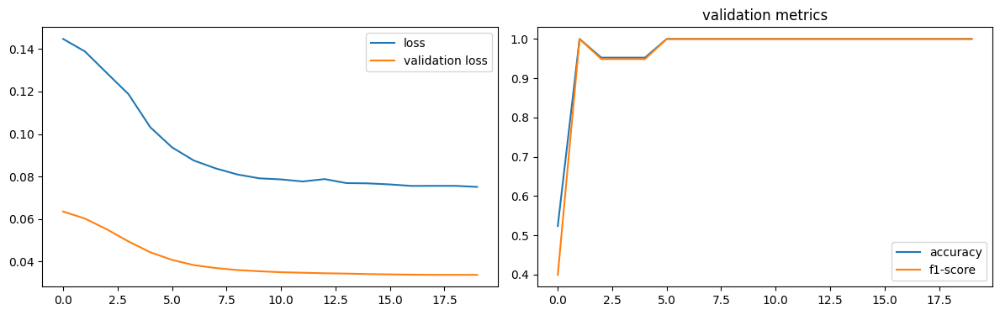

num of dropped: 6
Test: loss: 0.5742278099060059, avg metrics: (0.9927777767181396, 0.9927716135978699)
dropping feature: (2, 'Alcalinity_of_ash')


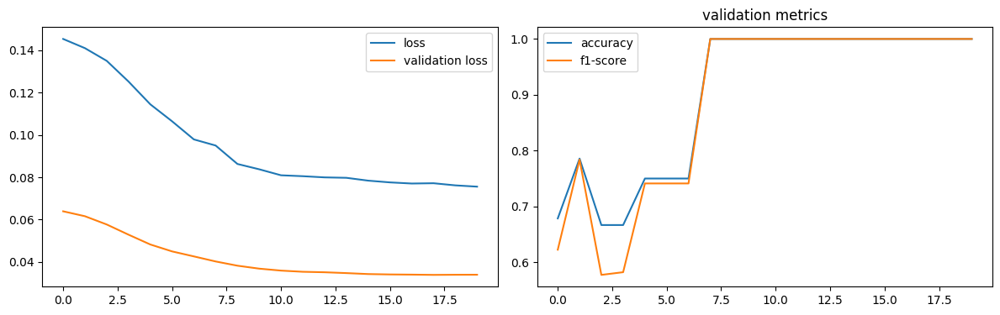

num of dropped: 7
Test: loss: 0.5835782885551453, avg metrics: (0.9861111044883728, 0.9821550846099854)
dropping feature: (1, 'Ash')


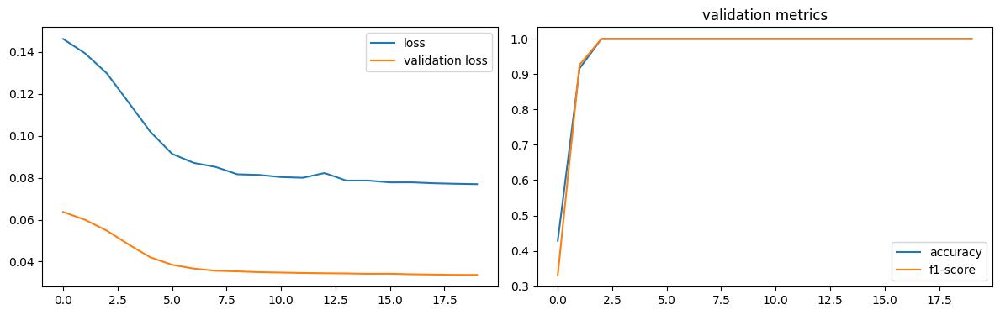

num of dropped: 8
Test: loss: 0.5977451205253601, avg metrics: (0.9722222685813904, 0.9646535515785217)
dropping feature: (0, 'Alcohol')


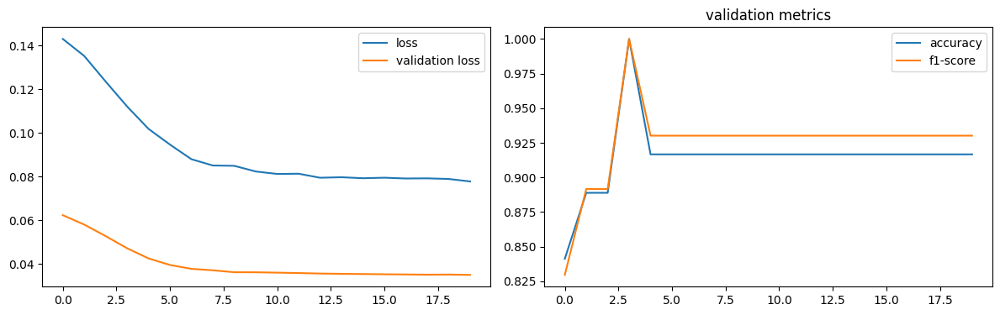

num of dropped: 9
Test: loss: 0.6252469420433044, avg metrics: (0.9277777791023254, 0.9181793212890625)
dropping feature: (1, 'Hue')


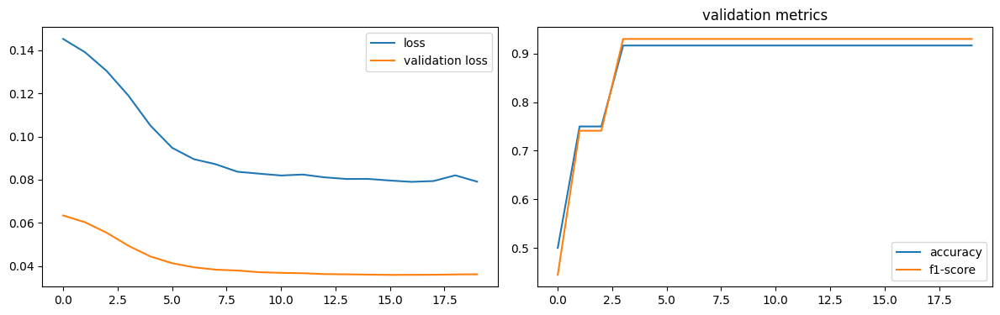

num of dropped: 10
Test: loss: 0.6346035599708557, avg metrics: (0.9305555701255799, 0.9216516971588135)
dropping feature: (1, '0D280_0D315_of_diluted_wines')


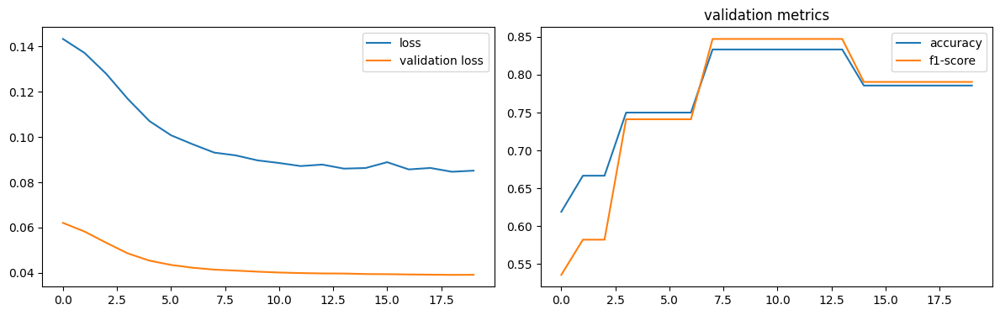

num of dropped: 11
Test: loss: 0.6825060844421387, avg metrics: (0.8708332896232605, 0.8600168228149414)
dropping feature: (0, 'Color_intensity')


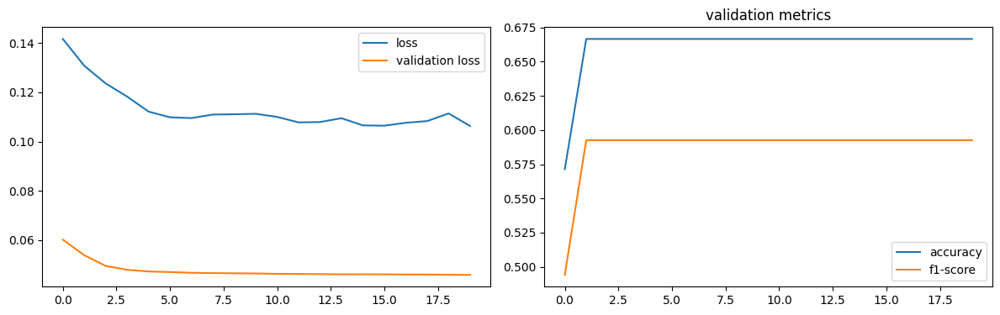

num of dropped: 12
Test: loss: 0.8761847615242004, avg metrics: (0.6372222423553466, 0.5870784401893616)


In [11]:
torch.manual_seed(2024)

datasets = wine_datasets.copy()
headers = wine_headers.copy()


def model_factory(size):
    return WineNN(size)


test_metrics, dropped, models = prune(
    datasets, headers, analyze_dgsm,
    model_factory, optimizer_factory, criterion, score_outputs, 20,
    labels, "", None
)

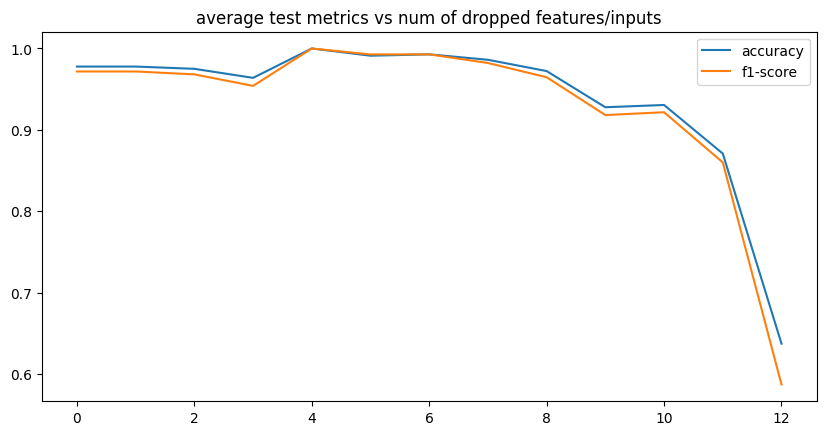

In [12]:
plot_dropping_metrics(test_metrics, labels)

In [13]:
num_drop_features = 6

save_models("wine", "dgsm-layer1", models, dropped)

reduced_datasets, reduced_headers = reduce_datasets(datasets, headers, dropped, num_drop_features)
layer = models[num_drop_features].layer1

best_model.layer1 = layer

dgsm_datasets = reduced_datasets

features left [7]:  ['Alcohol', 'Ash', 'Alcalinity_of_ash', 'Color_intensity', 'Hue', '0D280_0D315_of_diluted_wines', 'Proline']


### 1st hidden layer

In [14]:
layer.eval()

datasets = {
    key: TensorDataset(
        layer(dataset.tensors[0]).detach(),
        dataset.tensors[1]
    )
    for key, dataset in reduced_datasets.items()
}

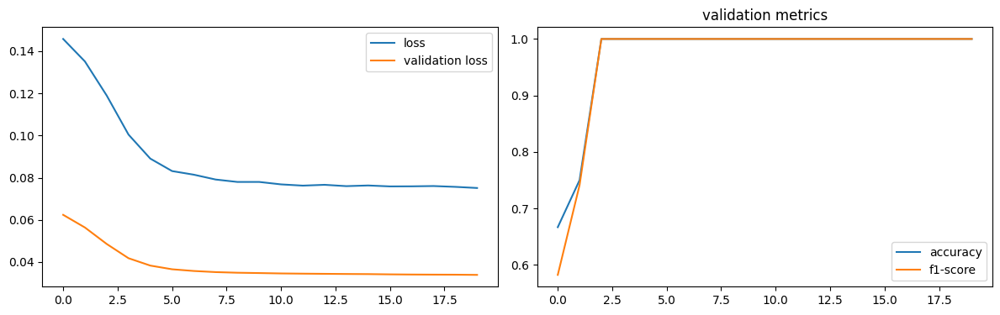

num of dropped: 0
Test: loss: 0.5744511485099792, avg metrics: (0.975, 0.9781401634216309)
dropping feature: (59, 'neuron59')


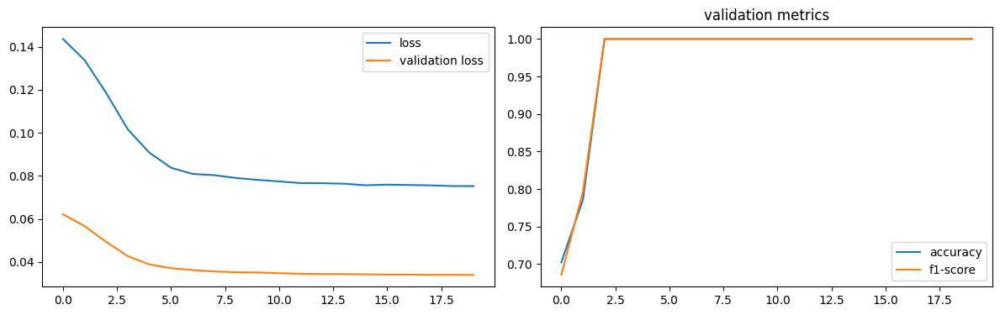

num of dropped: 1
Test: loss: 0.5769417881965637, avg metrics: (0.9694444417953492, 0.9710145235061646)
dropping feature: (15, 'neuron15')


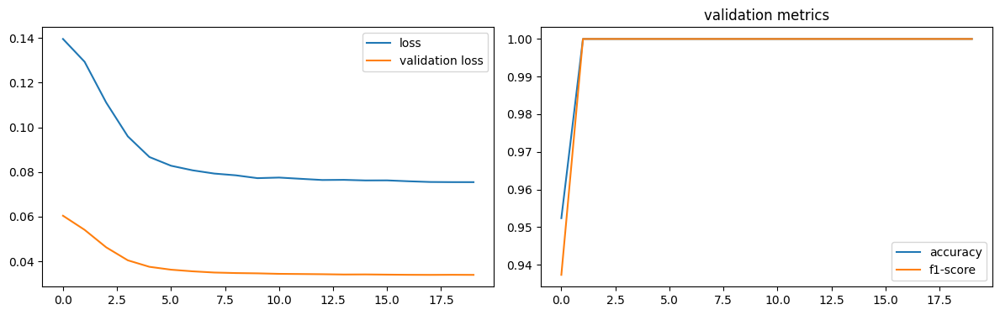

num of dropped: 2
Test: loss: 0.5777105689048767, avg metrics: (0.9722222208976745, 0.9745773434638977)
dropping feature: (6, 'neuron6')


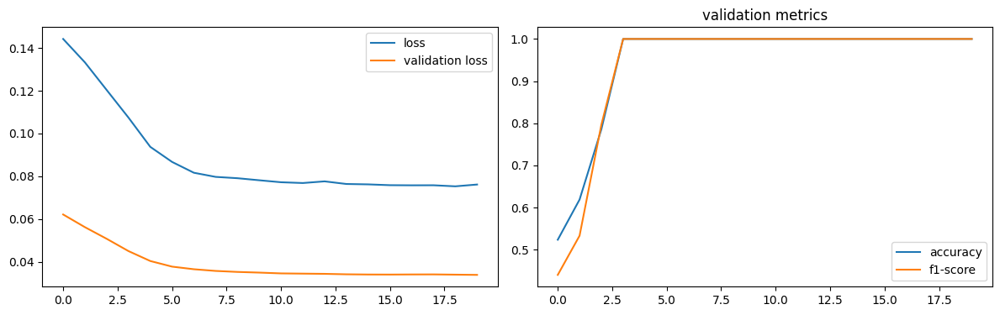

num of dropped: 3
Test: loss: 0.573963463306427, avg metrics: (0.975, 0.9781401634216309)
dropping feature: (60, 'neuron63')


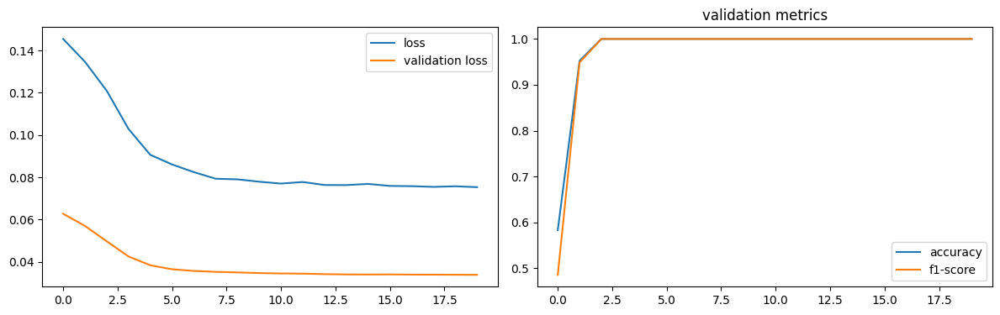

num of dropped: 4
Test: loss: 0.5768209099769592, avg metrics: (0.975, 0.9781401634216309)
dropping feature: (44, 'neuron46')


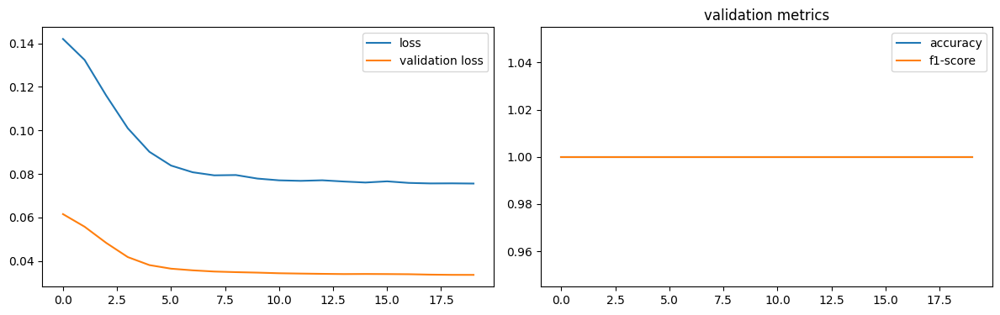

num of dropped: 5
Test: loss: 0.5753886103630066, avg metrics: (0.975, 0.9781401634216309)
dropping feature: (3, 'neuron3')


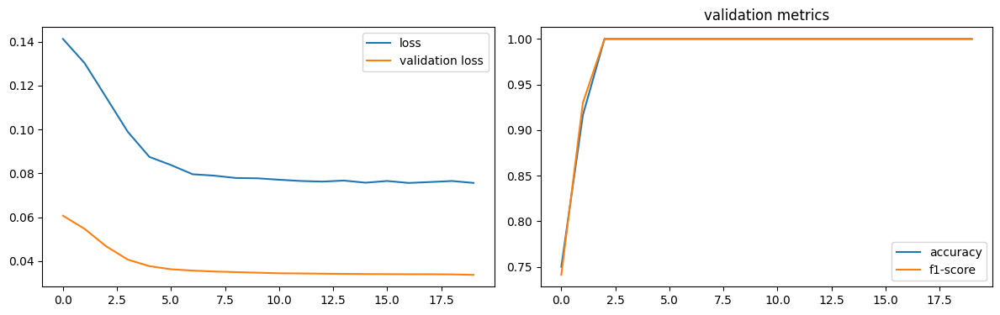

num of dropped: 6
Test: loss: 0.572705090045929, avg metrics: (0.9777777791023254, 0.981702983379364)
dropping feature: (50, 'neuron54')


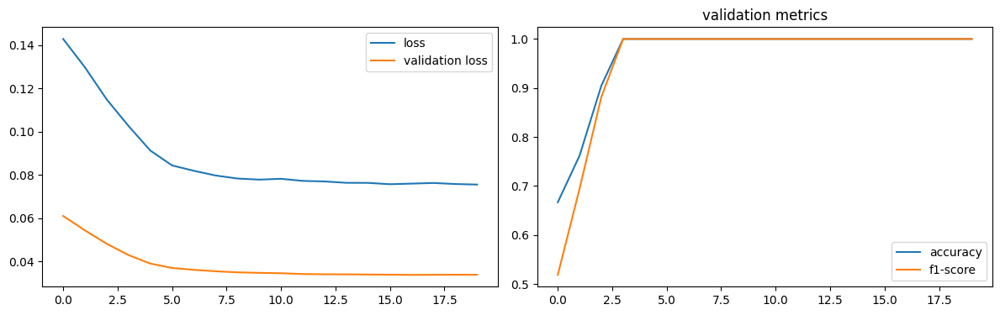

num of dropped: 7
Test: loss: 0.5802772641181946, avg metrics: (0.9722222208976745, 0.9745773434638977)
dropping feature: (46, 'neuron50')


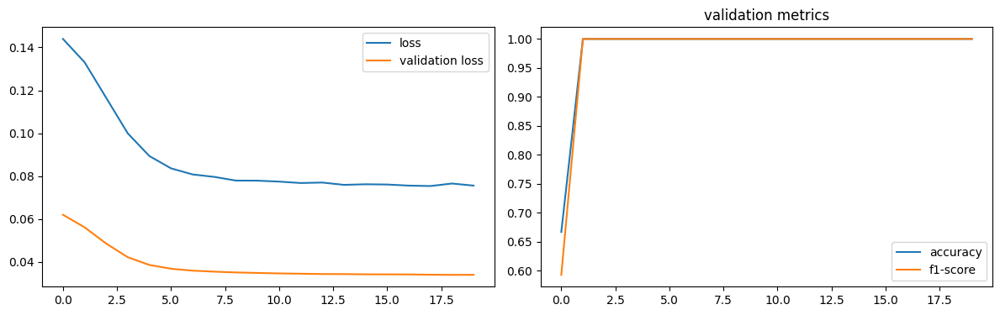

num of dropped: 8
Test: loss: 0.5736849904060364, avg metrics: (0.9777777791023254, 0.981702983379364)
dropping feature: (23, 'neuron26')


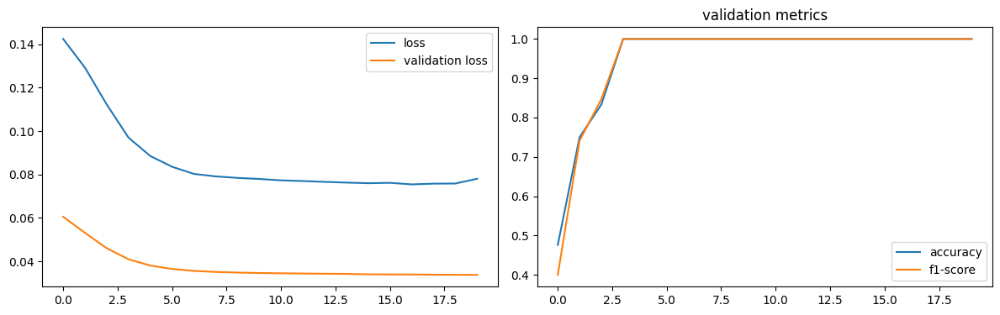

num of dropped: 9
Test: loss: 0.5771178603172302, avg metrics: (0.9722222208976745, 0.9745773434638977)
dropping feature: (1, 'neuron1')


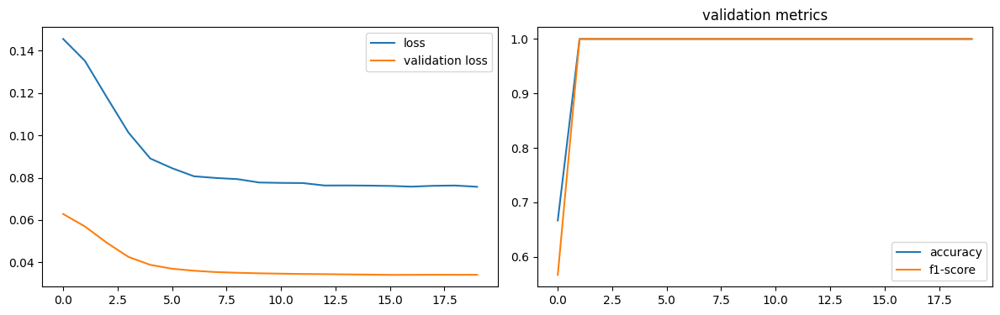

num of dropped: 10
Test: loss: 0.5722905993461609, avg metrics: (0.975, 0.9781401634216309)
dropping feature: (27, 'neuron32')


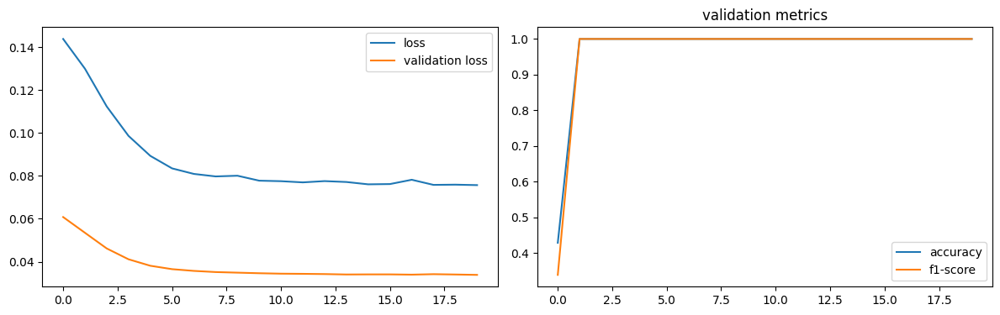

num of dropped: 11
Test: loss: 0.5779123306274414, avg metrics: (0.9694444417953492, 0.9710145235061646)
dropping feature: (35, 'neuron41')


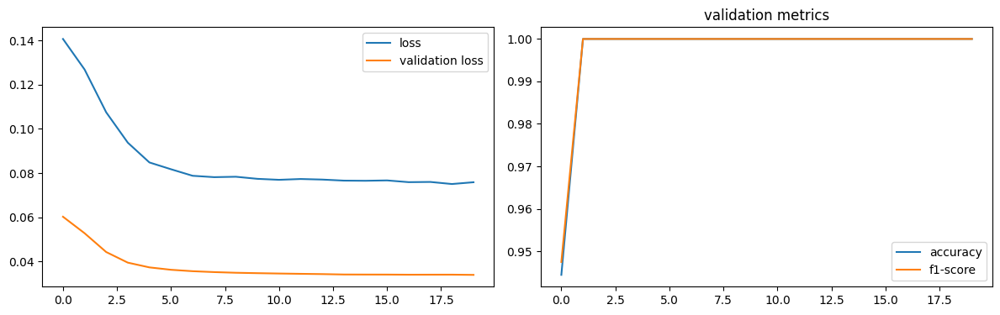

num of dropped: 12
Test: loss: 0.5738445520401001, avg metrics: (0.975, 0.9781401634216309)
dropping feature: (30, 'neuron36')


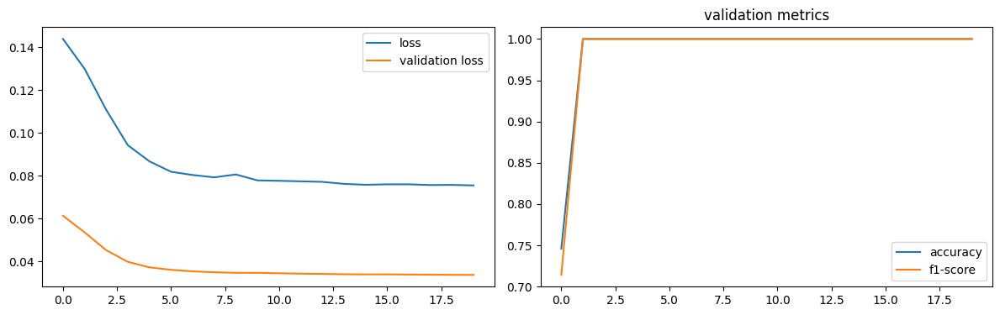

num of dropped: 13
Test: loss: 0.5761175155639648, avg metrics: (0.975, 0.9781401634216309)
dropping feature: (21, 'neuron25')


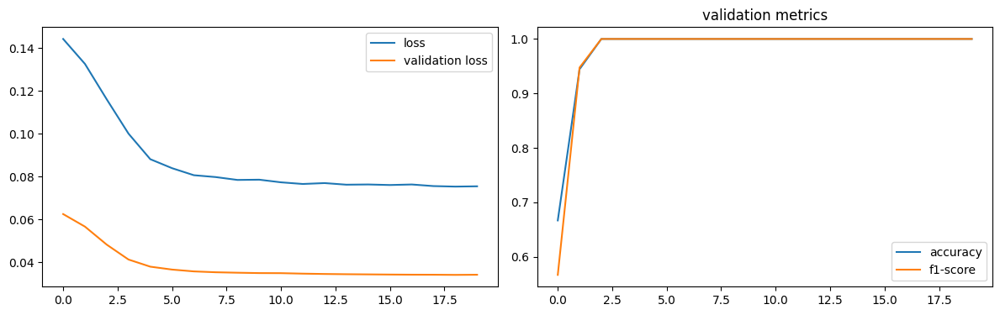

num of dropped: 14
Test: loss: 0.574400007724762, avg metrics: (0.975, 0.9781401634216309)
dropping feature: (48, 'neuron61')


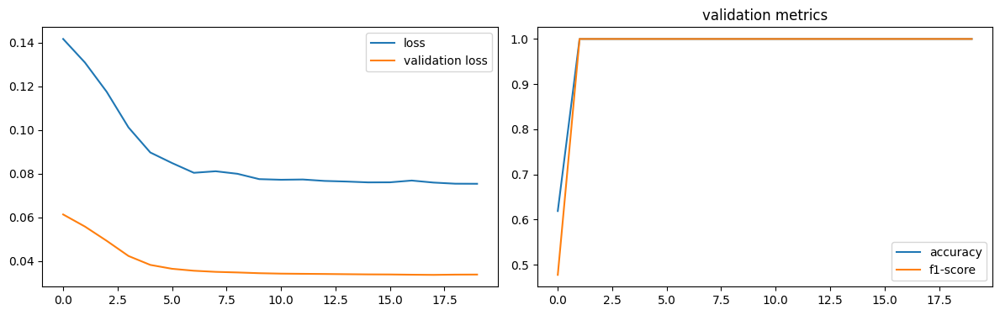

num of dropped: 15
Test: loss: 0.5742434859275818, avg metrics: (0.9722222208976745, 0.9745773434638977)
dropping feature: (0, 'neuron0')


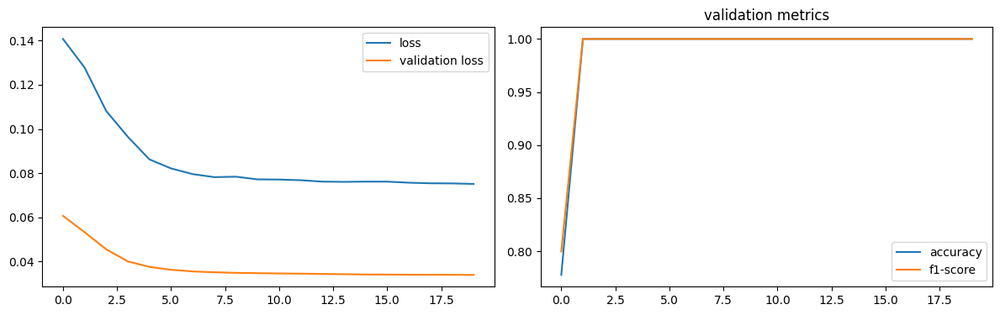

num of dropped: 16
Test: loss: 0.5735902190208435, avg metrics: (0.9777777791023254, 0.981702983379364)
dropping feature: (38, 'neuron49')


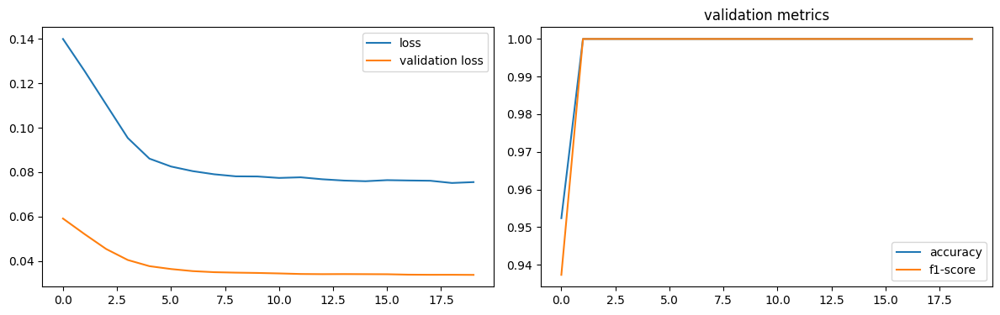

num of dropped: 17
Test: loss: 0.5741515159606934, avg metrics: (0.975, 0.9781401634216309)
dropping feature: (11, 'neuron16')


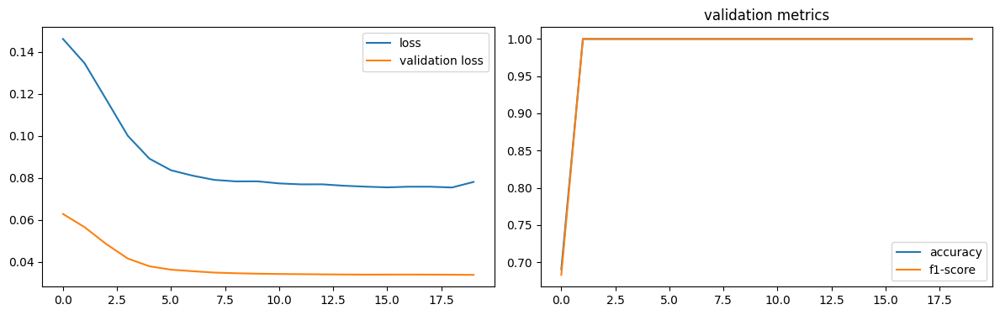

num of dropped: 18
Test: loss: 0.56915283203125, avg metrics: (0.9822222232818604, 0.9853623867034912)
dropping feature: (27, 'neuron37')


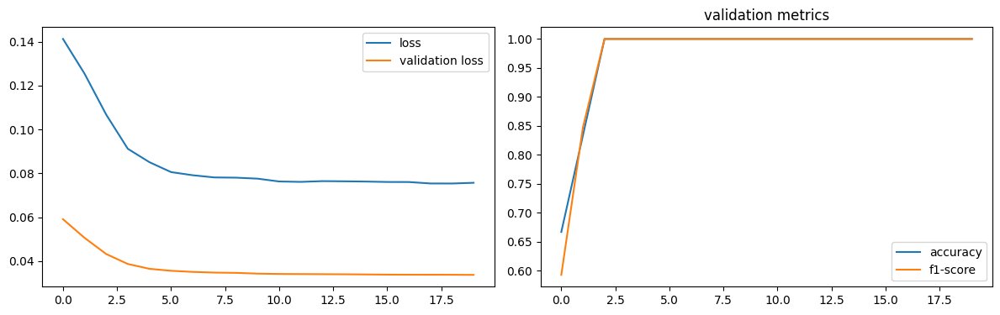

num of dropped: 19
Test: loss: 0.5747670531272888, avg metrics: (0.975, 0.9781401634216309)
dropping feature: (15, 'neuron21')


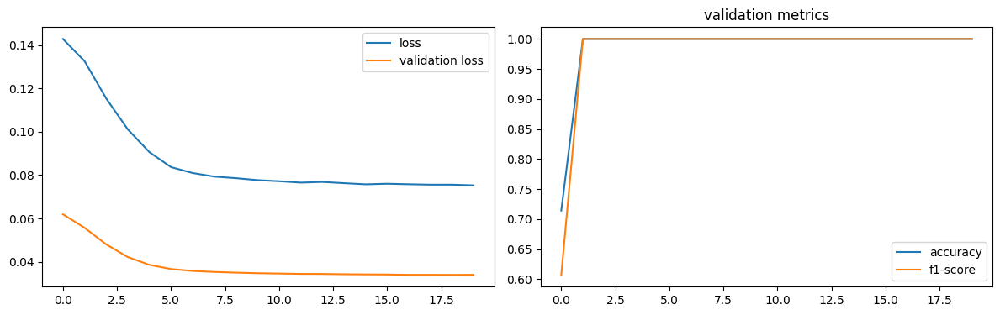

num of dropped: 20
Test: loss: 0.5767398476600647, avg metrics: (0.975, 0.9781401634216309)
dropping feature: (39, 'neuron56')


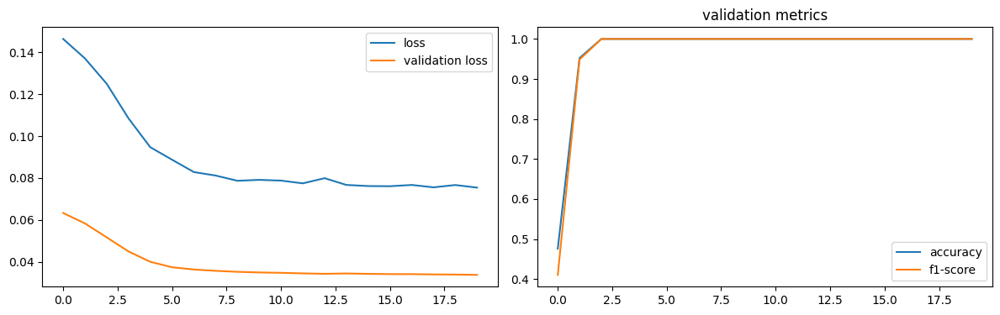

num of dropped: 21
Test: loss: 0.5757986307144165, avg metrics: (0.975, 0.9781401634216309)
dropping feature: (1, 'neuron4')


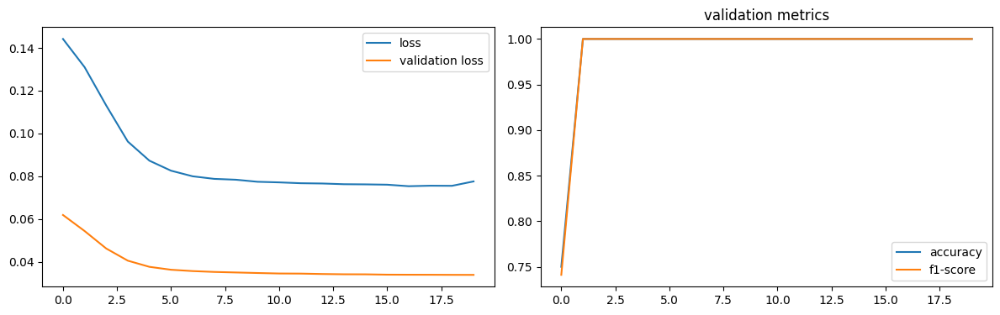

num of dropped: 22
Test: loss: 0.5728251934051514, avg metrics: (0.975, 0.9781401634216309)
dropping feature: (17, 'neuron27')


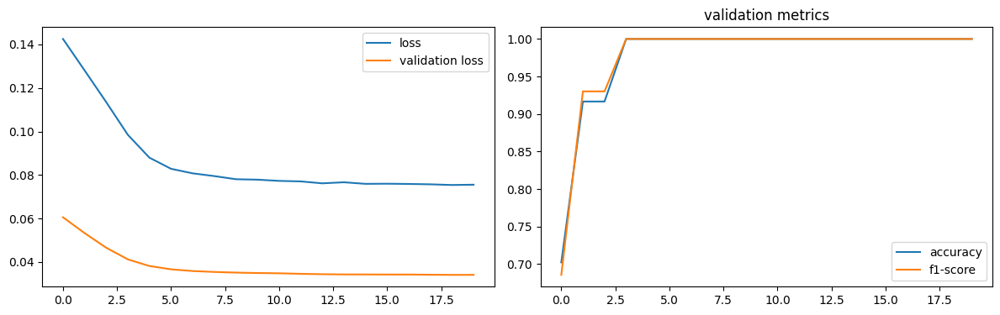

num of dropped: 23
Test: loss: 0.5755264759063721, avg metrics: (0.975, 0.9781401634216309)
dropping feature: (25, 'neuron39')


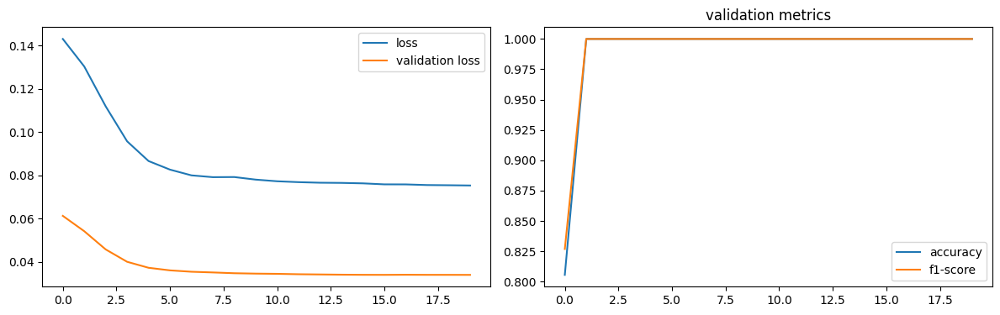

num of dropped: 24
Test: loss: 0.5755408406257629, avg metrics: (0.975, 0.9781401634216309)
dropping feature: (31, 'neuron48')


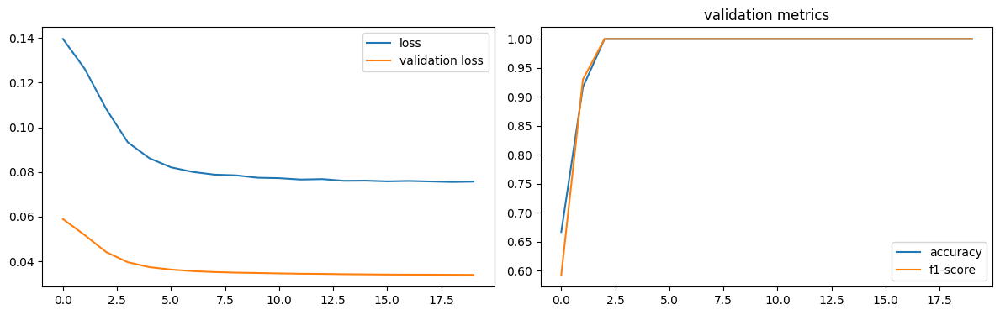

num of dropped: 25
Test: loss: 0.574306309223175, avg metrics: (0.9777777791023254, 0.981702983379364)
dropping feature: (26, 'neuron42')


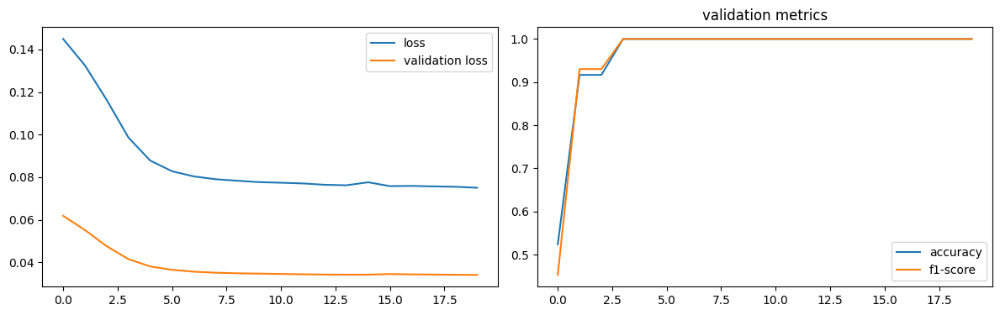

num of dropped: 26
Test: loss: 0.5747579336166382, avg metrics: (0.9777777791023254, 0.981702983379364)
dropping feature: (7, 'neuron12')


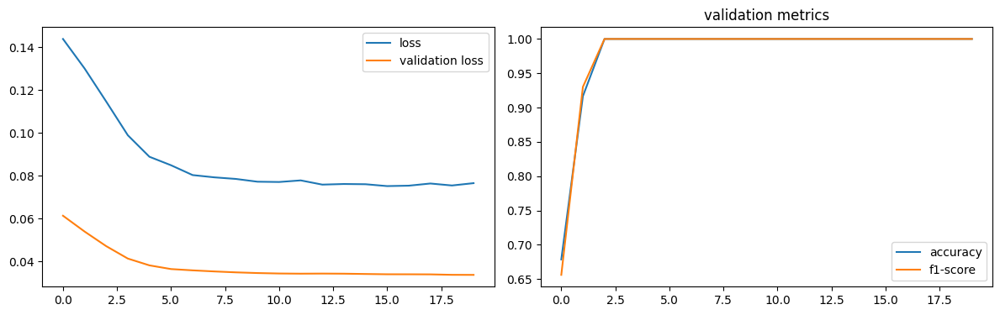

num of dropped: 27
Test: loss: 0.5716729760169983, avg metrics: (0.975, 0.9781401634216309)
dropping feature: (19, 'neuron31')


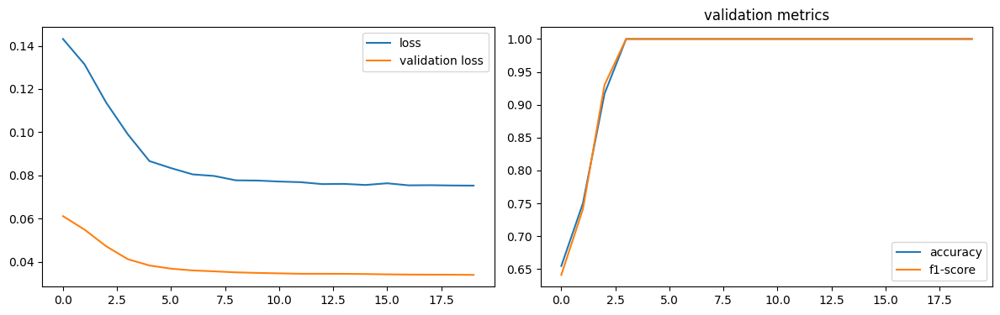

num of dropped: 28
Test: loss: 0.5738676190376282, avg metrics: (0.975, 0.9781401634216309)
dropping feature: (32, 'neuron57')


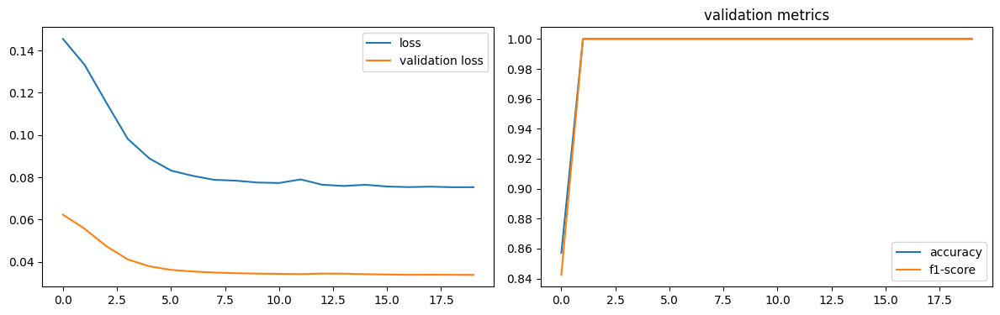

num of dropped: 29
Test: loss: 0.5760703682899475, avg metrics: (0.975, 0.9781401634216309)
dropping feature: (7, 'neuron13')


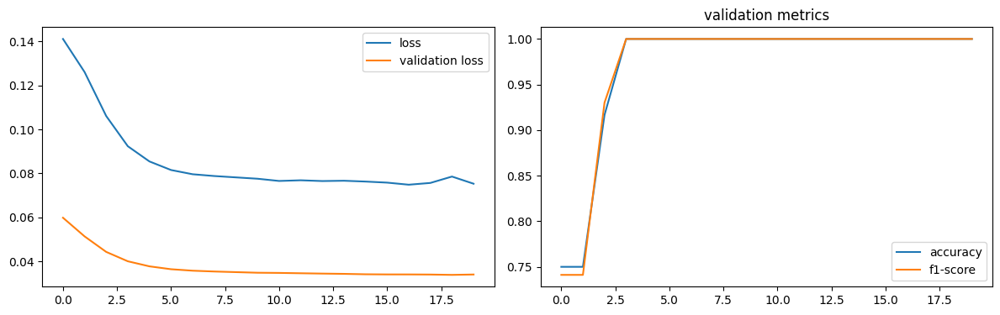

num of dropped: 30
Test: loss: 0.5734561085700989, avg metrics: (0.975, 0.9781401634216309)
dropping feature: (33, 'neuron62')


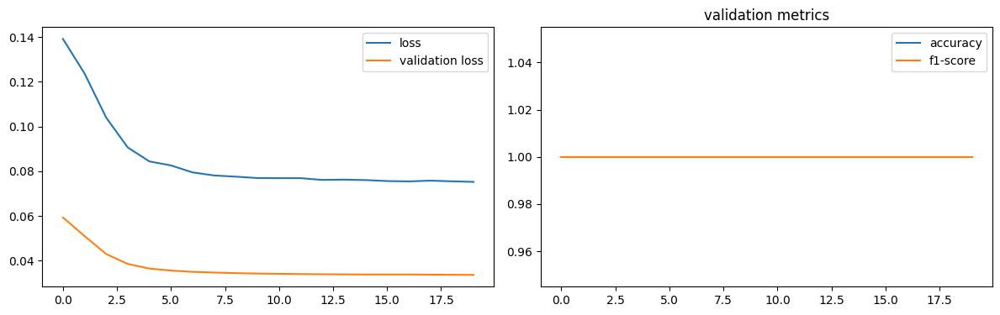

num of dropped: 31
Test: loss: 0.5768474340438843, avg metrics: (0.9722222208976745, 0.9745773434638977)
dropping feature: (9, 'neuron18')


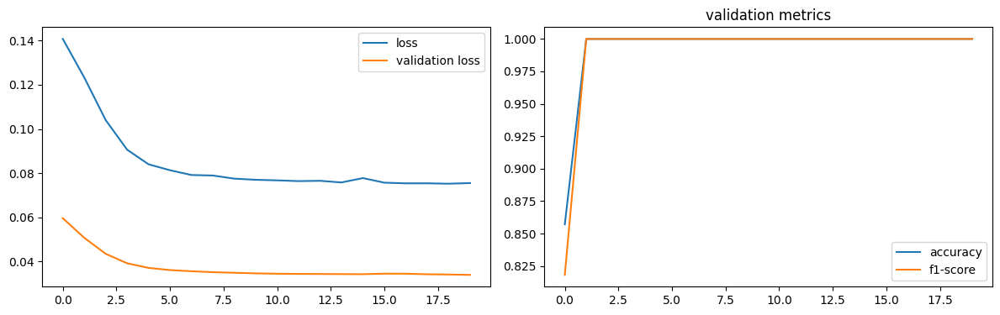

num of dropped: 32
Test: loss: 0.5770044326782227, avg metrics: (0.9722222208976745, 0.9745773434638977)
dropping feature: (0, 'neuron2')


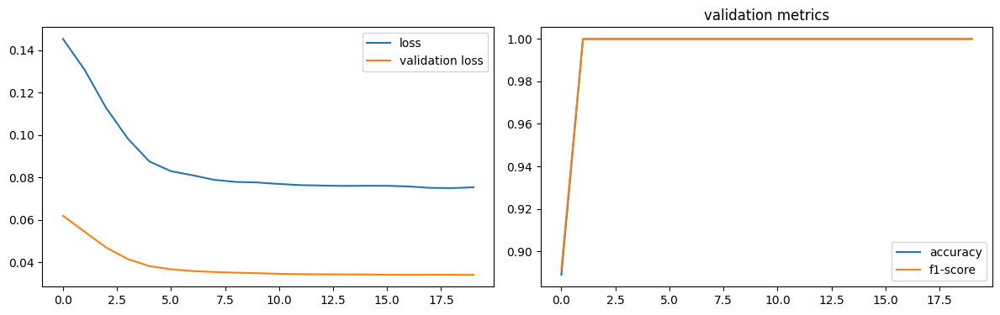

num of dropped: 33
Test: loss: 0.5758839845657349, avg metrics: (0.9777777791023254, 0.981702983379364)
dropping feature: (21, 'neuron43')


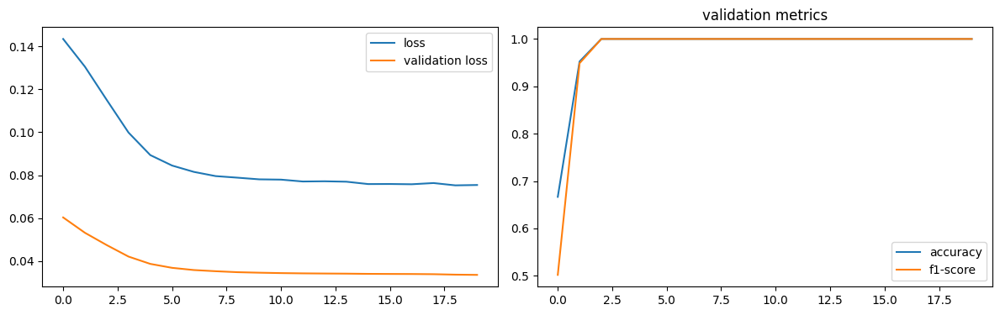

num of dropped: 34
Test: loss: 0.5780330300331116, avg metrics: (0.9722222208976745, 0.9745773434638977)
dropping feature: (22, 'neuron45')


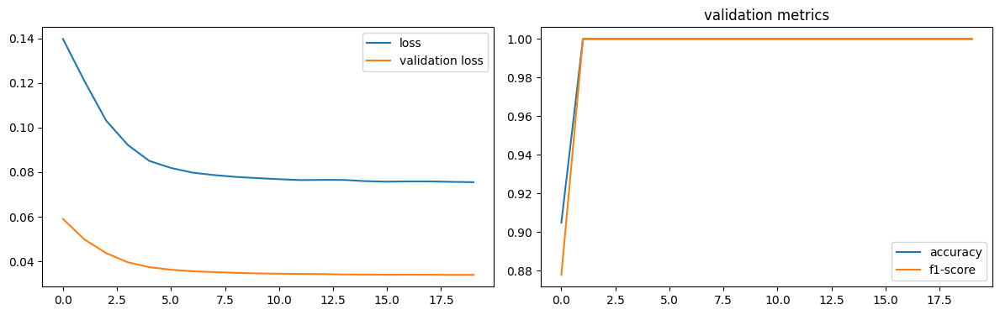

num of dropped: 35
Test: loss: 0.5732130408287048, avg metrics: (0.9777777791023254, 0.981702983379364)
dropping feature: (14, 'neuron29')


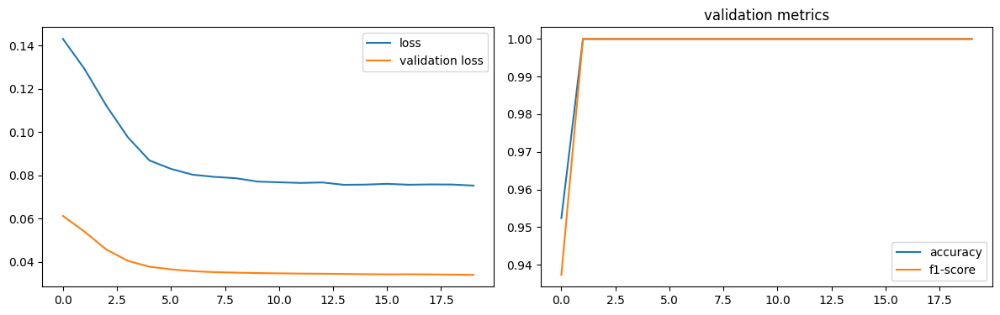

num of dropped: 36
Test: loss: 0.578413188457489, avg metrics: (0.9755555510520935, 0.974764347076416)
dropping feature: (15, 'neuron33')


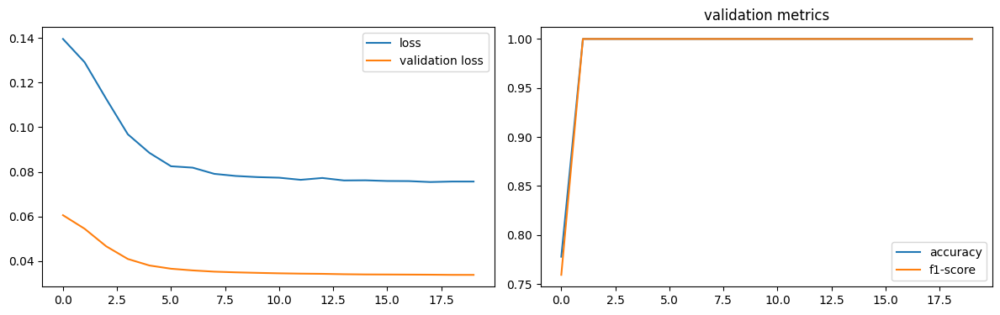

num of dropped: 37
Test: loss: 0.5703306794166565, avg metrics: (0.9766666650772095, 0.9782367467880249)
dropping feature: (22, 'neuron52')


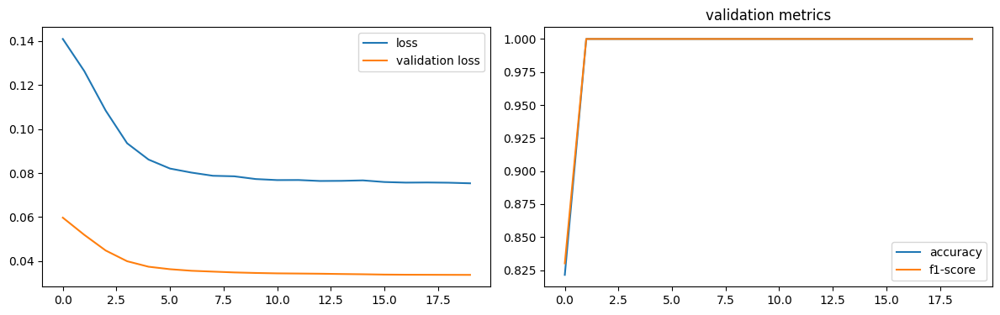

num of dropped: 38
Test: loss: 0.5715672373771667, avg metrics: (0.9822222232818604, 0.9853623867034912)
dropping feature: (14, 'neuron30')


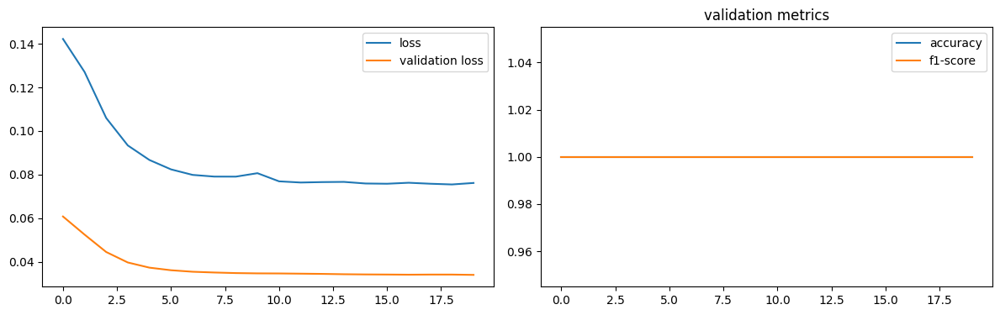

num of dropped: 39
Test: loss: 0.5724667310714722, avg metrics: (0.9777777791023254, 0.981702983379364)
dropping feature: (18, 'neuron44')


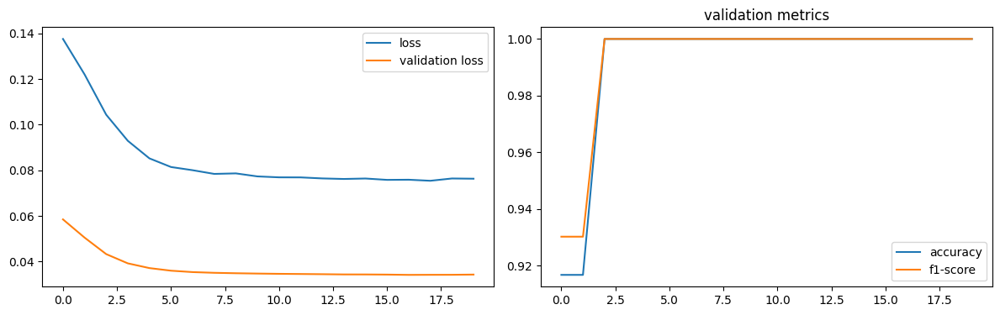

num of dropped: 40
Test: loss: 0.5701001286506653, avg metrics: (0.9777777791023254, 0.981702983379364)
dropping feature: (10, 'neuron22')


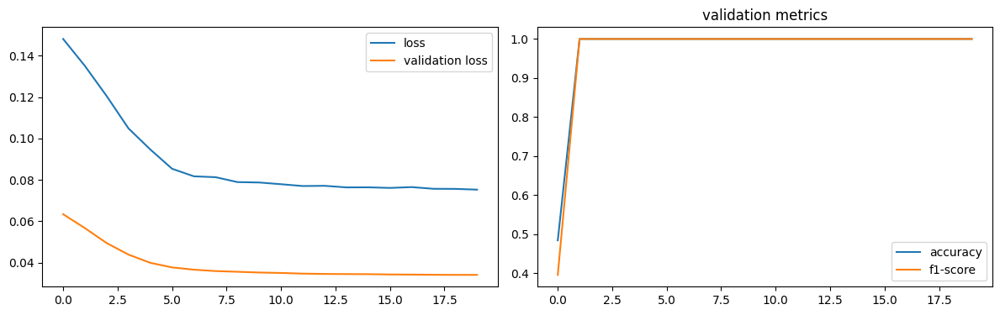

num of dropped: 41
Test: loss: 0.5728888511657715, avg metrics: (0.9777777791023254, 0.981702983379364)
dropping feature: (12, 'neuron28')


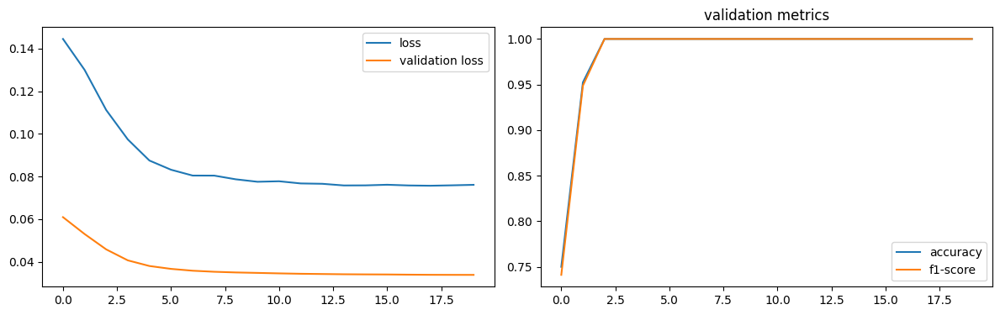

num of dropped: 42
Test: loss: 0.5701106190681458, avg metrics: (0.9866666674613953, 0.9890217900276184)
dropping feature: (7, 'neuron17')


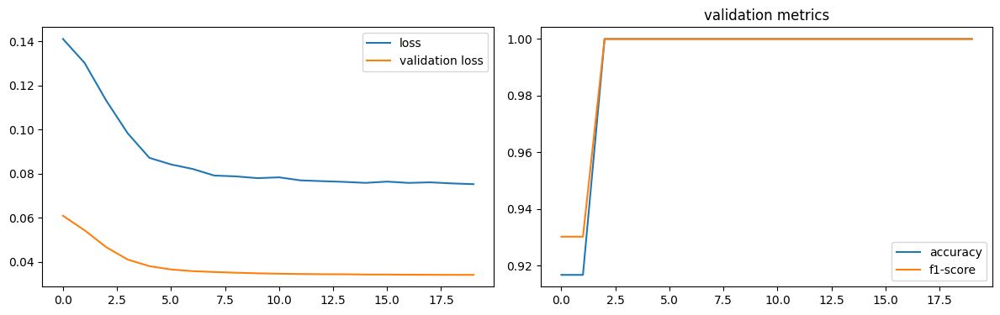

num of dropped: 43
Test: loss: 0.57195645570755, avg metrics: (0.9955555558204651, 0.9963405966758728)
dropping feature: (9, 'neuron23')


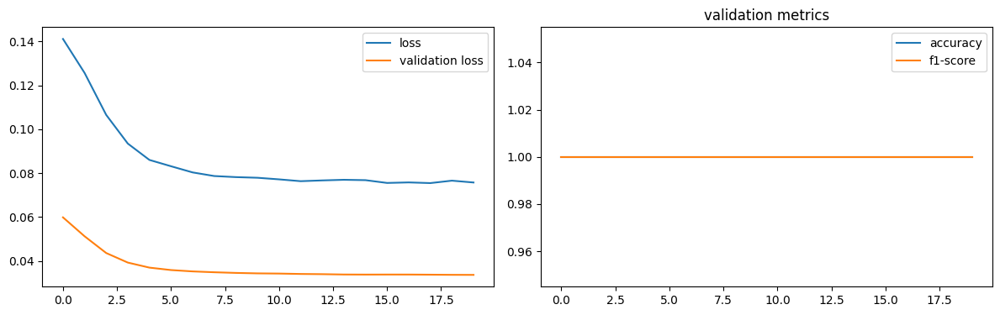

num of dropped: 44
Test: loss: 0.5688756704330444, avg metrics: (0.9955555558204651, 0.9963405966758728)
dropping feature: (18, 'neuron58')


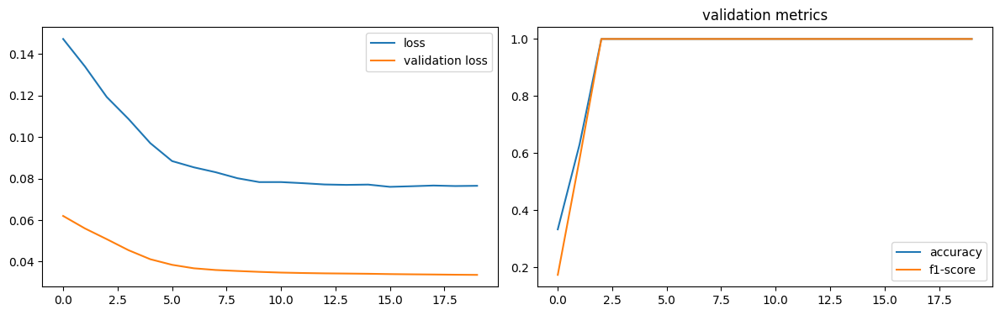

num of dropped: 45
Test: loss: 0.5697348713874817, avg metrics: (1.0, 1.0)
dropping feature: (4, 'neuron10')


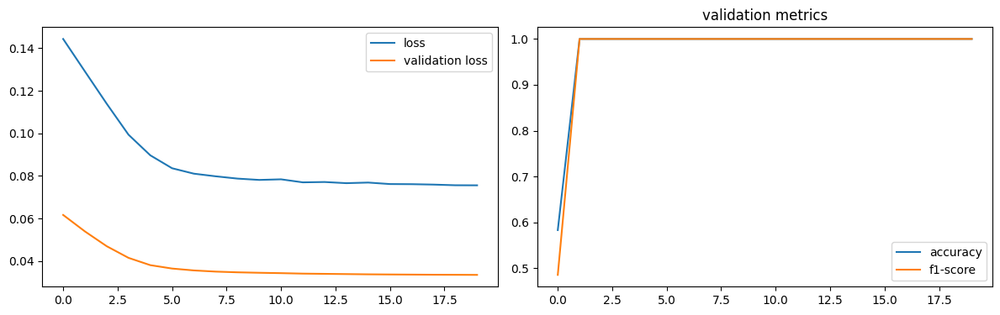

num of dropped: 46
Test: loss: 0.5694150328636169, avg metrics: (1.0, 1.0)
dropping feature: (7, 'neuron20')


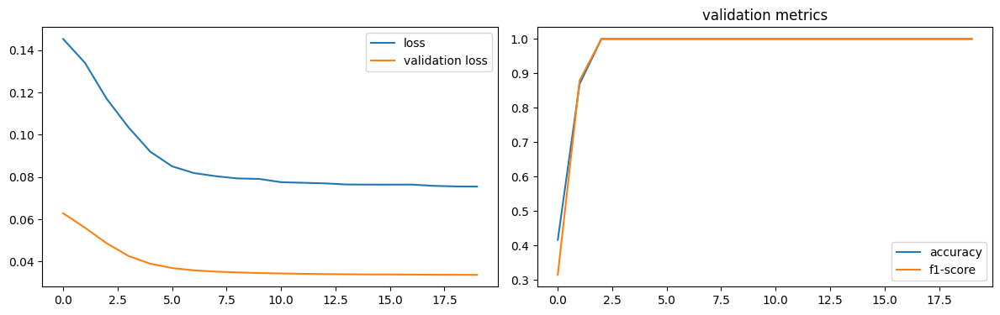

num of dropped: 47
Test: loss: 0.5674906373023987, avg metrics: (1.0, 1.0)
dropping feature: (2, 'neuron8')


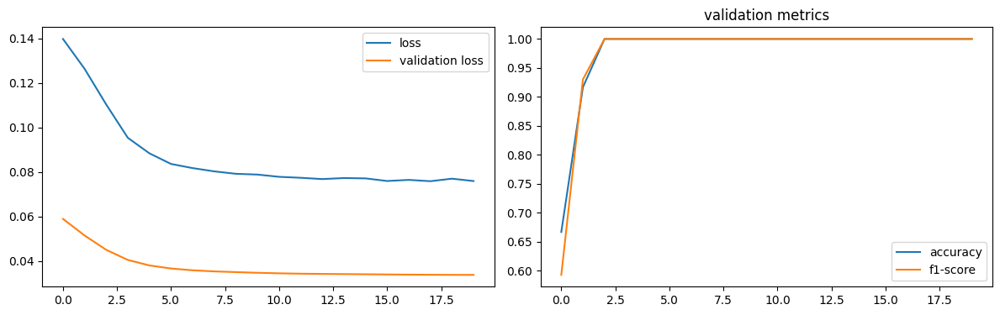

num of dropped: 48
Test: loss: 0.5669435858726501, avg metrics: (1.0, 1.0)
dropping feature: (14, 'neuron55')


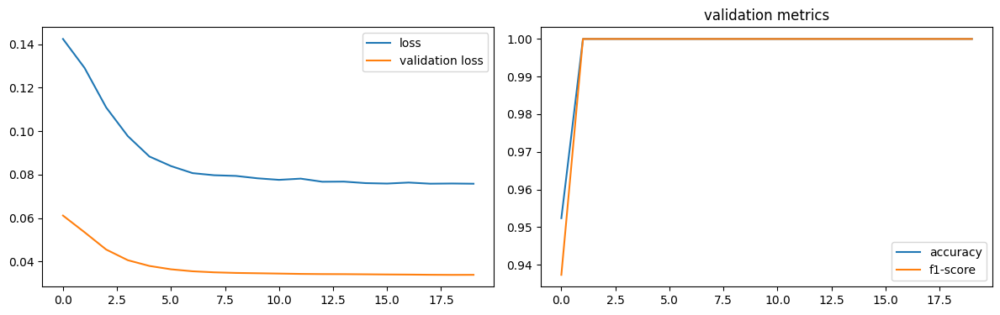

num of dropped: 49
Test: loss: 0.5660896897315979, avg metrics: (1.0, 1.0)
dropping feature: (10, 'neuron40')


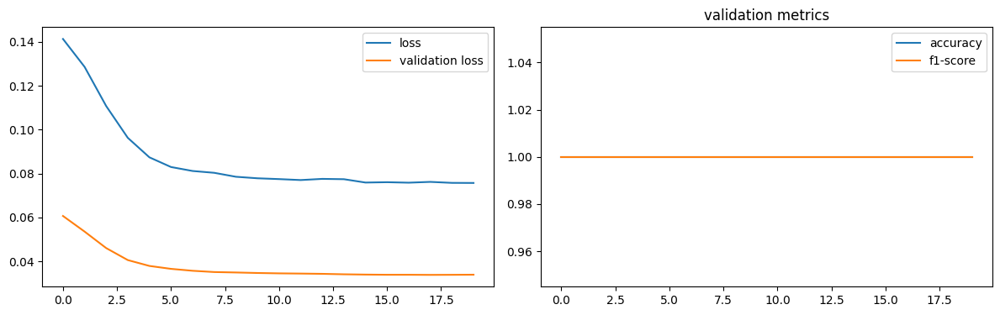

num of dropped: 50
Test: loss: 0.5721220374107361, avg metrics: (0.9927777767181396, 0.9927716135978699)
dropping feature: (7, 'neuron34')


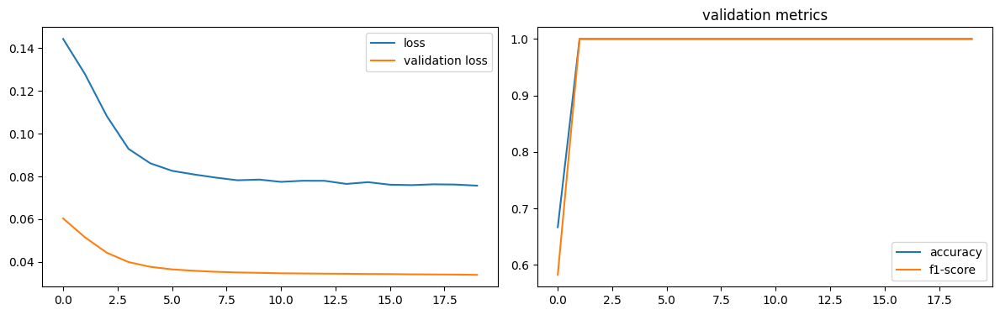

num of dropped: 51
Test: loss: 0.5691941380500793, avg metrics: (0.9927777767181396, 0.9927777767181396)
dropping feature: (8, 'neuron38')


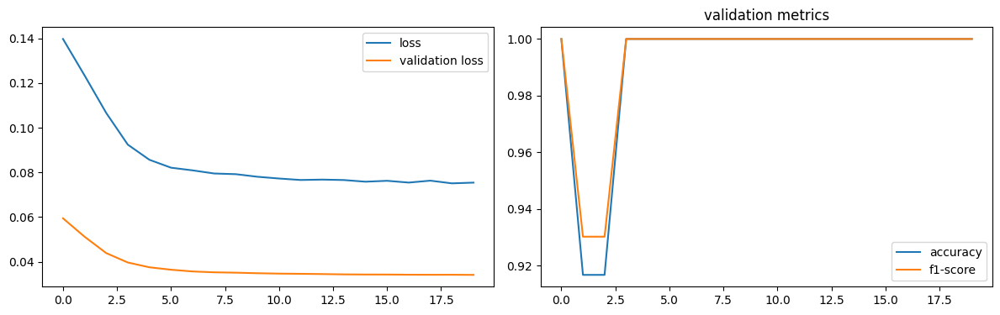

num of dropped: 52
Test: loss: 0.5689466595649719, avg metrics: (1.0, 1.0)
dropping feature: (0, 'neuron5')


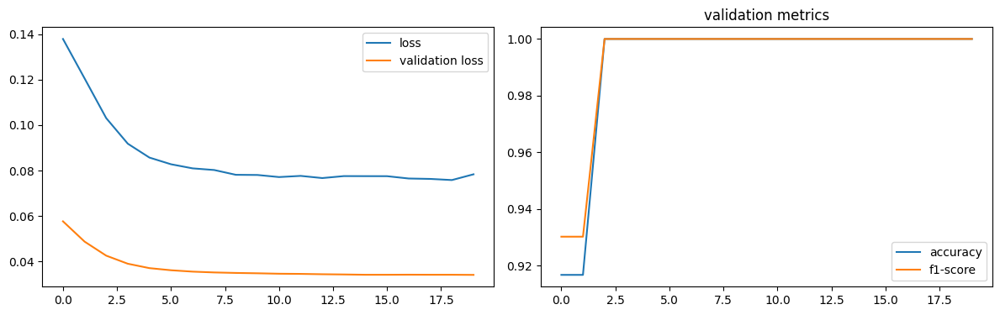

num of dropped: 53
Test: loss: 0.5718008279800415, avg metrics: (1.0, 1.0)
dropping feature: (0, 'neuron7')


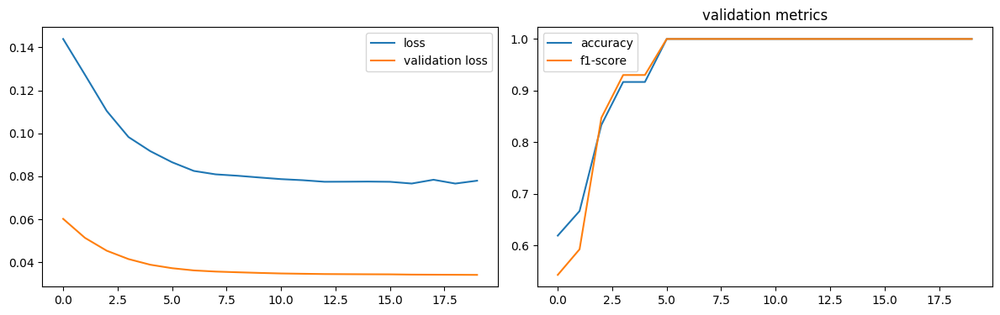

num of dropped: 54
Test: loss: 0.5749170184135437, avg metrics: (1.0, 1.0)
dropping feature: (1, 'neuron11')


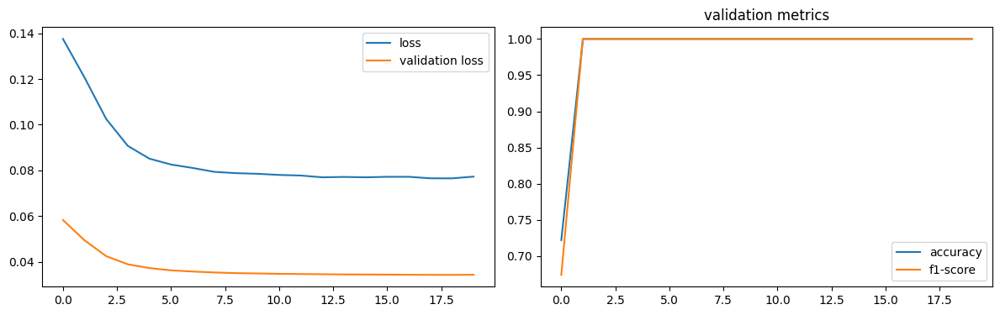

num of dropped: 55
Test: loss: 0.571902871131897, avg metrics: (0.9911111116409301, 0.9926811933517456)
dropping feature: (3, 'neuron24')


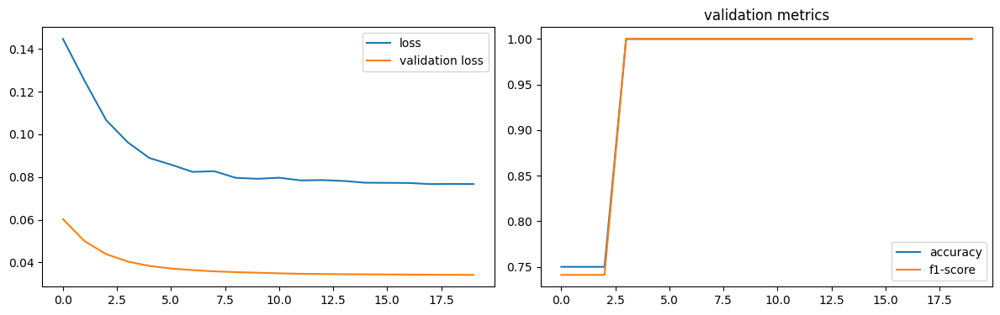

num of dropped: 56
Test: loss: 0.5744889378547668, avg metrics: (1.0, 1.0)
dropping feature: (3, 'neuron35')


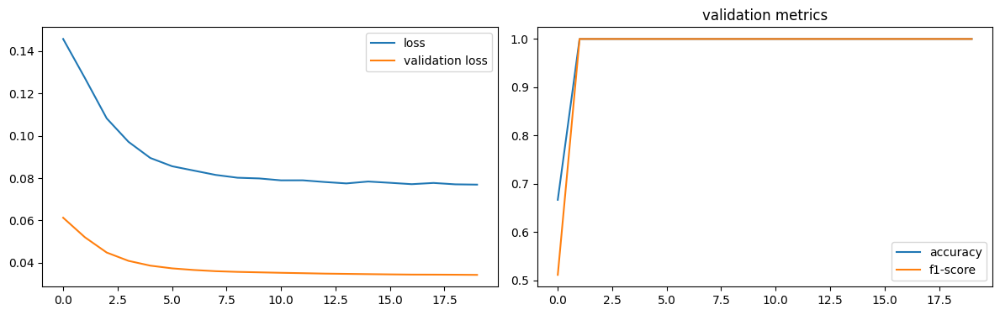

num of dropped: 57
Test: loss: 0.5811708569526672, avg metrics: (0.9972222208976745, 0.9964310169219971)
dropping feature: (0, 'neuron9')


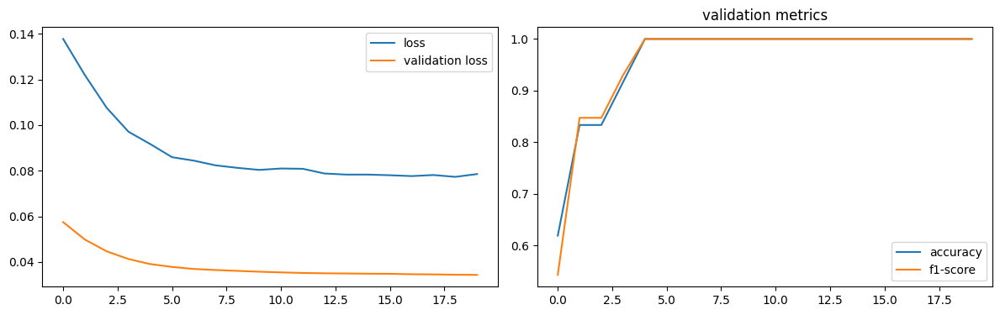

num of dropped: 58
Test: loss: 0.5838345885276794, avg metrics: (0.9944444417953491, 0.9928620338439942)
dropping feature: (0, 'neuron14')


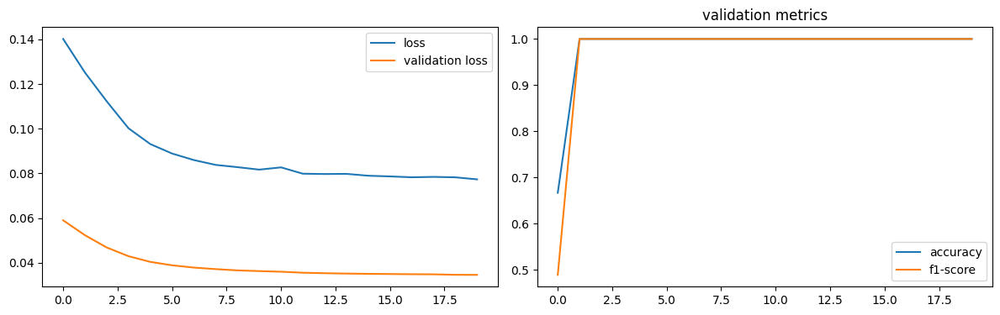

num of dropped: 59
Test: loss: 0.587699294090271, avg metrics: (0.9694444417953492, 0.9710145235061646)
dropping feature: (4, 'neuron60')


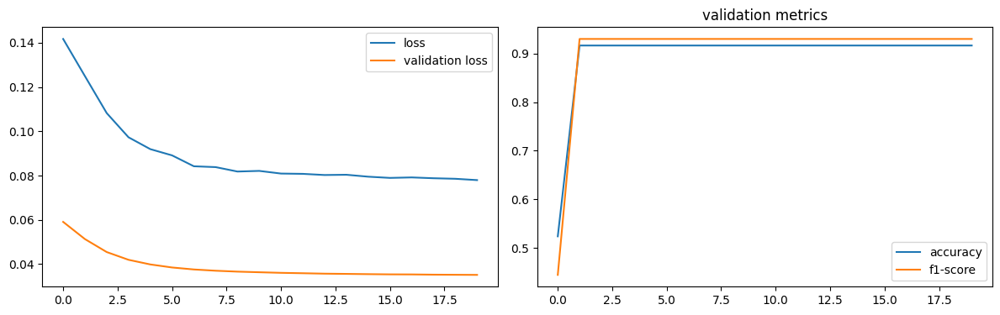

num of dropped: 60
Test: loss: 0.5916509032249451, avg metrics: (0.9638888835906982, 0.9638888835906982)
dropping feature: (2, 'neuron51')


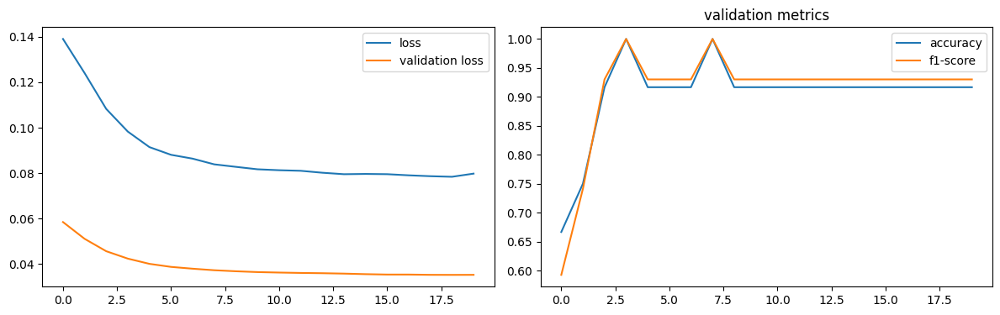

num of dropped: 61
Test: loss: 0.5957545638084412, avg metrics: (0.9816666603088379, 0.978501844406128)
dropping feature: (0, 'neuron19')


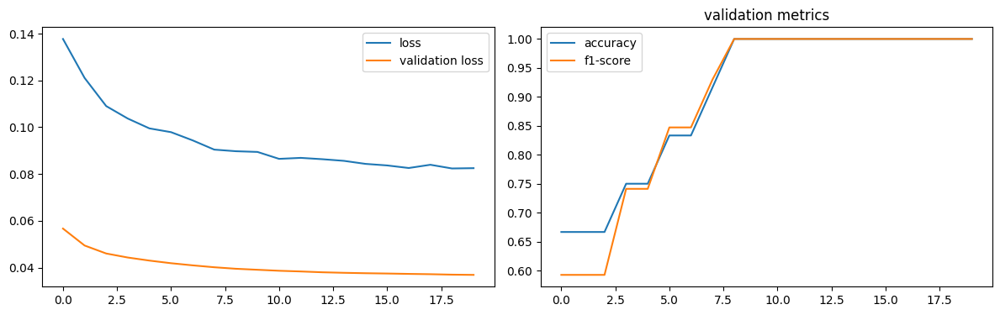

num of dropped: 62
Test: loss: 0.6301488280296326, avg metrics: (0.9638888835906982, 0.9605845808982849)
dropping feature: (0, 'neuron47')


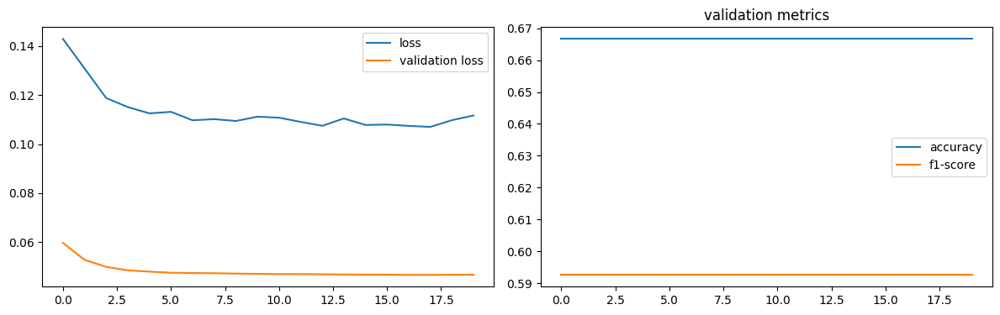

num of dropped: 63
Test: loss: 0.8671151399612427, avg metrics: (0.6305555701255798, 0.550694465637207)


In [15]:
torch.manual_seed(2024)

headers = [f"neuron{i}" for i in range(64)]


def model_factory(size):
    model = WineNN(1, (size, 64))
    model.layer1 = nn.Identity()
    return model


test_metrics, dropped, models = prune(
    datasets, headers, analyze_dgsm,
    model_factory, optimizer_factory, criterion, score_outputs, 20,
    labels, "", None
)

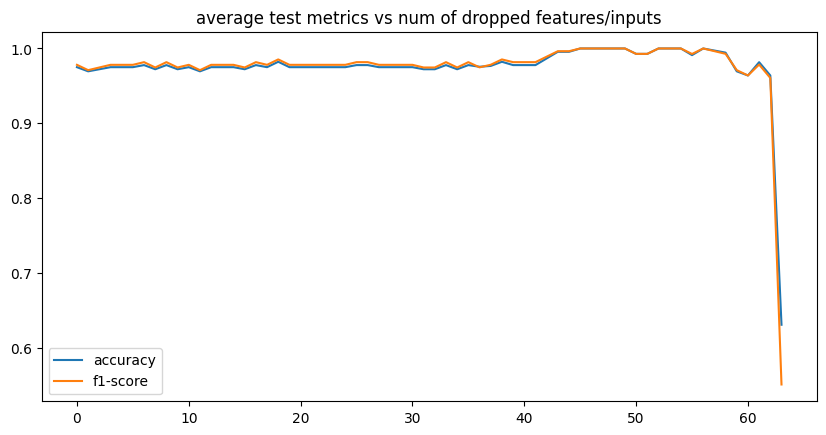

In [16]:
plot_dropping_metrics(test_metrics, labels)

In [17]:
num_drop_neurons = 56

save_models("wine", "dgsm-layer2", models, dropped)

reduced_datasets, reduced_headers = reduce_datasets(datasets, headers, dropped, num_drop_neurons)
layer = models[num_drop_neurons].layer2

best_model.layer2 = layer
best_model.layer1[0] = reduce_linear(best_model.layer1[0], dropped, num_drop_neurons)

features left [8]:  ['neuron9', 'neuron14', 'neuron19', 'neuron35', 'neuron47', 'neuron51', 'neuron53', 'neuron60']


### 2nd hidden layer

In [18]:
layer.eval()

datasets = {
    key: TensorDataset(
        layer(dataset.tensors[0]).detach(),
        dataset.tensors[1]
    )
    for key, dataset in reduced_datasets.items()
}

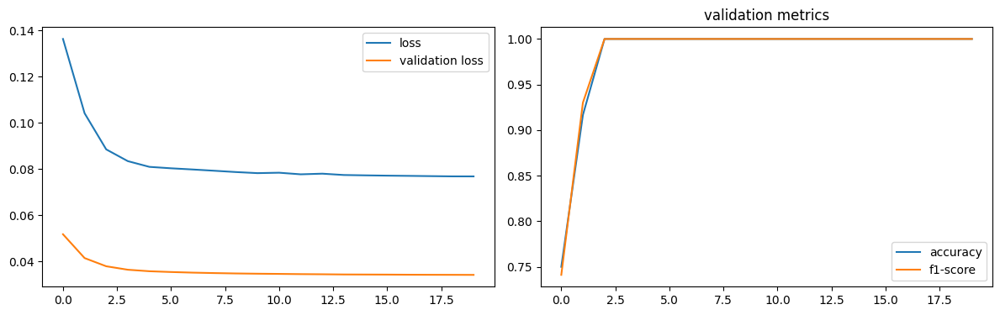

num of dropped: 0
Test: loss: 0.5764079093933105, avg metrics: (1.0, 1.0)
dropping feature: (17, 'neuron17')


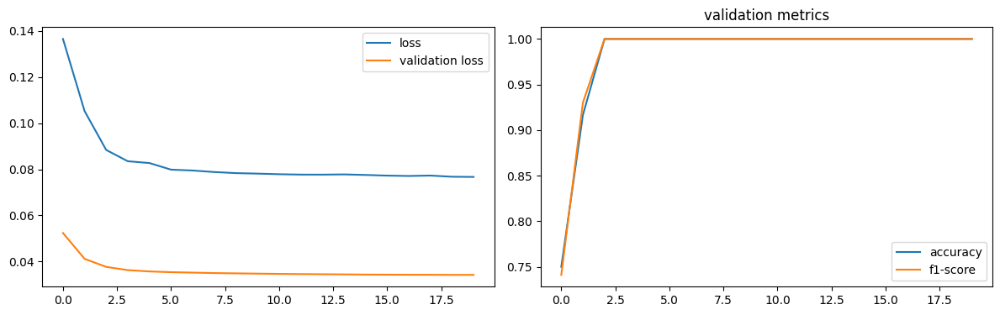

num of dropped: 1
Test: loss: 0.5756295919418335, avg metrics: (1.0, 1.0)
dropping feature: (3, 'neuron3')


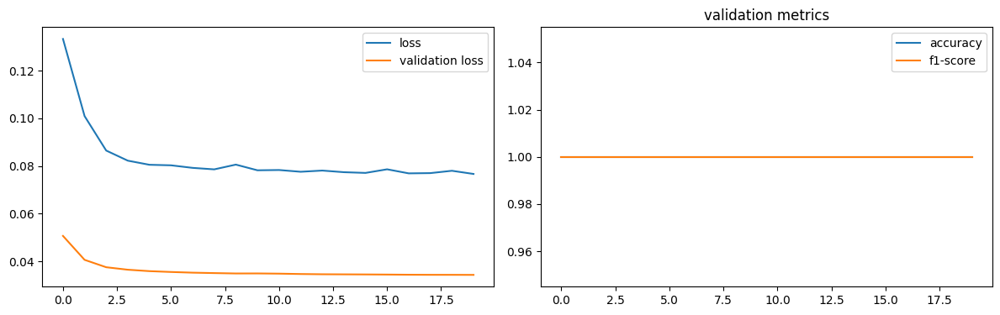

num of dropped: 2
Test: loss: 0.5761755704879761, avg metrics: (1.0, 1.0)
dropping feature: (32, 'neuron34')


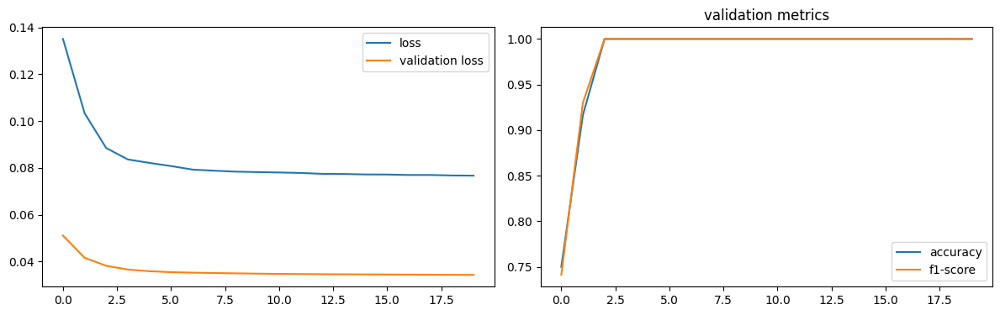

num of dropped: 3
Test: loss: 0.5764901638031006, avg metrics: (1.0, 1.0)
dropping feature: (14, 'neuron15')


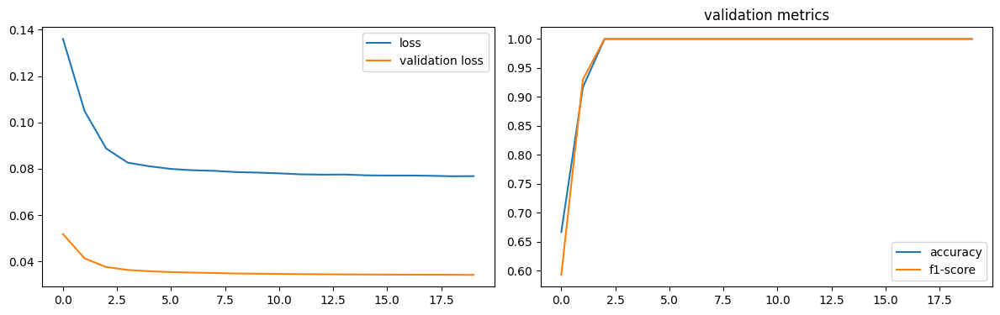

num of dropped: 4
Test: loss: 0.5763874650001526, avg metrics: (1.0, 1.0)
dropping feature: (50, 'neuron54')


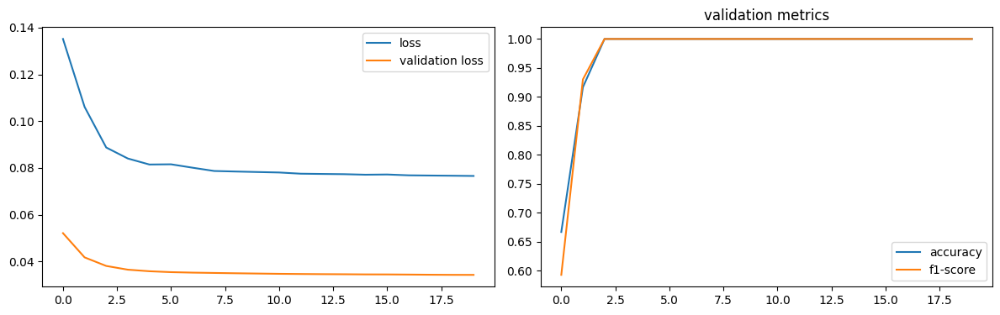

num of dropped: 5
Test: loss: 0.5760391354560852, avg metrics: (1.0, 1.0)
dropping feature: (49, 'neuron53')


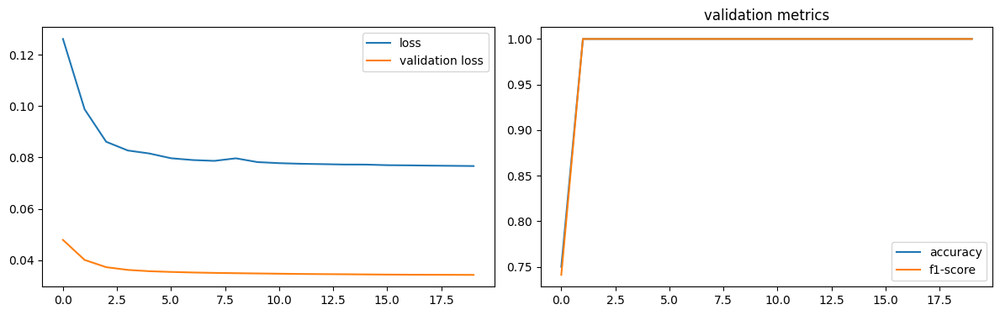

num of dropped: 6
Test: loss: 0.5763412714004517, avg metrics: (1.0, 1.0)
dropping feature: (54, 'neuron60')


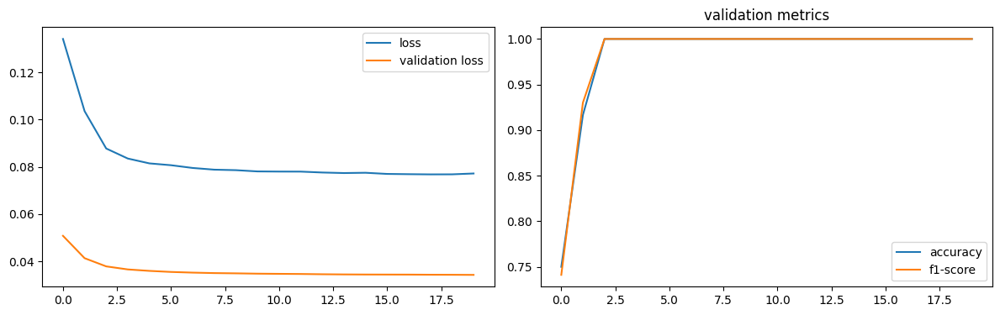

num of dropped: 7
Test: loss: 0.5767412781715393, avg metrics: (1.0, 1.0)
dropping feature: (20, 'neuron23')


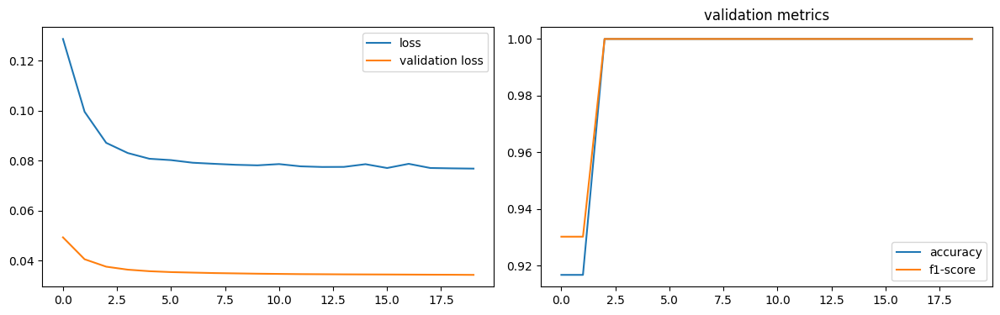

num of dropped: 8
Test: loss: 0.5762060880661011, avg metrics: (1.0, 1.0)
dropping feature: (54, 'neuron62')


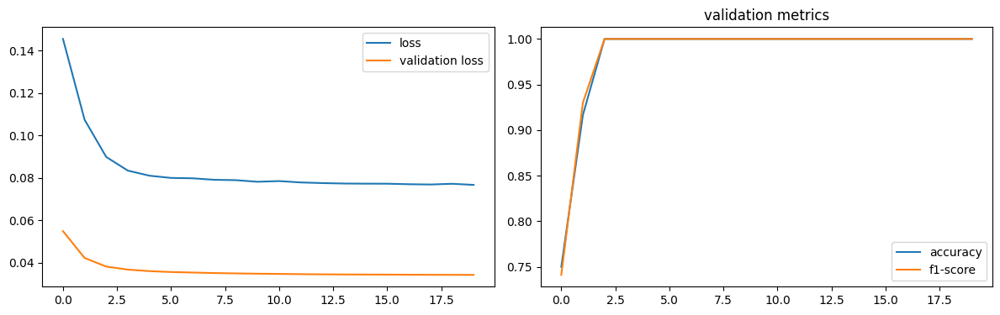

num of dropped: 9
Test: loss: 0.5765782594680786, avg metrics: (1.0, 1.0)
dropping feature: (7, 'neuron8')


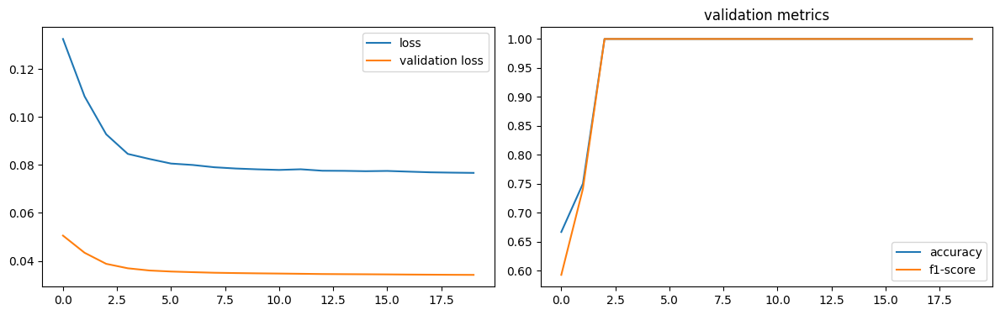

num of dropped: 10
Test: loss: 0.5770308375358582, avg metrics: (1.0, 1.0)
dropping feature: (11, 'neuron13')


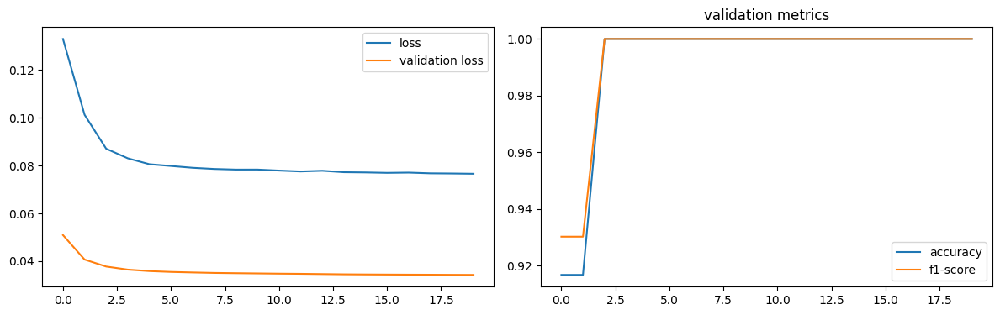

num of dropped: 11
Test: loss: 0.5768115520477295, avg metrics: (1.0, 1.0)
dropping feature: (45, 'neuron52')


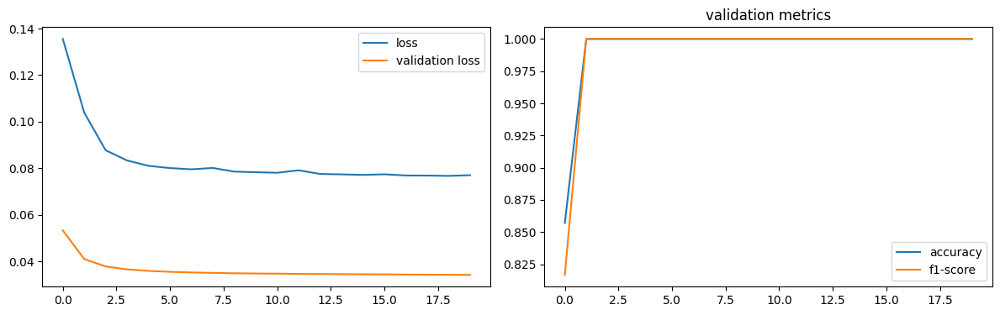

num of dropped: 12
Test: loss: 0.5763453841209412, avg metrics: (1.0, 1.0)
dropping feature: (28, 'neuron35')


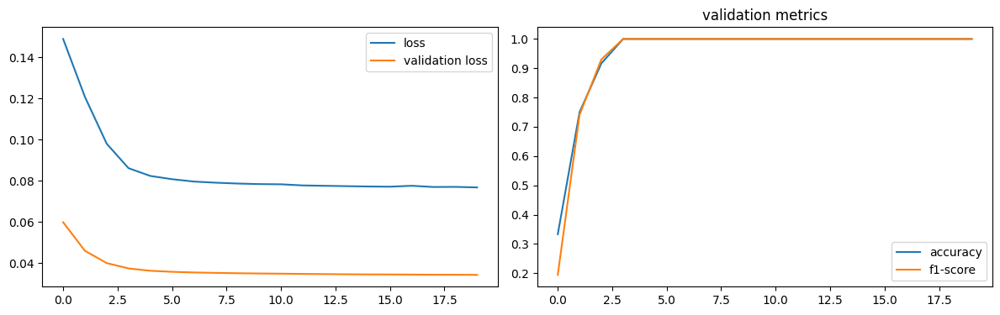

num of dropped: 13
Test: loss: 0.576979398727417, avg metrics: (1.0, 1.0)
dropping feature: (45, 'neuron56')


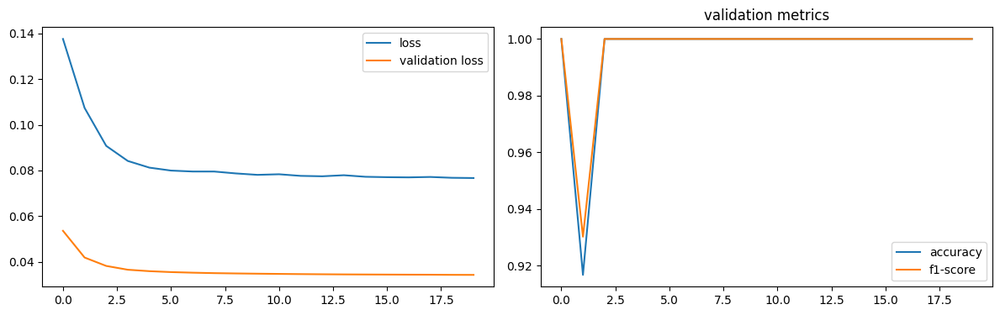

num of dropped: 14
Test: loss: 0.5764245986938477, avg metrics: (1.0, 1.0)
dropping feature: (29, 'neuron37')


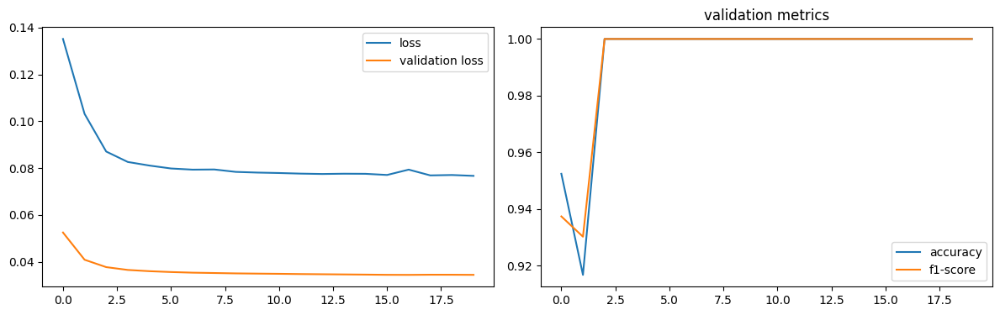

num of dropped: 15
Test: loss: 0.5763631463050842, avg metrics: (1.0, 1.0)
dropping feature: (18, 'neuron24')


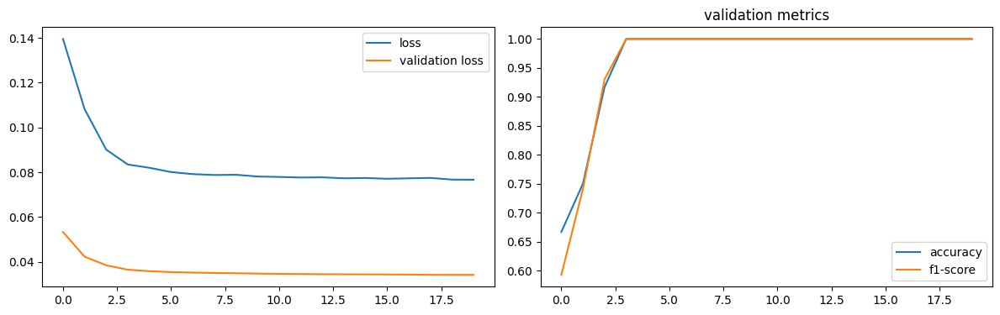

num of dropped: 16
Test: loss: 0.5763429403305054, avg metrics: (1.0, 1.0)
dropping feature: (15, 'neuron20')


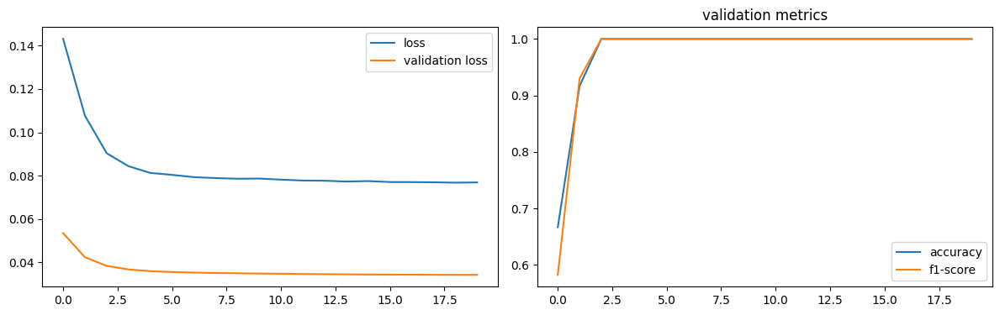

num of dropped: 17
Test: loss: 0.576462984085083, avg metrics: (1.0, 1.0)
dropping feature: (20, 'neuron28')


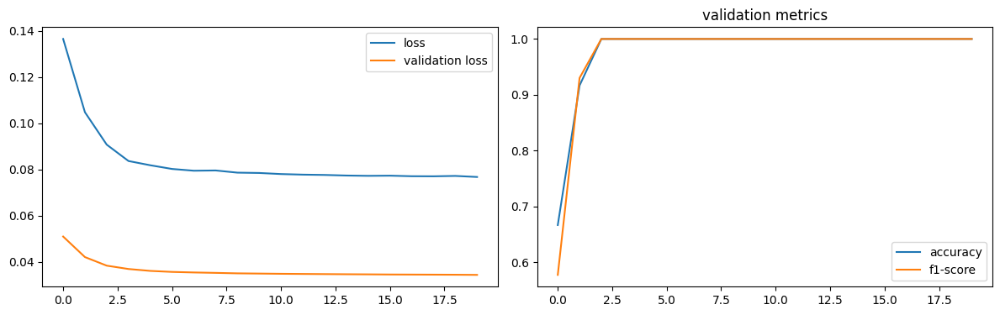

num of dropped: 18
Test: loss: 0.5762057900428772, avg metrics: (1.0, 1.0)
dropping feature: (2, 'neuron2')


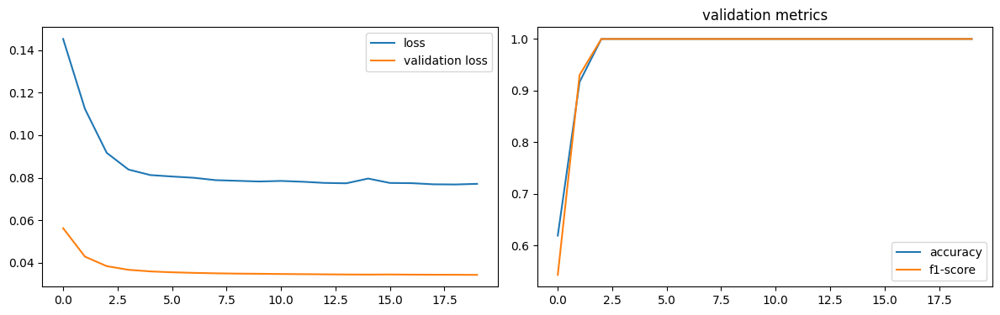

num of dropped: 19
Test: loss: 0.5762186646461487, avg metrics: (1.0, 1.0)
dropping feature: (4, 'neuron6')


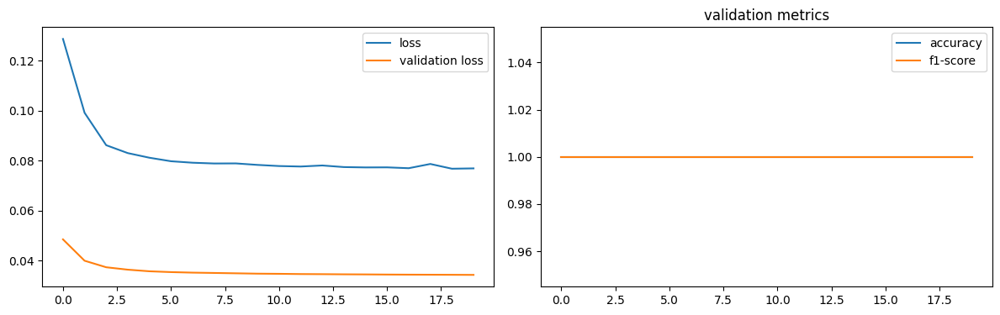

num of dropped: 20
Test: loss: 0.5767958760261536, avg metrics: (1.0, 1.0)
dropping feature: (37, 'neuron51')


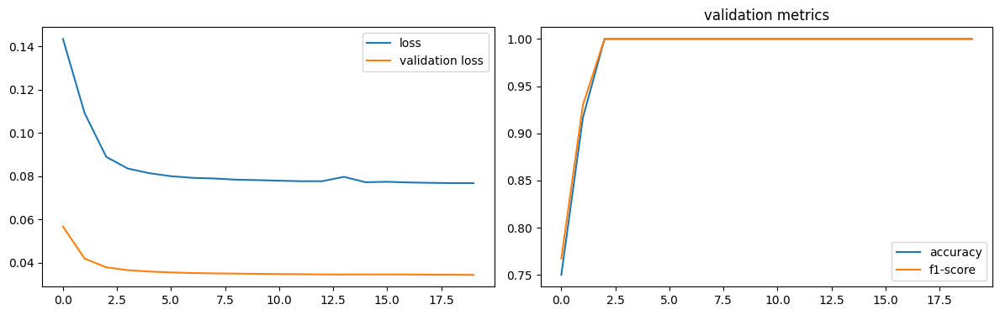

num of dropped: 21
Test: loss: 0.5766152739524841, avg metrics: (1.0, 1.0)
dropping feature: (17, 'neuron27')


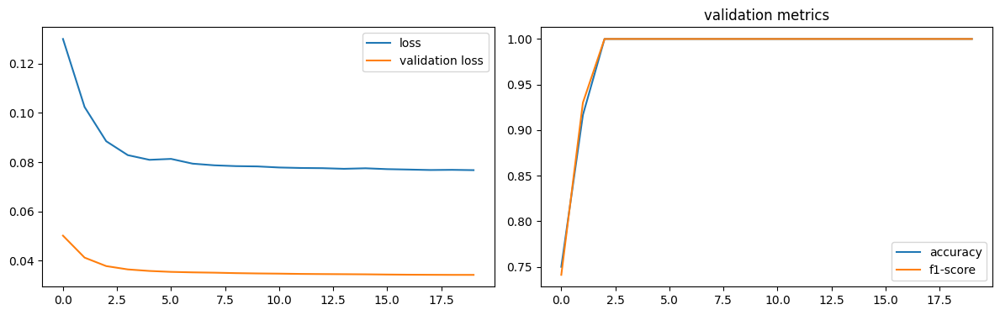

num of dropped: 22
Test: loss: 0.5766944885253906, avg metrics: (1.0, 1.0)
dropping feature: (18, 'neuron30')


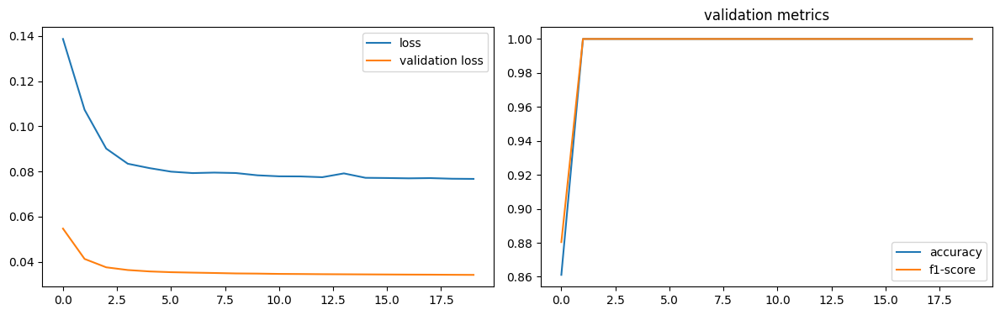

num of dropped: 23
Test: loss: 0.5769749879837036, avg metrics: (1.0, 1.0)
dropping feature: (27, 'neuron43')


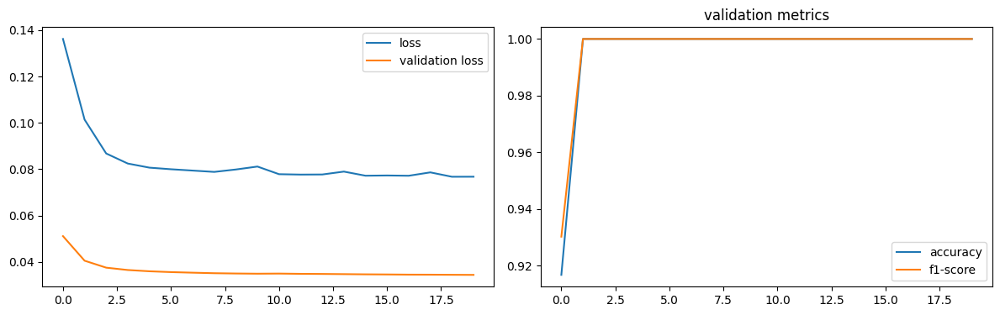

num of dropped: 24
Test: loss: 0.57671719789505, avg metrics: (1.0, 1.0)
dropping feature: (18, 'neuron31')


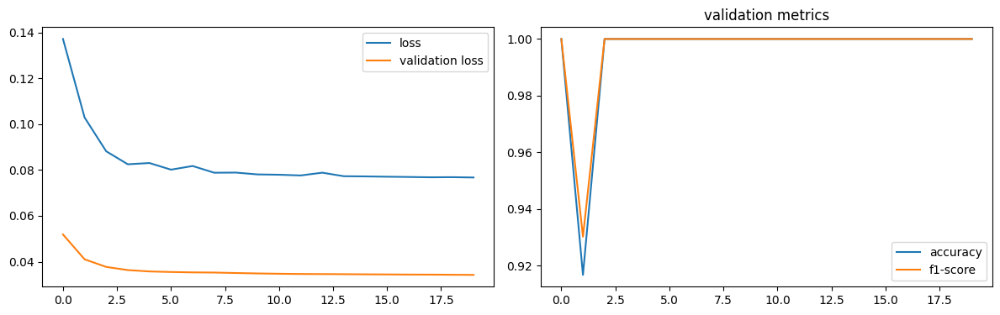

num of dropped: 25
Test: loss: 0.5766143202781677, avg metrics: (1.0, 1.0)
dropping feature: (32, 'neuron50')


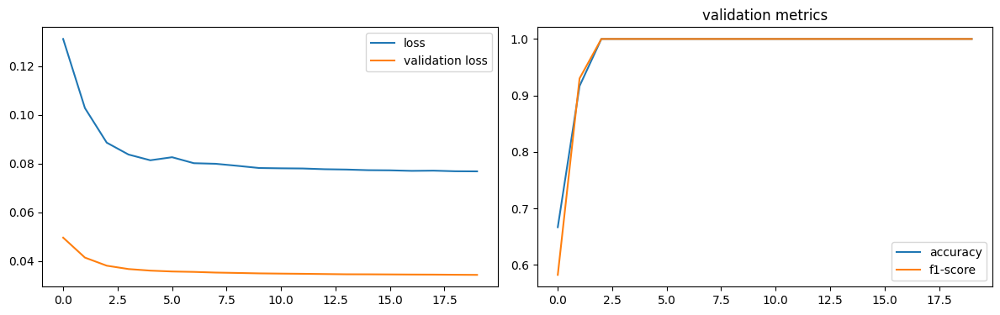

num of dropped: 26
Test: loss: 0.5763598680496216, avg metrics: (1.0, 1.0)
dropping feature: (24, 'neuron41')


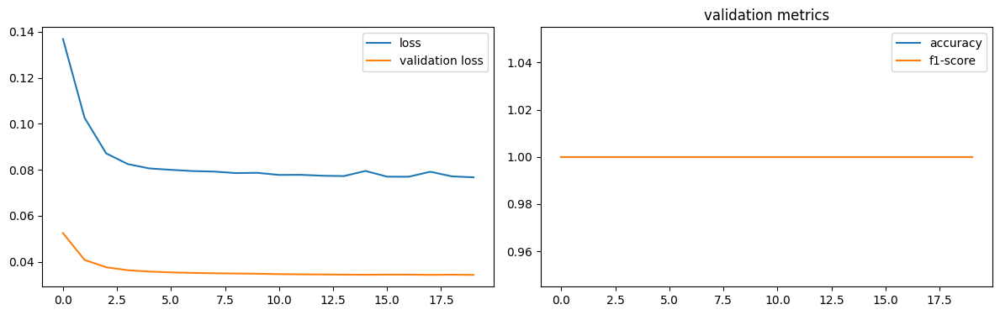

num of dropped: 27
Test: loss: 0.576866865158081, avg metrics: (1.0, 1.0)
dropping feature: (11, 'neuron18')


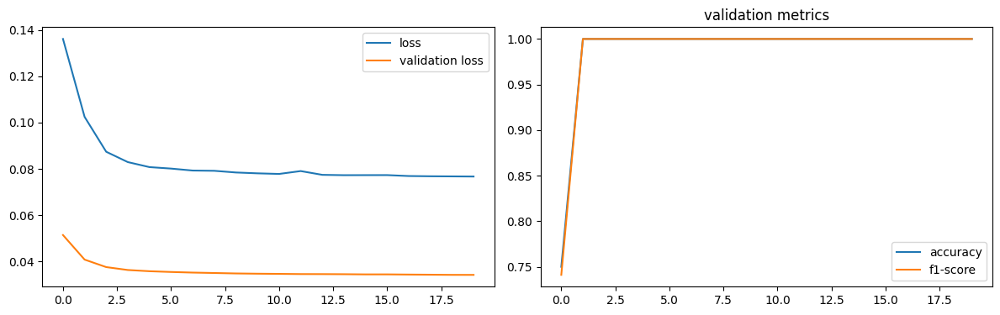

num of dropped: 28
Test: loss: 0.576819896697998, avg metrics: (1.0, 1.0)
dropping feature: (19, 'neuron36')


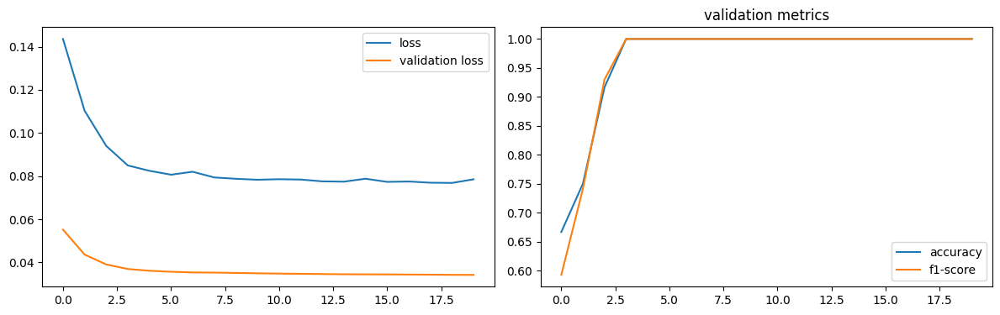

num of dropped: 29
Test: loss: 0.5766831636428833, avg metrics: (1.0, 1.0)
dropping feature: (28, 'neuron49')


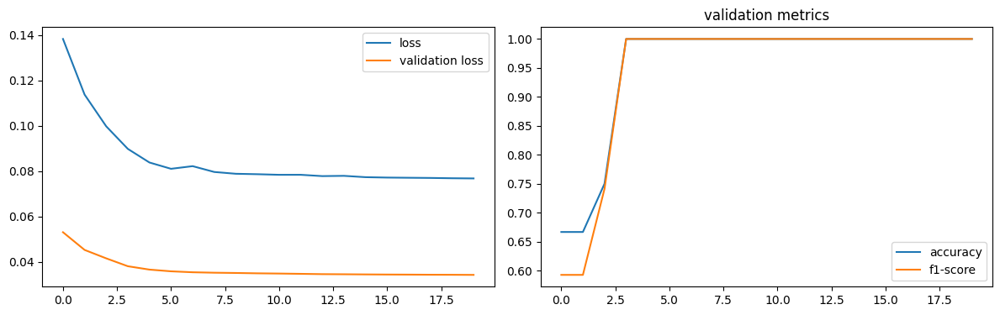

num of dropped: 30
Test: loss: 0.577721357345581, avg metrics: (1.0, 1.0)
dropping feature: (0, 'neuron0')


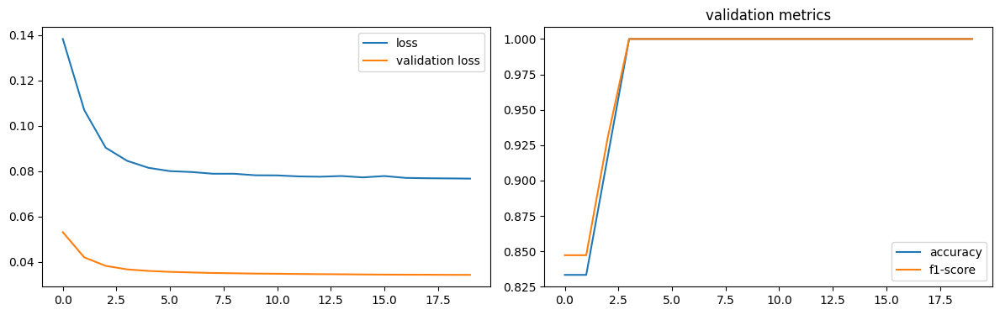

num of dropped: 31
Test: loss: 0.5767977833747864, avg metrics: (1.0, 1.0)
dropping feature: (18, 'neuron38')


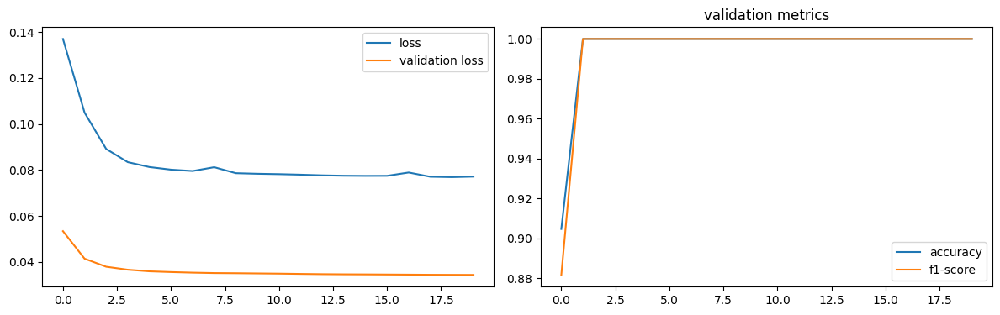

num of dropped: 32
Test: loss: 0.5779736638069153, avg metrics: (1.0, 1.0)
dropping feature: (7, 'neuron12')


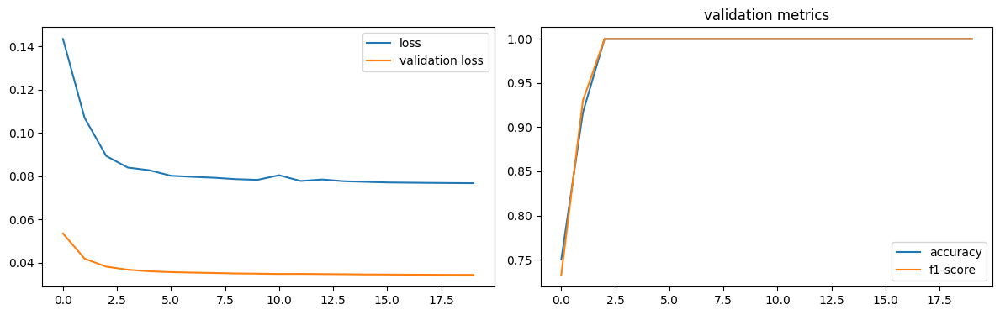

num of dropped: 33
Test: loss: 0.5774077773094177, avg metrics: (1.0, 1.0)
dropping feature: (0, 'neuron1')


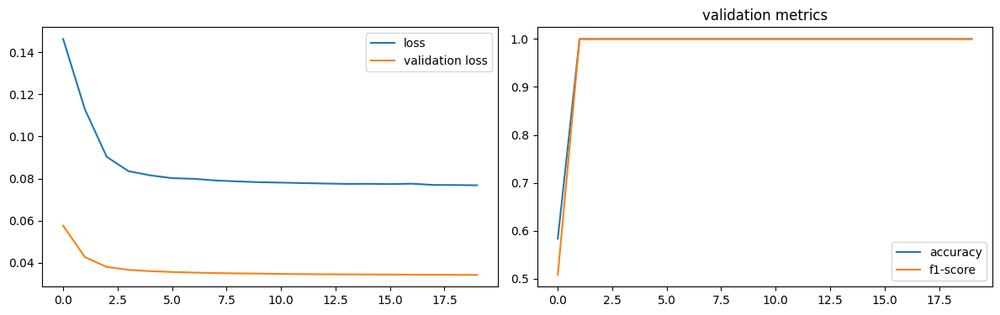

num of dropped: 34
Test: loss: 0.5765550136566162, avg metrics: (1.0, 1.0)
dropping feature: (25, 'neuron57')


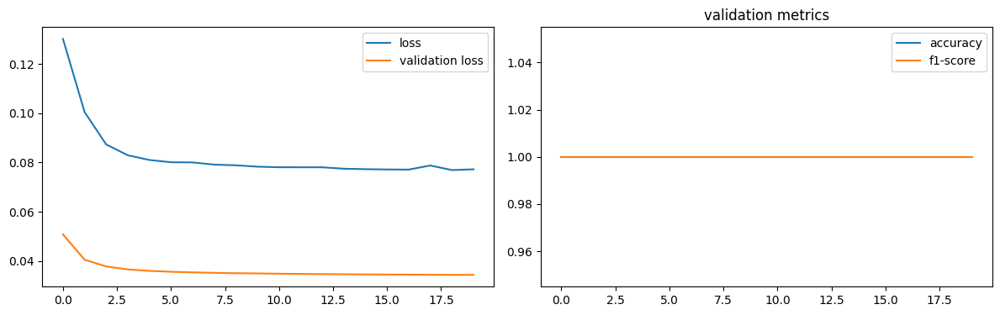

num of dropped: 35
Test: loss: 0.5776793956756592, avg metrics: (1.0, 1.0)
dropping feature: (13, 'neuron29')


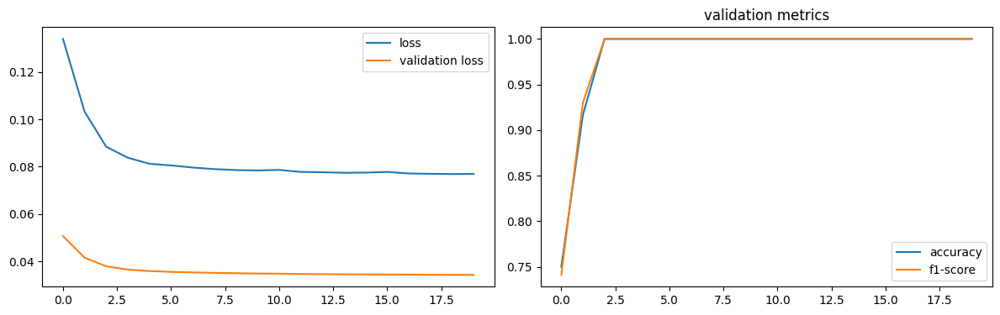

num of dropped: 36
Test: loss: 0.5768293142318726, avg metrics: (1.0, 1.0)
dropping feature: (11, 'neuron25')


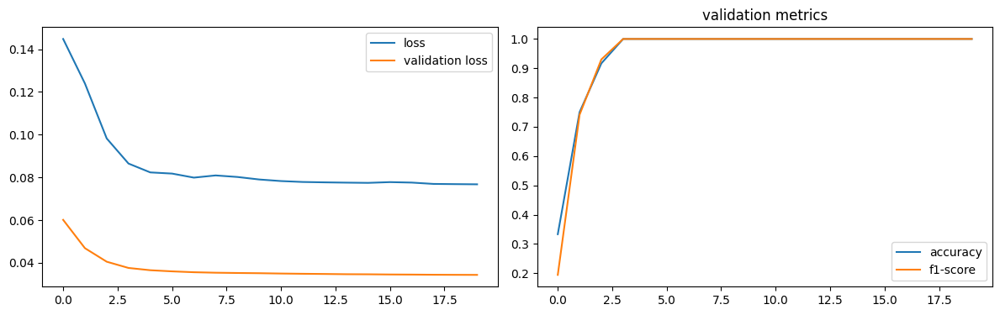

num of dropped: 37
Test: loss: 0.5776236057281494, avg metrics: (1.0, 1.0)
dropping feature: (23, 'neuron58')


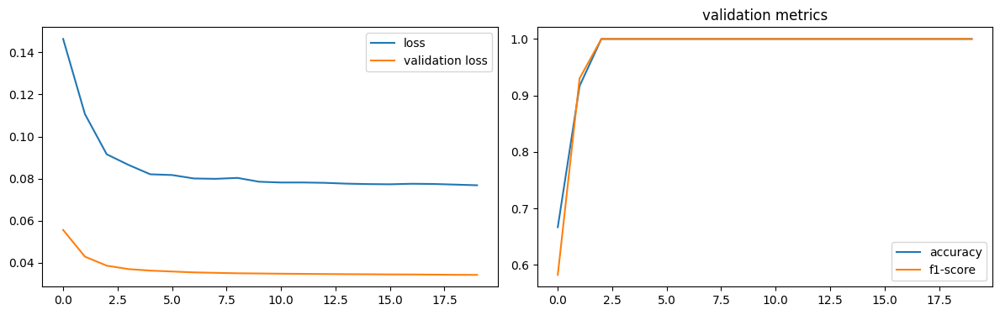

num of dropped: 38
Test: loss: 0.5780592560768127, avg metrics: (1.0, 1.0)
dropping feature: (23, 'neuron59')


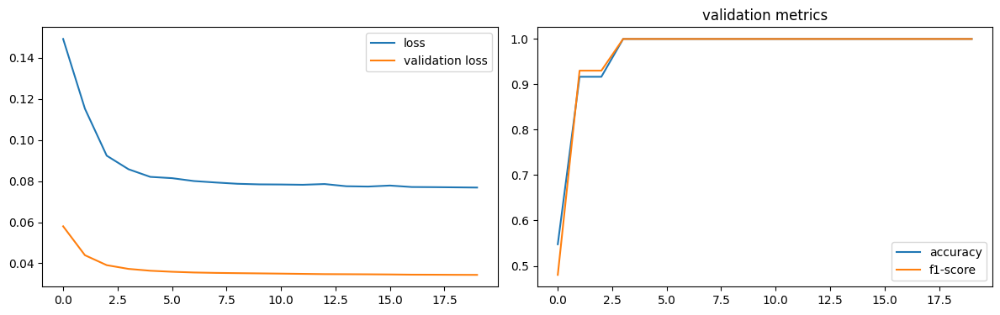

num of dropped: 39
Test: loss: 0.577438235282898, avg metrics: (1.0, 1.0)
dropping feature: (18, 'neuron45')


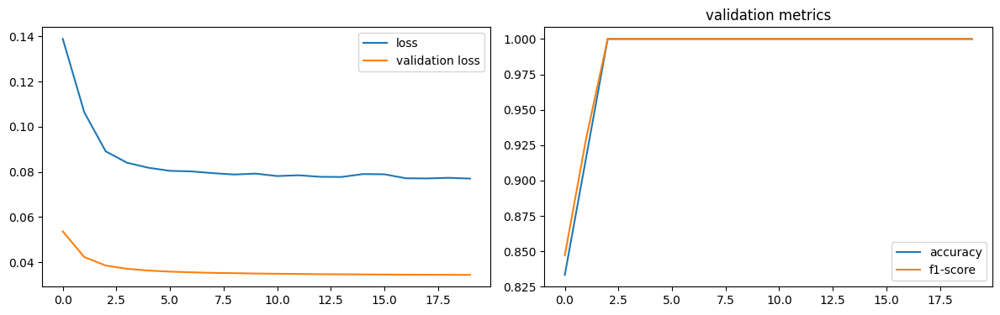

num of dropped: 40
Test: loss: 0.5776187777519226, avg metrics: (1.0, 1.0)
dropping feature: (4, 'neuron10')


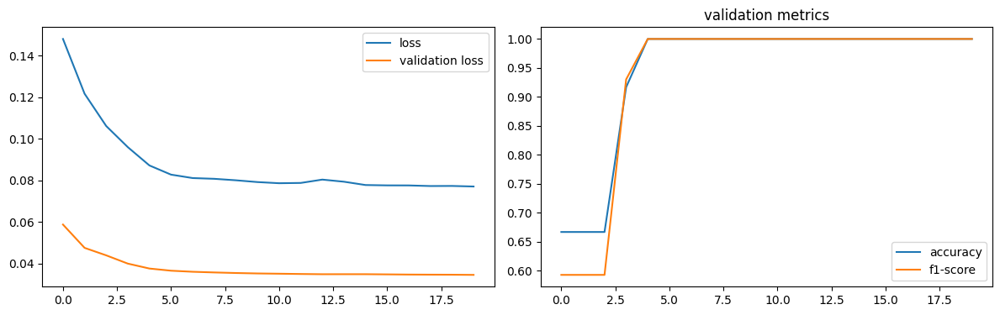

num of dropped: 41
Test: loss: 0.5779892206192017, avg metrics: (1.0, 1.0)
dropping feature: (0, 'neuron4')


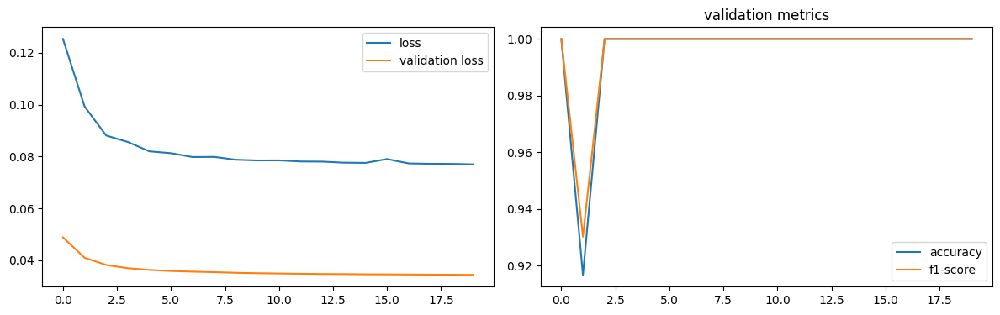

num of dropped: 42
Test: loss: 0.57794189453125, avg metrics: (1.0, 1.0)
dropping feature: (20, 'neuron61')


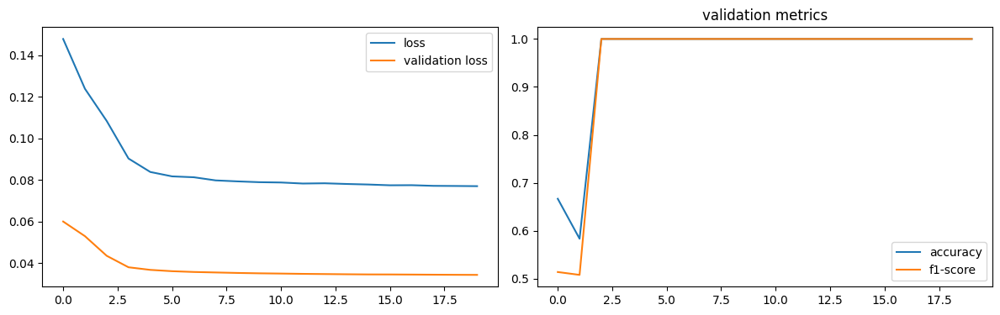

num of dropped: 43
Test: loss: 0.578214704990387, avg metrics: (1.0, 1.0)
dropping feature: (2, 'neuron9')


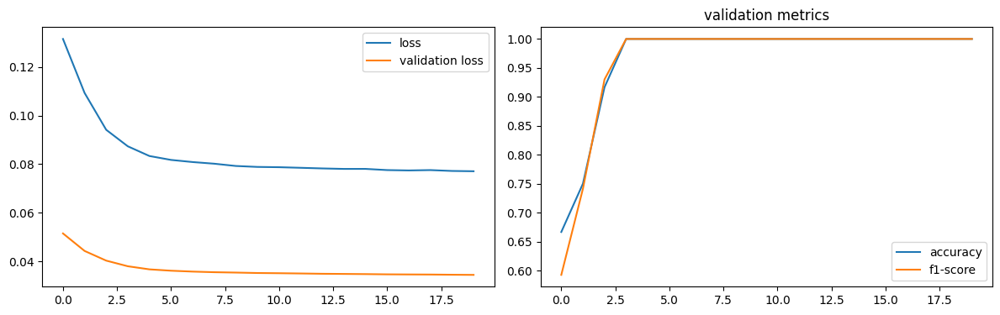

num of dropped: 44
Test: loss: 0.5787621736526489, avg metrics: (1.0, 1.0)
dropping feature: (14, 'neuron44')


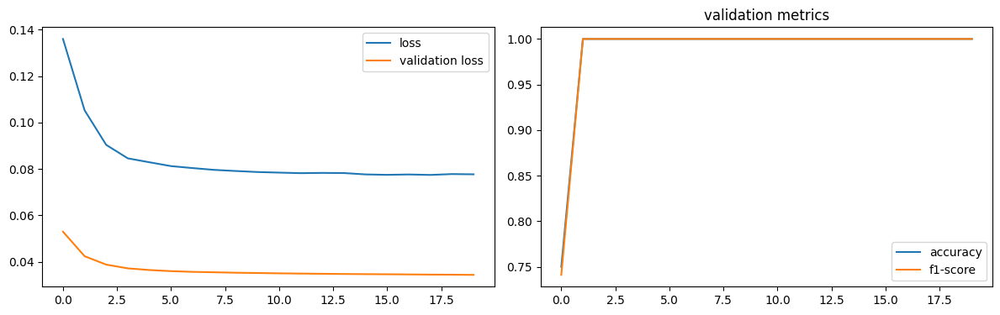

num of dropped: 45
Test: loss: 0.5789071917533875, avg metrics: (1.0, 1.0)
dropping feature: (3, 'neuron14')


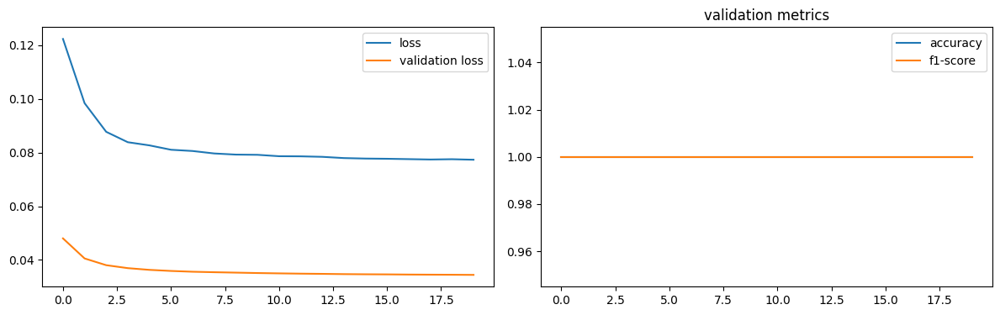

num of dropped: 46
Test: loss: 0.5797052383422852, avg metrics: (1.0, 1.0)
dropping feature: (4, 'neuron19')


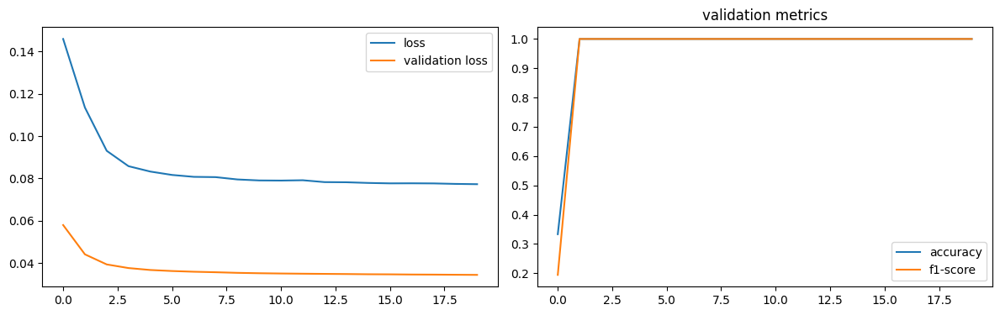

num of dropped: 47
Test: loss: 0.5814402103424072, avg metrics: (0.9955555558204651, 0.9963405966758728)
dropping feature: (0, 'neuron5')


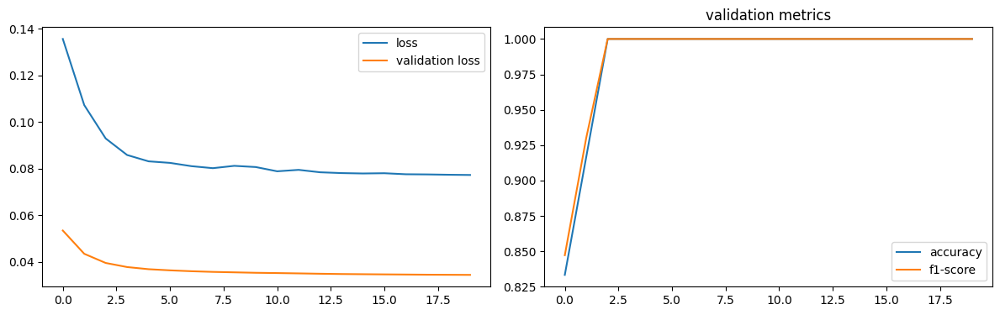

num of dropped: 48
Test: loss: 0.5810253620147705, avg metrics: (1.0, 1.0)
dropping feature: (15, 'neuron63')


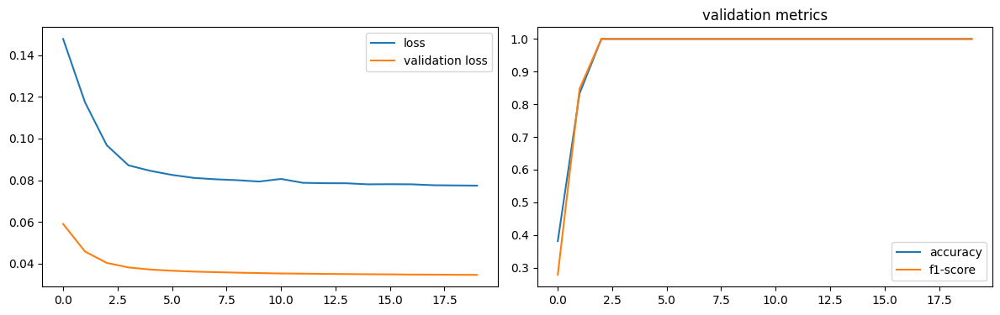

num of dropped: 49
Test: loss: 0.5821483731269836, avg metrics: (1.0, 1.0)
dropping feature: (9, 'neuron40')


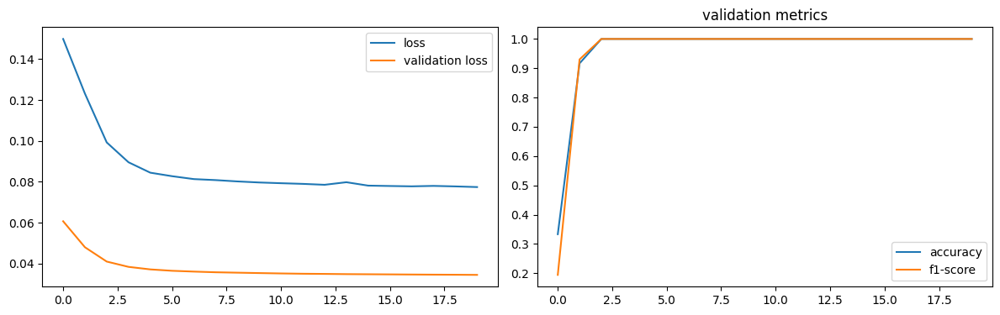

num of dropped: 50
Test: loss: 0.582181990146637, avg metrics: (1.0, 1.0)
dropping feature: (6, 'neuron32')


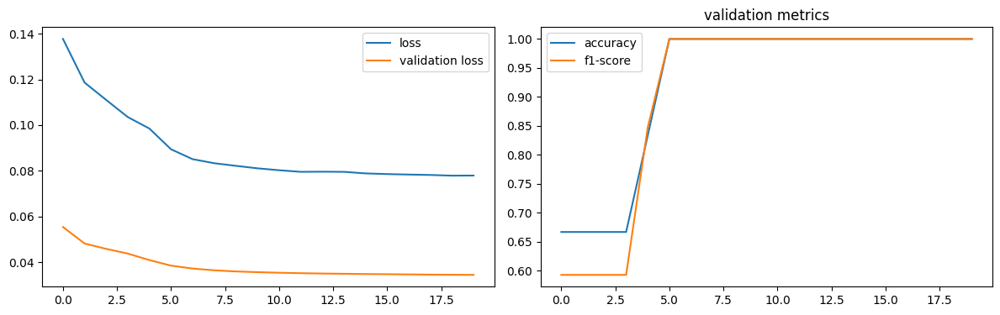

num of dropped: 51
Test: loss: 0.5847548246383667, avg metrics: (1.0, 1.0)
dropping feature: (2, 'neuron16')


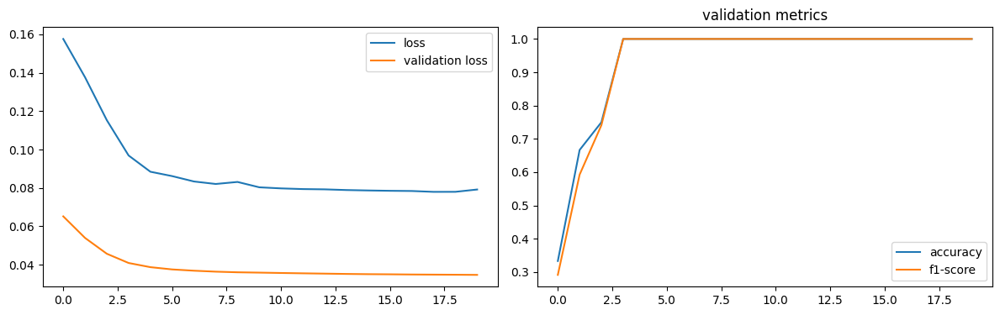

num of dropped: 52
Test: loss: 0.5844978094100952, avg metrics: (1.0, 1.0)
dropping feature: (7, 'neuron42')


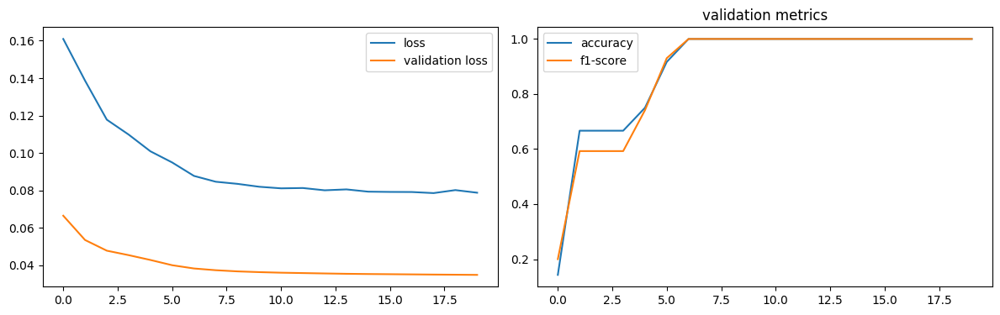

num of dropped: 53
Test: loss: 0.5891651511192322, avg metrics: (1.0, 1.0)
dropping feature: (10, 'neuron55')


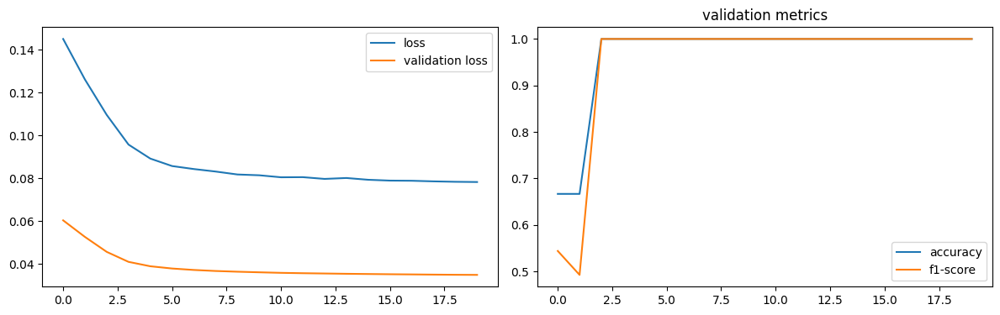

num of dropped: 54
Test: loss: 0.5915922522544861, avg metrics: (0.9866666674613953, 0.9890217900276184)
dropping feature: (1, 'neuron11')


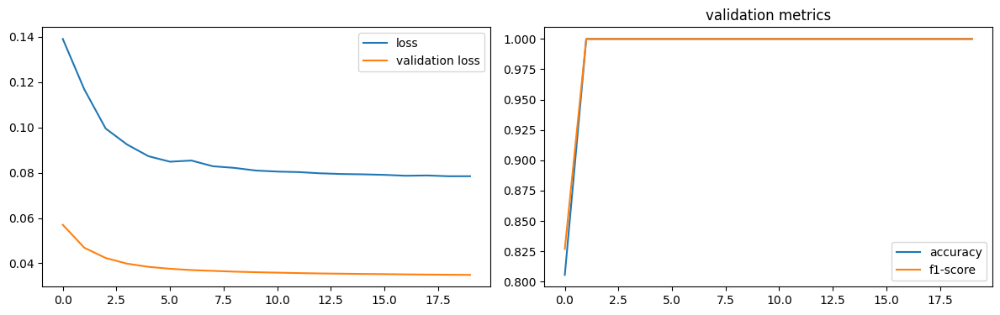

num of dropped: 55
Test: loss: 0.5902332067489624, avg metrics: (0.9911111116409301, 0.9926811933517456)
dropping feature: (6, 'neuron46')


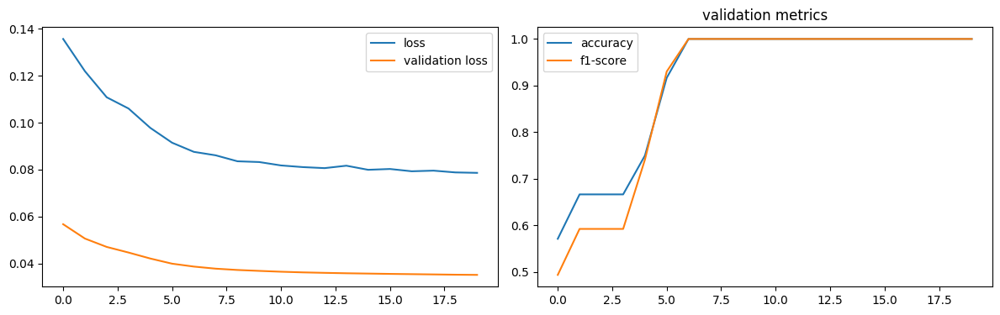

num of dropped: 56
Test: loss: 0.5920841097831726, avg metrics: (0.9955555558204651, 0.9963405966758728)
dropping feature: (7, 'neuron48')


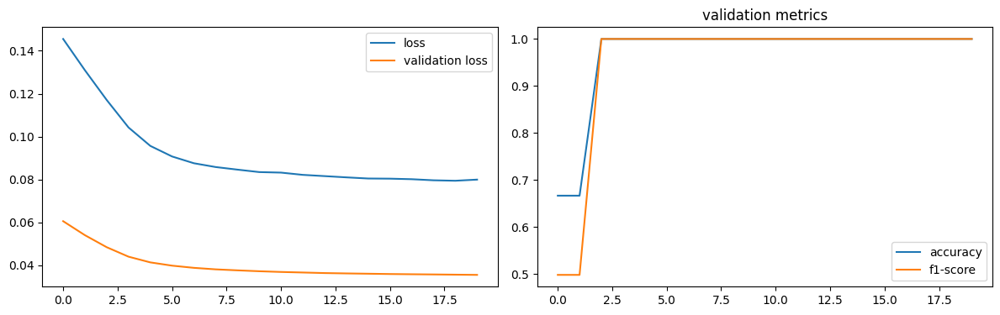

num of dropped: 57
Test: loss: 0.5995564460754395, avg metrics: (0.9955555558204651, 0.9963405966758728)
dropping feature: (3, 'neuron26')


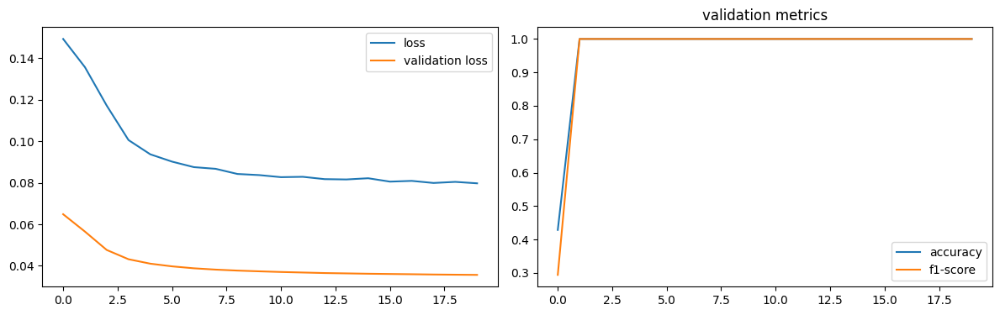

num of dropped: 58
Test: loss: 0.6002625823020935, avg metrics: (0.9955555558204651, 0.9963405966758728)
dropping feature: (1, 'neuron21')


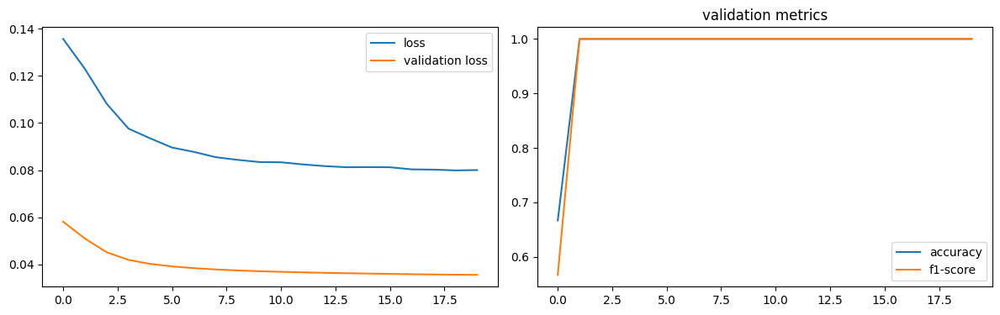

num of dropped: 59
Test: loss: 0.6025336384773254, avg metrics: (0.9866666674613953, 0.9890217900276184)
dropping feature: (3, 'neuron39')


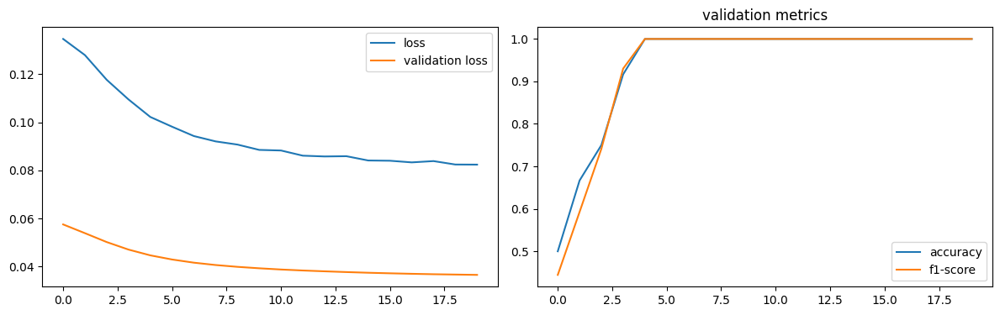

num of dropped: 60
Test: loss: 0.6125906705856323, avg metrics: (1.0, 1.0)
dropping feature: (0, 'neuron7')


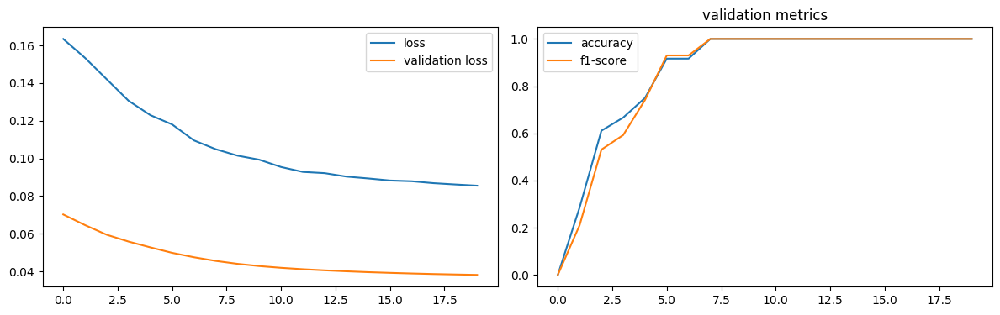

num of dropped: 61
Test: loss: 0.6404803991317749, avg metrics: (1.0, 1.0)
dropping feature: (0, 'neuron22')


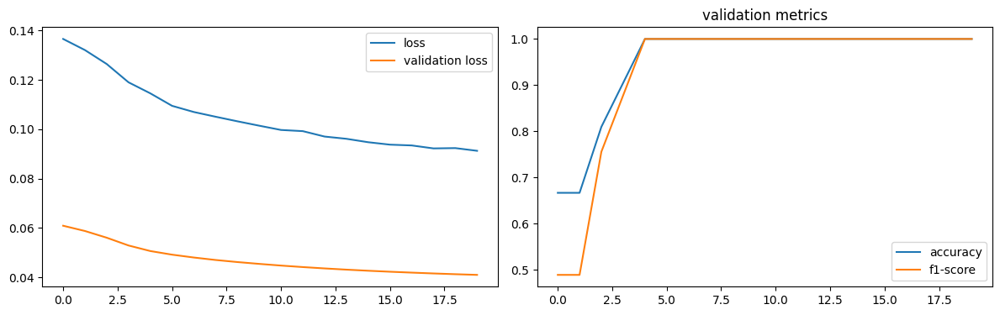

num of dropped: 62
Test: loss: 0.6748877763748169, avg metrics: (0.9972222208976745, 0.9965613722801209)
dropping feature: (1, 'neuron47')


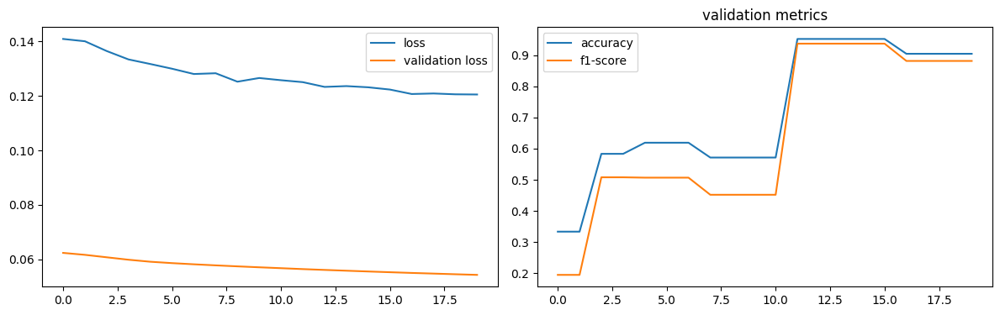

num of dropped: 63
Test: loss: 0.8955946564674377, avg metrics: (0.7072222352027893, 0.5960570216178894)


In [19]:
torch.manual_seed(2024)

headers = [f"neuron{i}" for i in range(64)]


def model_factory(size):
    model = WineNN(1, (1, size))
    model.layer1 = nn.Identity()
    model.layer2 = nn.Identity()
    return model


test_metrics, dropped, models = prune(
    datasets, headers, analyze_dgsm,
    model_factory, optimizer_factory, criterion, score_outputs, 20,
    labels, "", None
)

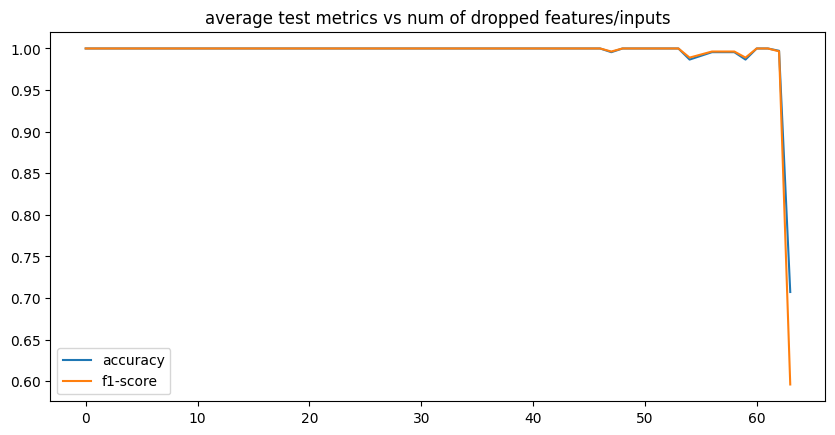

In [20]:
plot_dropping_metrics(test_metrics, labels)

In [21]:
num_drop_neurons = 60

save_models("wine", "dgsm-layer3", models, dropped)

reduced_datasets, reduced_headers = reduce_datasets(datasets, headers, dropped, num_drop_neurons)
layer = models[num_drop_neurons].out

best_model.out = layer
best_model.layer2[0] = reduce_linear(best_model.layer2[0], dropped, num_drop_neurons)

features left [4]:  ['neuron7', 'neuron22', 'neuron33', 'neuron47']


### pruned

In [22]:
best_model

WineNN(
  (layer1): Sequential(
    (0): Linear(in_features=7, out_features=8, bias=True)
    (1): ReLU()
  )
  (layer2): Sequential(
    (0): Linear(in_features=8, out_features=4, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.1, inplace=False)
  )
  (out): Sequential(
    (0): Linear(in_features=4, out_features=3, bias=True)
    (1): Softmax(dim=-1)
  )
)

In [23]:
with torch.no_grad():
    inputs, targets = dgsm_datasets["test"][:]
    outputs = best_model(inputs)

    test_metrics = score_outputs(outputs, targets)

print(f"test {labels}: {test_metrics}")

test ('accuracy', 'f1-score'): (1.0, 1.0)


test: ('accuracy', 'f1-score'): (1.0, 1.0)


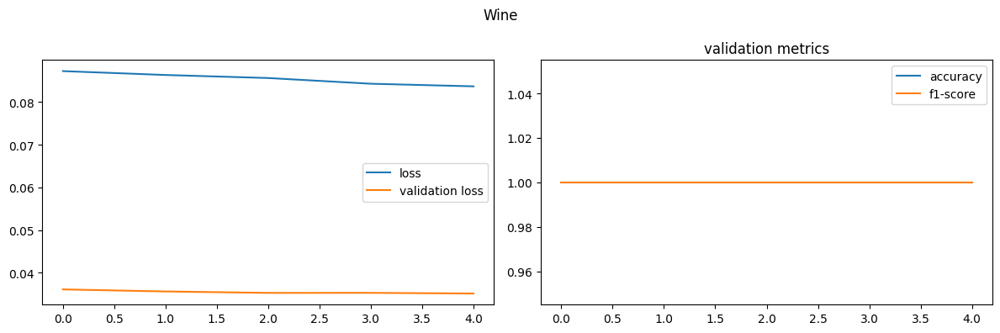

In [24]:
optimizer = optimizer_factory(best_model)
metrics = model_train(dgsm_datasets, best_model, optimizer, criterion, score_outputs, 5)

with torch.no_grad():
    inputs, targets = dgsm_datasets["test"][:]
    outputs = best_model(inputs)

    test_metrics = score_outputs(outputs, targets)

print(f"test: {labels}: {test_metrics}")
plot_metrics('Wine', metrics, labels)

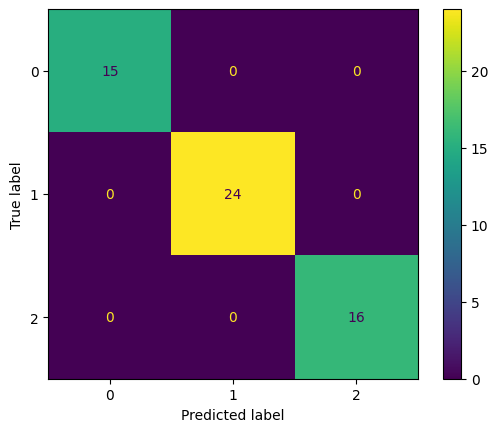

In [25]:
ConfusionMatrixDisplay.from_predictions(targets, outputs.argmax(dim=1))
plt.show()

In [26]:
save_models("wine", "dgsm-prunned", [best_model], None)

## FAST

In [27]:
best_model = WineNN()

### input layer

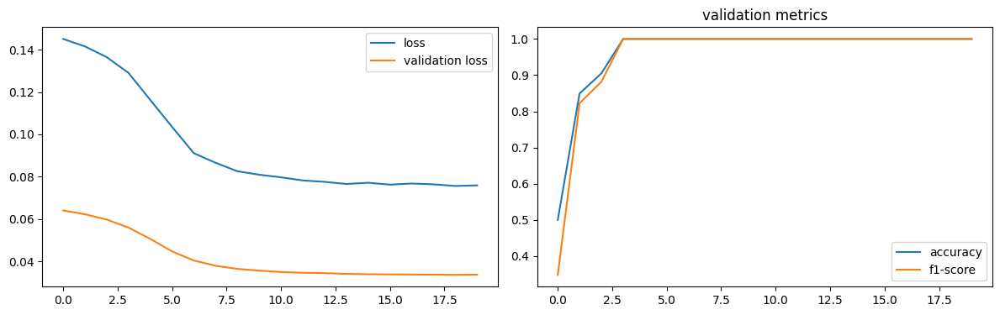

num of dropped: 0
Test: loss: 0.5749284029006958, avg metrics: (0.9777778148651123, 0.9717391490936279)
dropping feature: (7, 'Nonflavanoid_phenols')


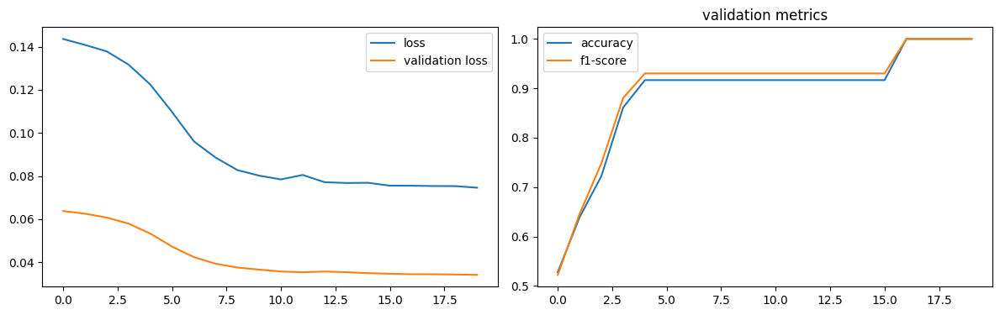

num of dropped: 1
Test: loss: 0.6018698215484619, avg metrics: (0.9777778148651123, 0.9717391490936279)
dropping feature: (1, 'Malicacid')


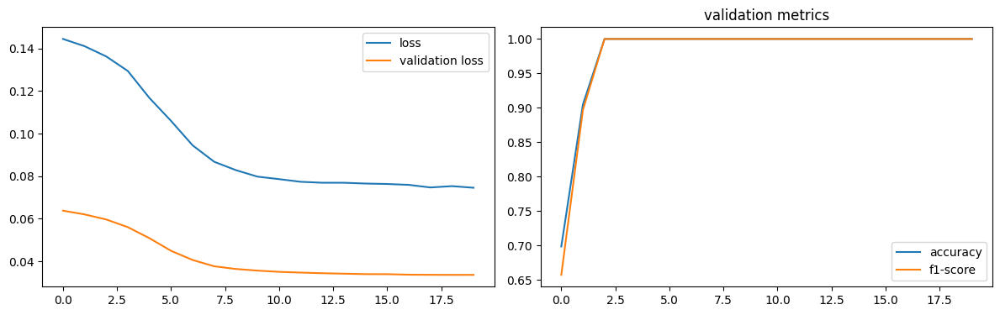

num of dropped: 2
Test: loss: 0.5988855361938477, avg metrics: (0.9750000357627868, 0.968170166015625)
dropping feature: (3, 'Magnesium')


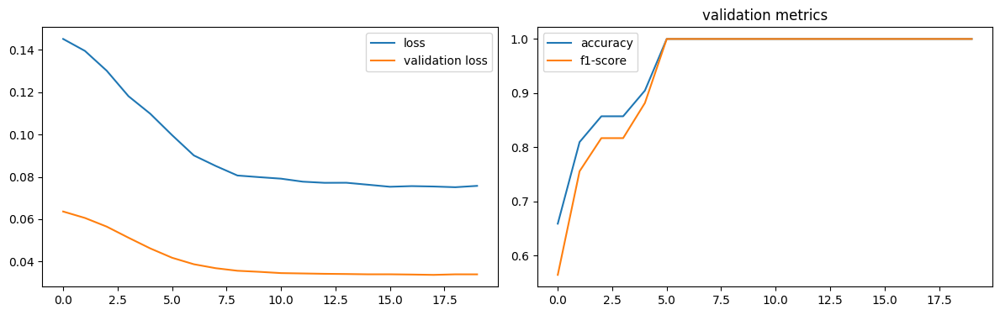

num of dropped: 3
Test: loss: 0.5704618096351624, avg metrics: (0.9927777767181396, 0.9927716135978699)
dropping feature: (3, 'Total_phenols')


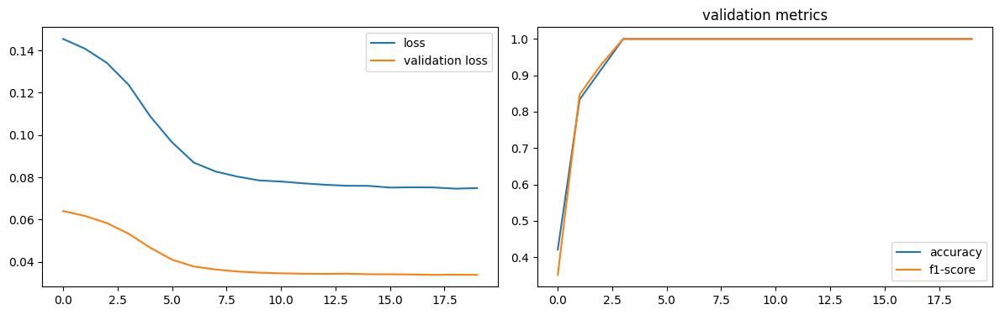

num of dropped: 4
Test: loss: 0.563799262046814, avg metrics: (1.0, 1.0)
dropping feature: (4, 'Proanthocyanins')


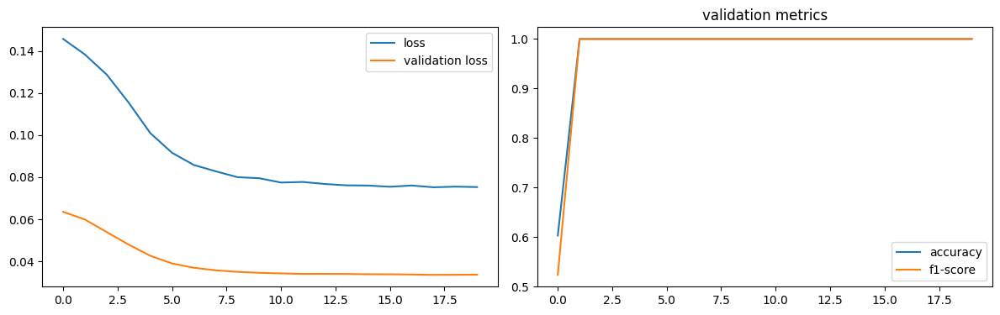

num of dropped: 5
Test: loss: 0.5669633746147156, avg metrics: (1.0, 1.0)
dropping feature: (2, 'Alcalinity_of_ash')


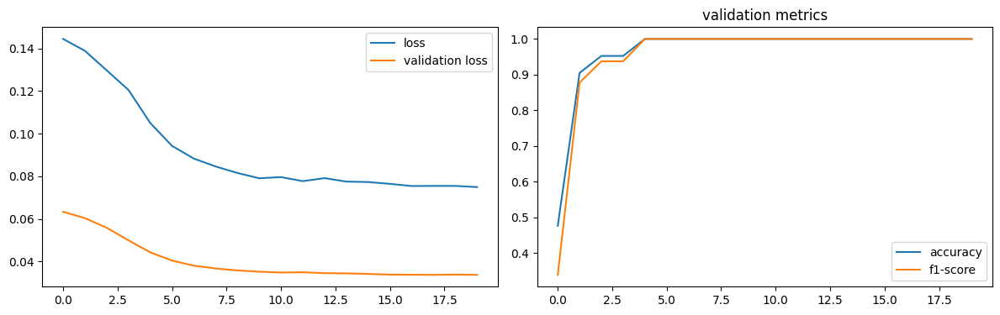

num of dropped: 6
Test: loss: 0.5864406228065491, avg metrics: (0.9772222161293029, 0.9748486042022705)
dropping feature: (2, 'Flavanoids')


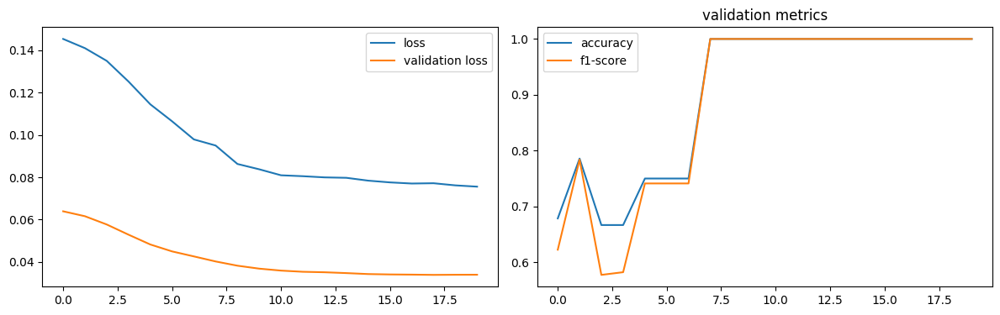

num of dropped: 7
Test: loss: 0.5835782885551453, avg metrics: (0.9861111044883728, 0.9821550846099854)
dropping feature: (1, 'Ash')


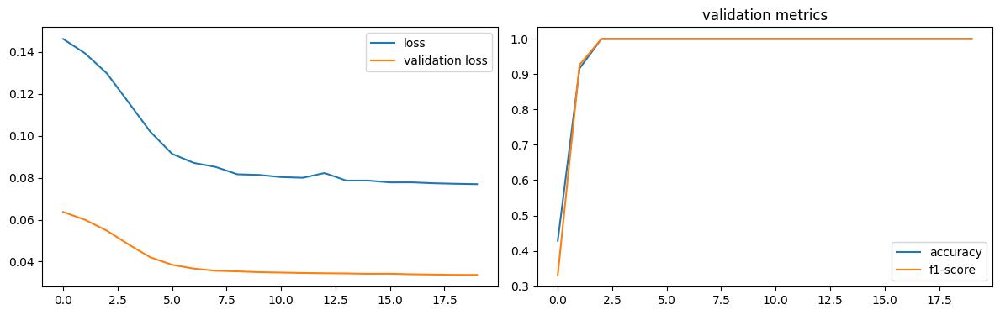

num of dropped: 8
Test: loss: 0.5977451205253601, avg metrics: (0.9722222685813904, 0.9646535515785217)
dropping feature: (1, 'Color_intensity')


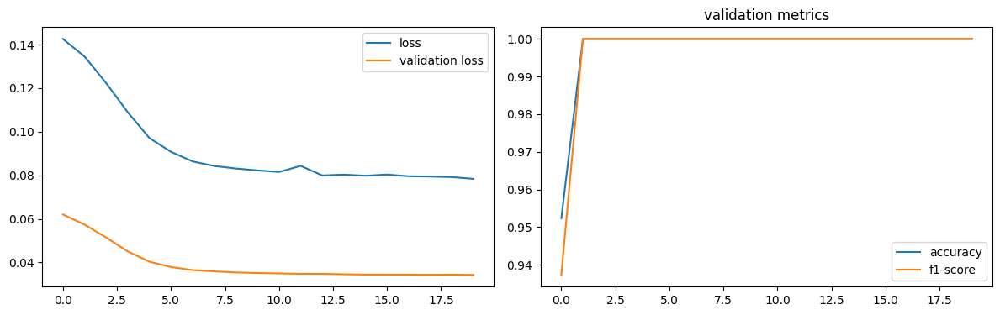

num of dropped: 9
Test: loss: 0.598918080329895, avg metrics: (0.9791666626930237, 0.9751489877700805)
dropping feature: (0, 'Alcohol')


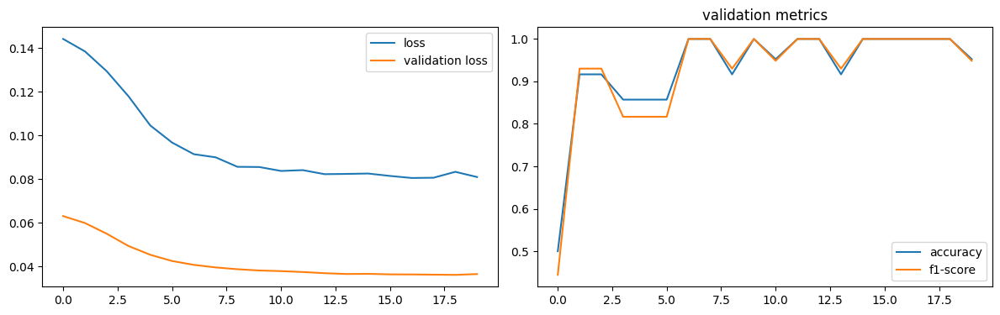

num of dropped: 10
Test: loss: 0.6636883020401001, avg metrics: (0.925, 0.9148714303970337)
dropping feature: (1, '0D280_0D315_of_diluted_wines')


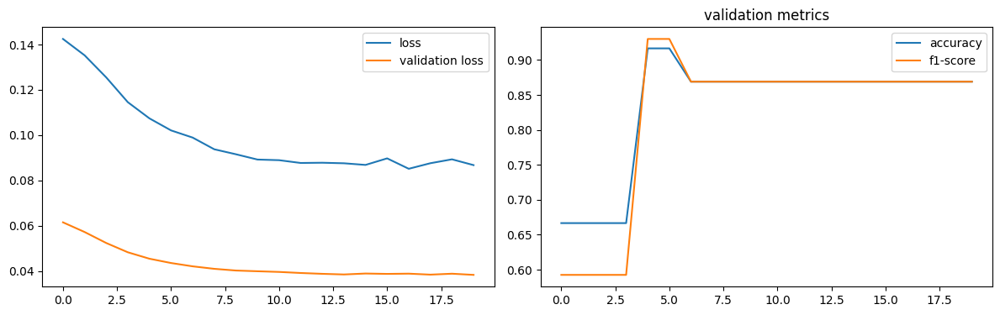

num of dropped: 11
Test: loss: 0.7051417231559753, avg metrics: (0.8602778196334839, 0.8444307565689086)
dropping feature: (0, 'Hue')


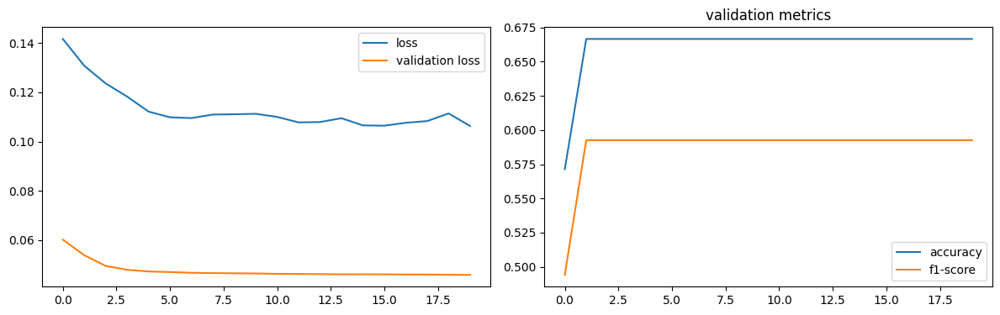

num of dropped: 12
Test: loss: 0.8761847615242004, avg metrics: (0.6372222423553466, 0.5870784401893616)


In [28]:
torch.manual_seed(2024)

datasets = wine_datasets.copy()
headers = wine_headers.copy()


def model_factory(size):
    return WineNN(size)


test_metrics, dropped, models = prune(
    datasets, headers, analyze_fast,
    model_factory, optimizer_factory, criterion, score_outputs, 20,
    labels, "", None
)

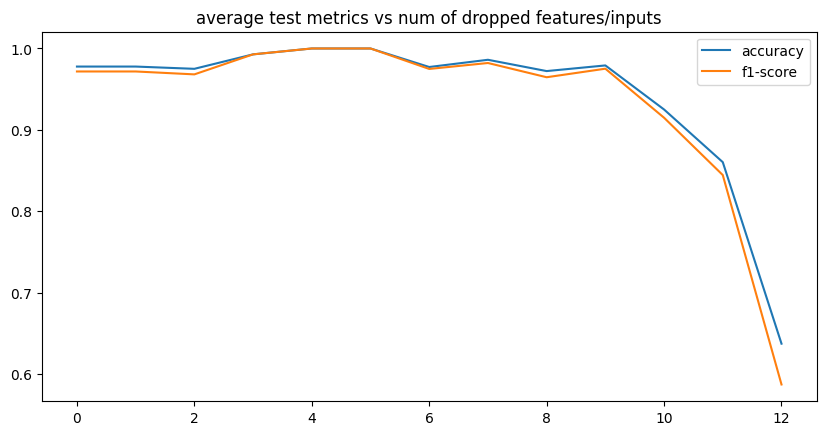

In [29]:
plot_dropping_metrics(test_metrics, labels)

In [30]:
num_drop_features = 5

save_models("wine", "fast-layer1", models, dropped)

reduced_datasets, reduced_headers = reduce_datasets(datasets, headers, dropped, num_drop_features)
layer = models[num_drop_features].layer1

best_model.layer1 = layer

fast_dataset = reduced_datasets

features left [8]:  ['Alcohol', 'Ash', 'Alcalinity_of_ash', 'Flavanoids', 'Color_intensity', 'Hue', '0D280_0D315_of_diluted_wines', 'Proline']


### 1st hidden layer

In [31]:
layer.eval()

datasets = {
    key: TensorDataset(
        layer(dataset.tensors[0]).detach(),
        dataset.tensors[1]
    )
    for key, dataset in reduced_datasets.items()
}

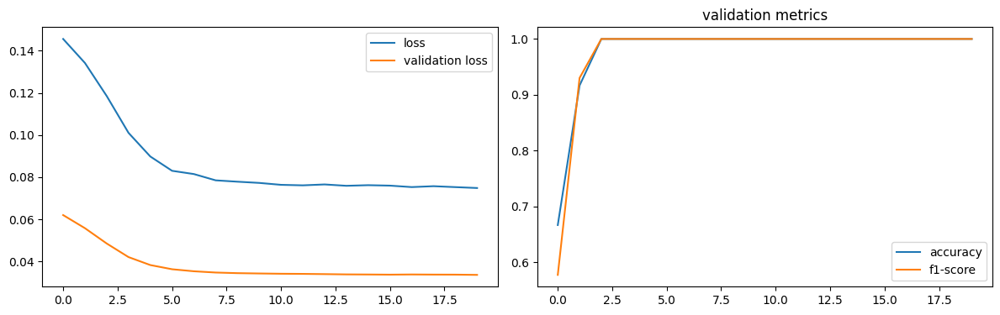

num of dropped: 0
Test: loss: 0.5684398412704468, avg metrics: (0.9955555558204651, 0.9963405966758728)
dropping feature: (3, 'neuron3')


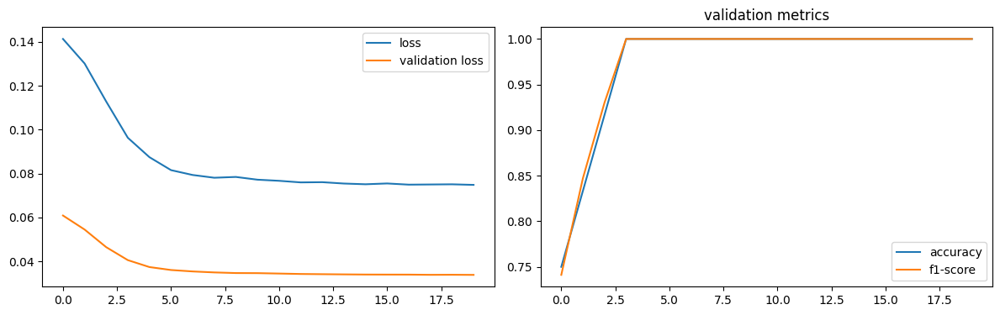

num of dropped: 1
Test: loss: 0.5664297342300415, avg metrics: (0.9822222232818604, 0.9853623867034912)
dropping feature: (6, 'neuron7')


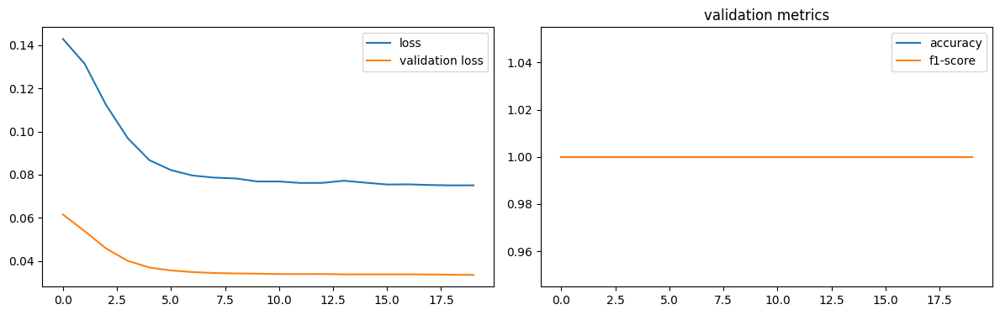

num of dropped: 2
Test: loss: 0.5666844248771667, avg metrics: (0.9911111116409301, 0.9926811933517456)
dropping feature: (19, 'neuron21')


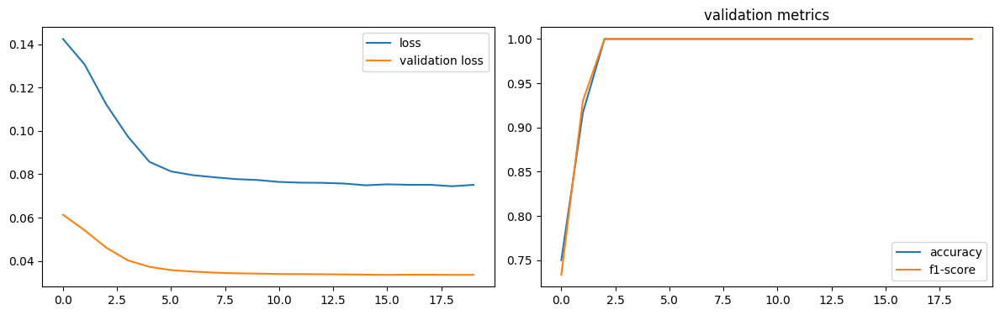

num of dropped: 3
Test: loss: 0.564850926399231, avg metrics: (0.9955555558204651, 0.9963405966758728)
dropping feature: (60, 'neuron63')


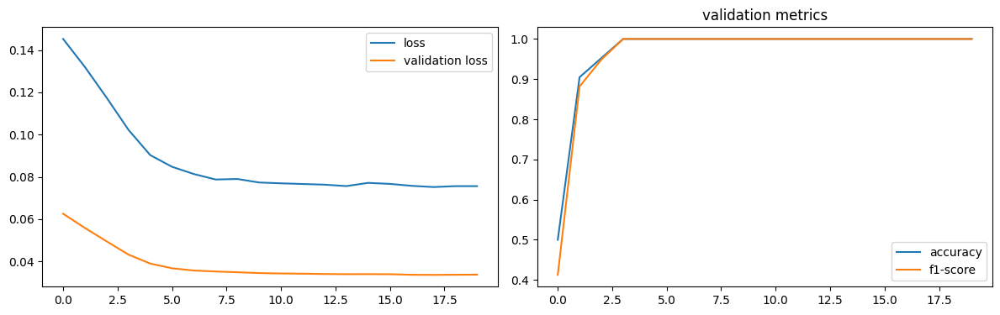

num of dropped: 4
Test: loss: 0.5671171545982361, avg metrics: (0.9955555558204651, 0.9963405966758728)
dropping feature: (57, 'neuron60')


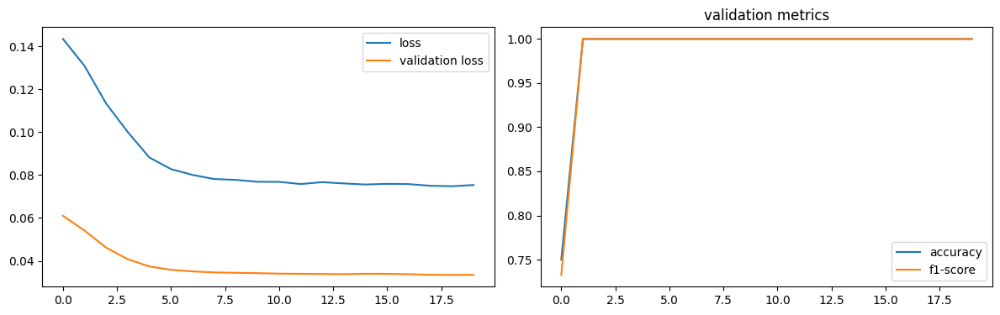

num of dropped: 5
Test: loss: 0.5668378472328186, avg metrics: (0.9911111116409301, 0.9926811933517456)
dropping feature: (53, 'neuron56')


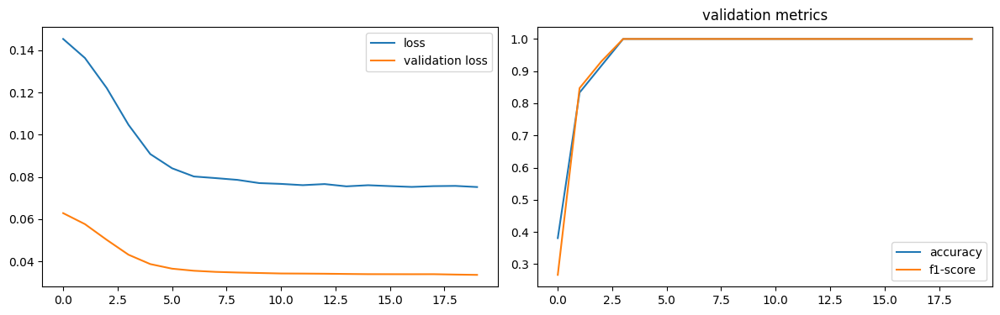

num of dropped: 6
Test: loss: 0.5677415728569031, avg metrics: (0.9866666674613953, 0.9890217900276184)
dropping feature: (10, 'neuron12')


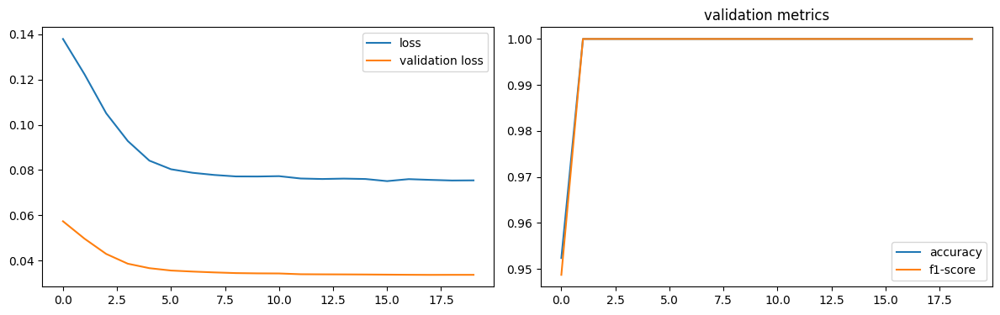

num of dropped: 7
Test: loss: 0.5657192468643188, avg metrics: (0.9911111116409301, 0.9926811933517456)
dropping feature: (53, 'neuron58')


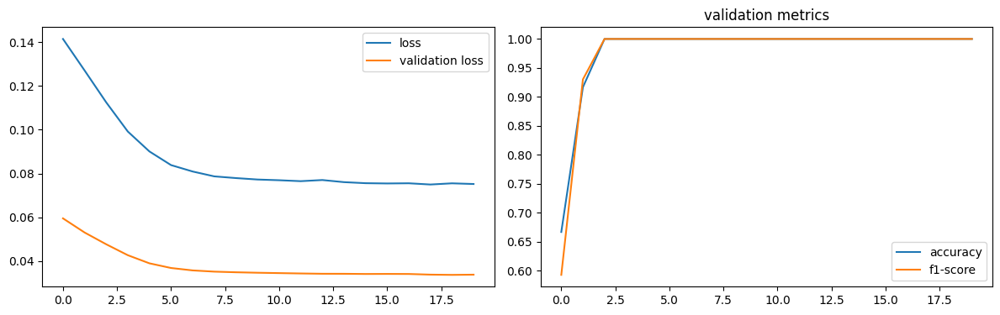

num of dropped: 8
Test: loss: 0.5671659111976624, avg metrics: (0.9911111116409301, 0.9926811933517456)
dropping feature: (46, 'neuron50')


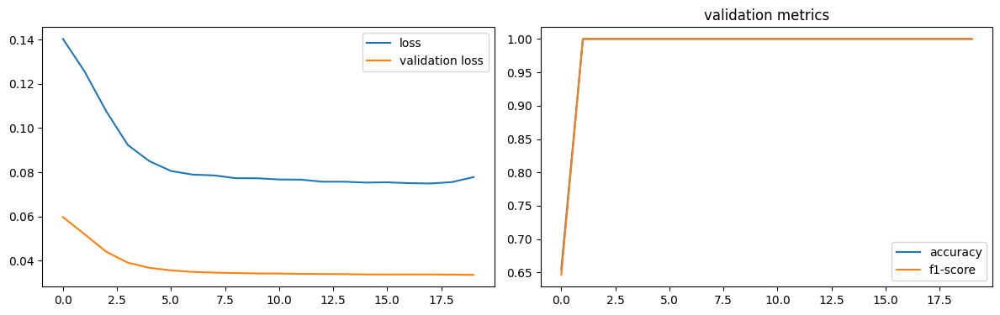

num of dropped: 9
Test: loss: 0.5669410824775696, avg metrics: (0.9955555558204651, 0.9963405966758728)
dropping feature: (24, 'neuron28')


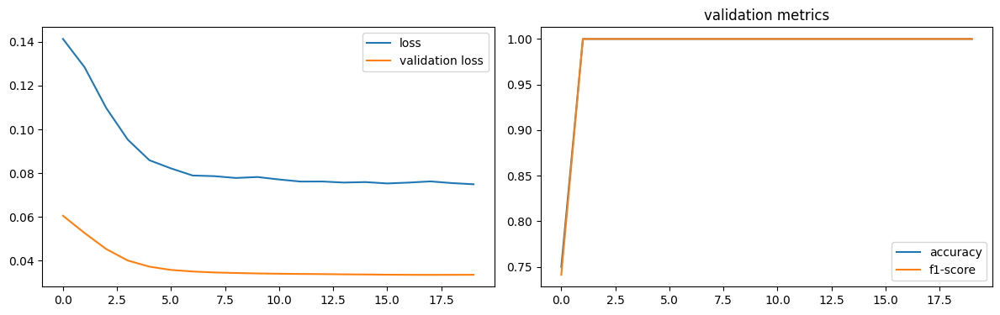

num of dropped: 10
Test: loss: 0.567872941493988, avg metrics: (0.9911111116409301, 0.9926811933517456)
dropping feature: (40, 'neuron45')


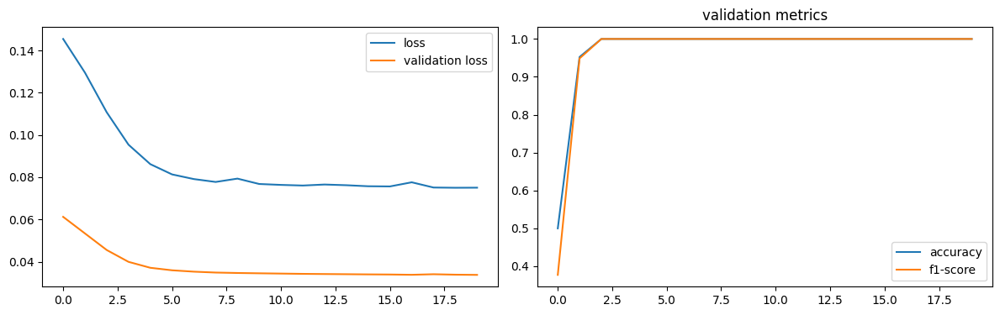

num of dropped: 11
Test: loss: 0.5661320090293884, avg metrics: (0.9911111116409301, 0.9926811933517456)
dropping feature: (8, 'neuron10')


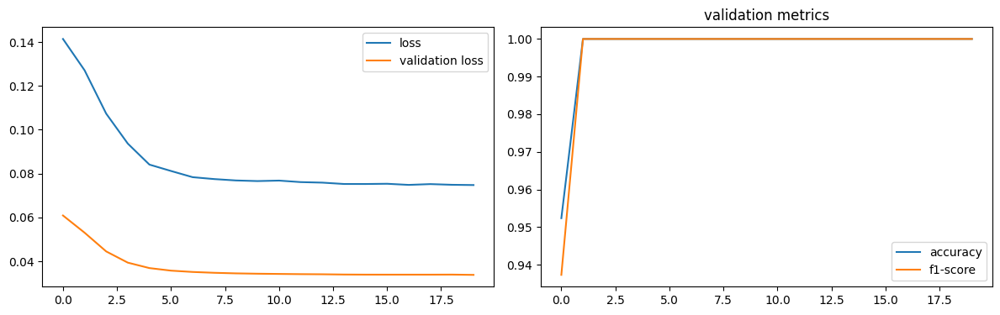

num of dropped: 12
Test: loss: 0.565573513507843, avg metrics: (0.9955555558204651, 0.9963405966758728)
dropping feature: (3, 'neuron4')


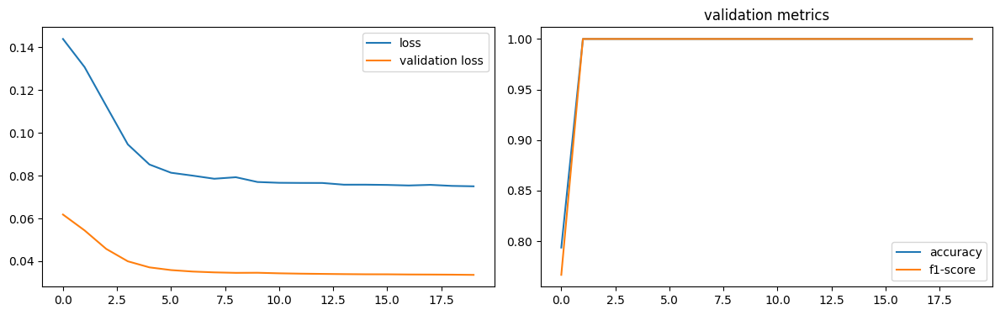

num of dropped: 13
Test: loss: 0.5669015049934387, avg metrics: (0.9911111116409301, 0.9926811933517456)
dropping feature: (44, 'neuron53')


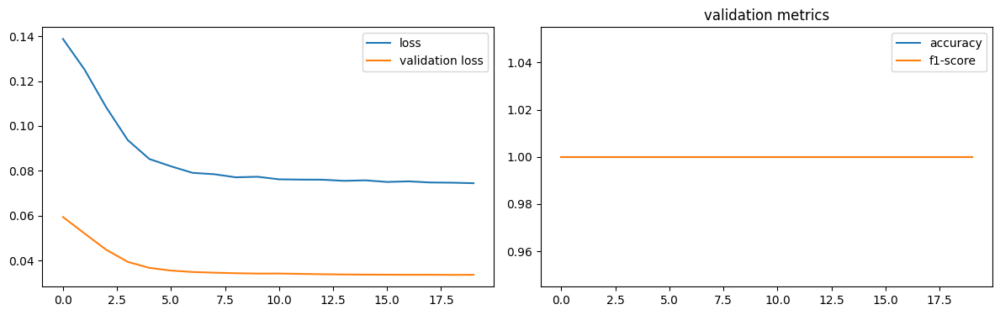

num of dropped: 14
Test: loss: 0.5695422887802124, avg metrics: (0.9822222232818604, 0.9853623867034912)
dropping feature: (24, 'neuron31')


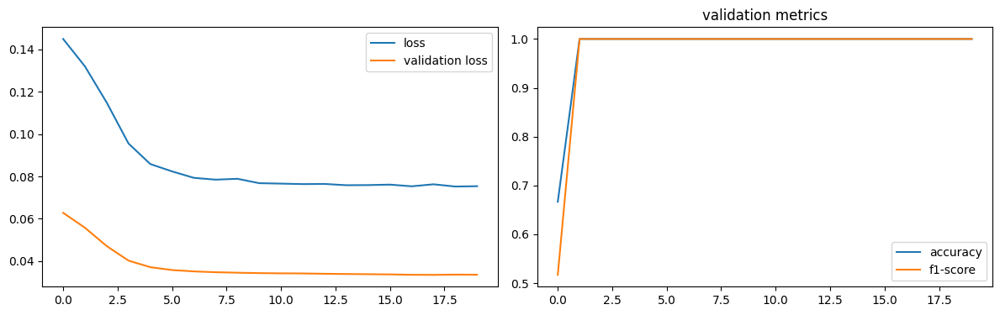

num of dropped: 15
Test: loss: 0.5659595131874084, avg metrics: (0.9866666674613953, 0.9890217900276184)
dropping feature: (19, 'neuron25')


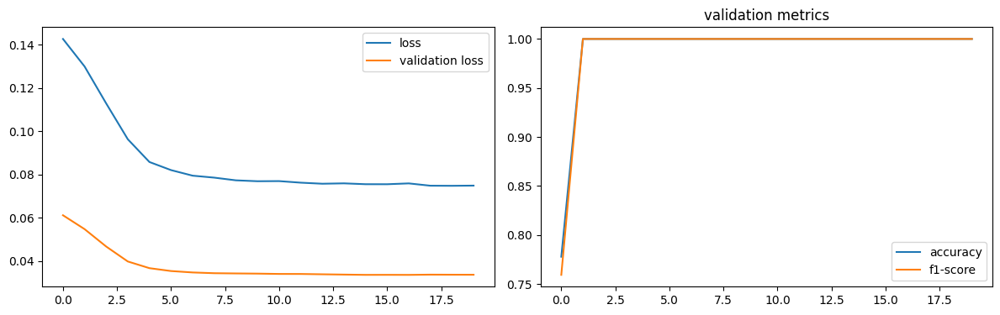

num of dropped: 16
Test: loss: 0.5636855959892273, avg metrics: (0.9911111116409301, 0.9926811933517456)
dropping feature: (9, 'neuron14')


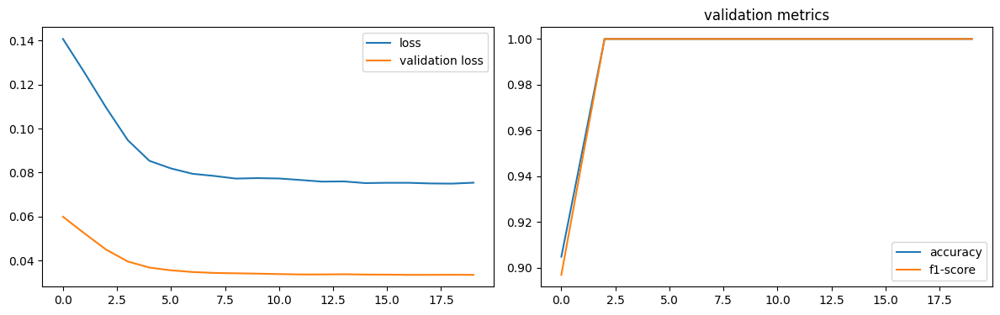

num of dropped: 17
Test: loss: 0.5673140287399292, avg metrics: (1.0, 1.0)
dropping feature: (42, 'neuron55')


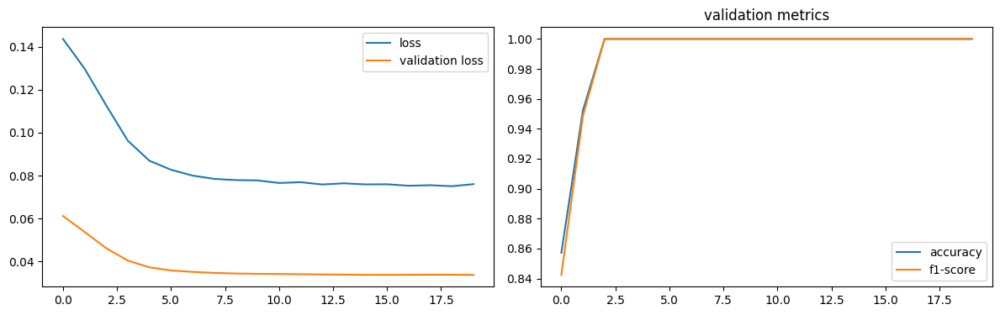

num of dropped: 18
Test: loss: 0.5674071907997131, avg metrics: (0.9955555558204651, 0.9963405966758728)
dropping feature: (10, 'neuron16')


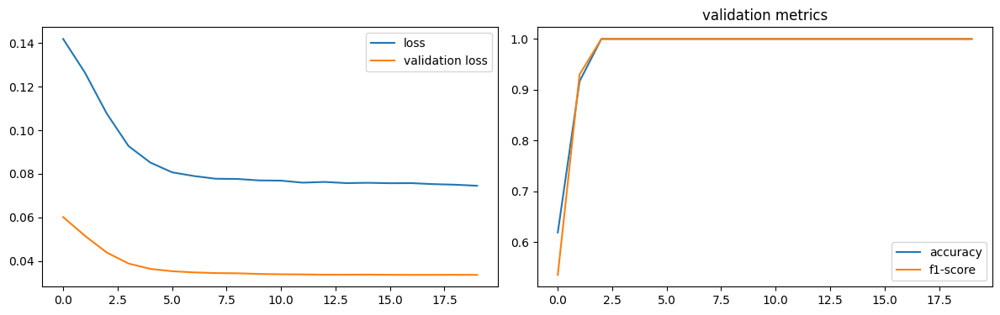

num of dropped: 19
Test: loss: 0.5677840709686279, avg metrics: (0.9955555558204651, 0.9963405966758728)
dropping feature: (25, 'neuron36')


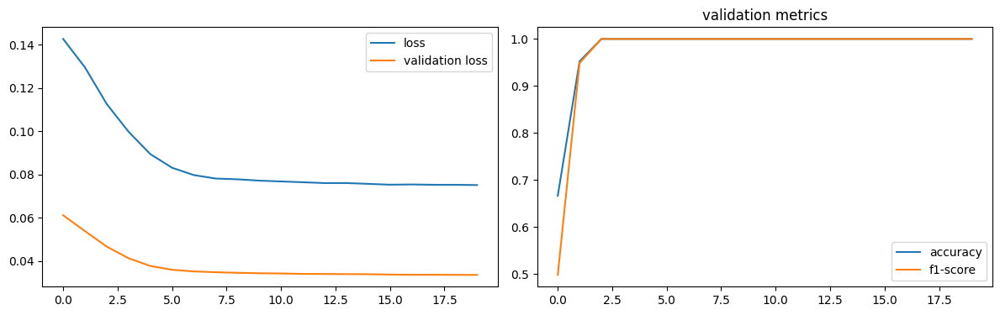

num of dropped: 20
Test: loss: 0.5693858861923218, avg metrics: (0.9911111116409301, 0.9926811933517456)
dropping feature: (18, 'neuron27')


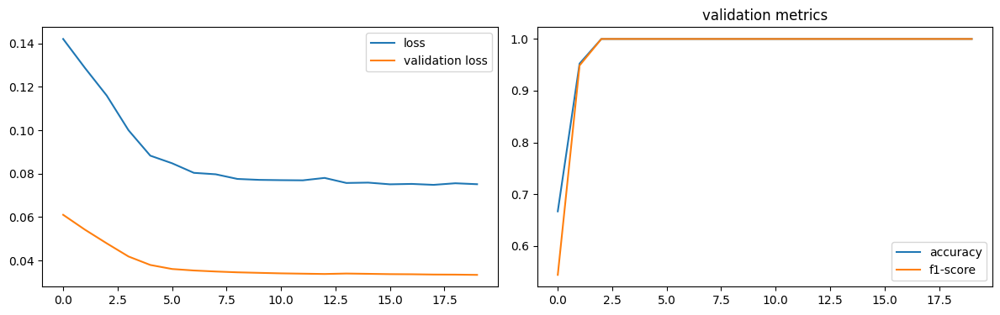

num of dropped: 21
Test: loss: 0.5672957301139832, avg metrics: (0.9955555558204651, 0.9963405966758728)
dropping feature: (10, 'neuron17')


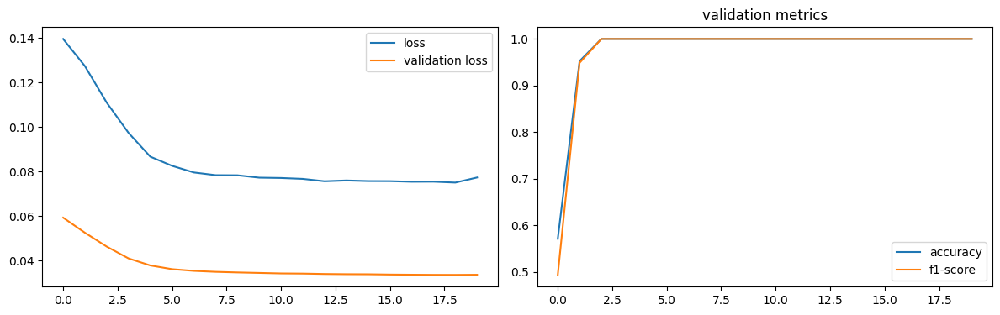

num of dropped: 22
Test: loss: 0.5661386847496033, avg metrics: (0.9955555558204651, 0.9963405966758728)
dropping feature: (31, 'neuron46')


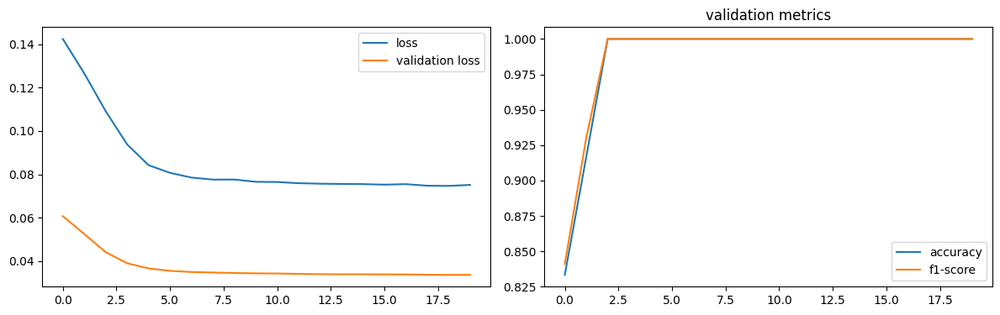

num of dropped: 23
Test: loss: 0.564464807510376, avg metrics: (0.9955555558204651, 0.9963405966758728)
dropping feature: (5, 'neuron8')


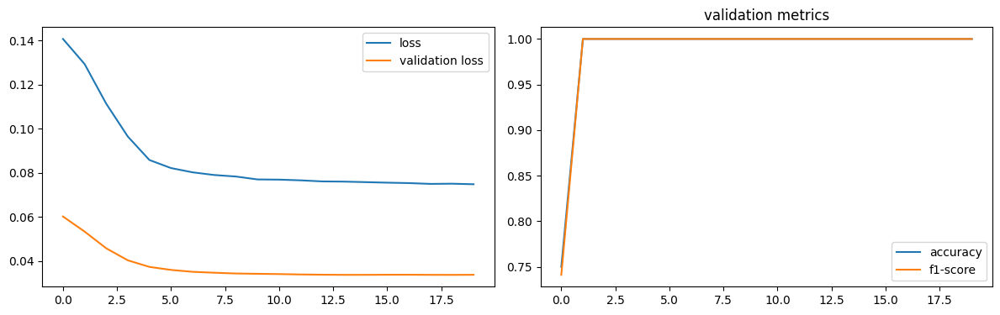

num of dropped: 24
Test: loss: 0.5685268640518188, avg metrics: (0.9955555558204651, 0.9963405966758728)
dropping feature: (23, 'neuron38')


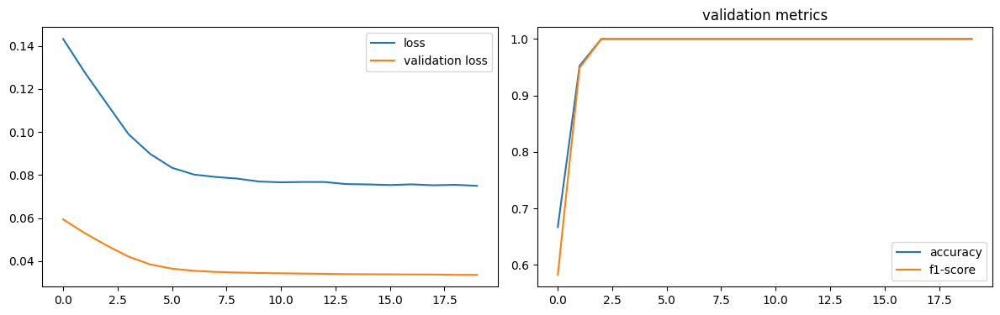

num of dropped: 25
Test: loss: 0.5684117674827576, avg metrics: (0.9822222232818604, 0.9853623867034912)
dropping feature: (14, 'neuron24')


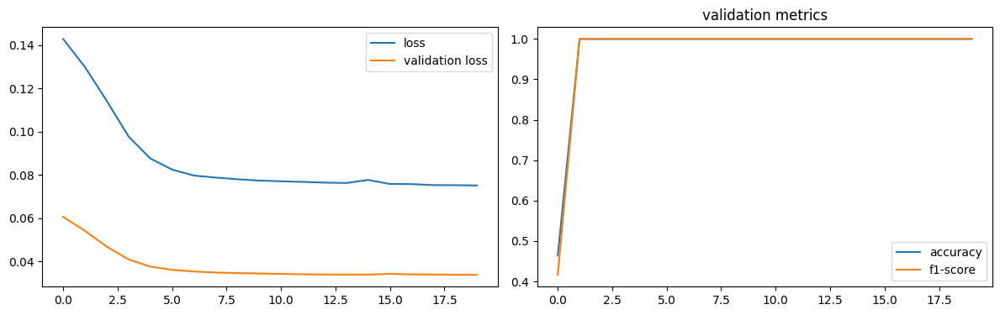

num of dropped: 26
Test: loss: 0.569572925567627, avg metrics: (0.9866666674613953, 0.9890217900276184)
dropping feature: (25, 'neuron42')


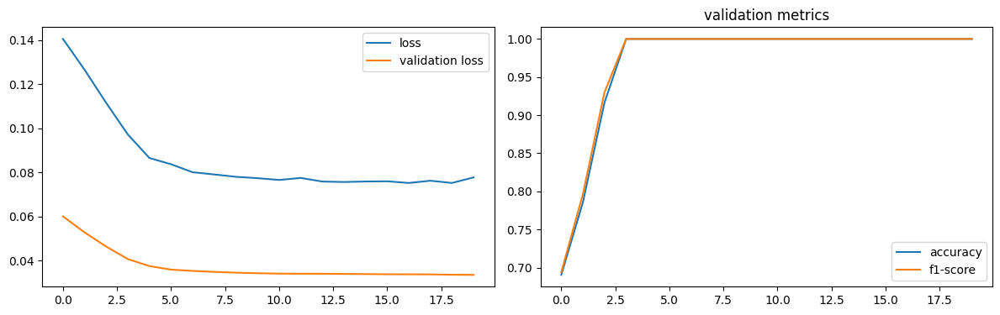

num of dropped: 27
Test: loss: 0.5651828050613403, avg metrics: (0.9866666674613953, 0.9890217900276184)
dropping feature: (22, 'neuron39')


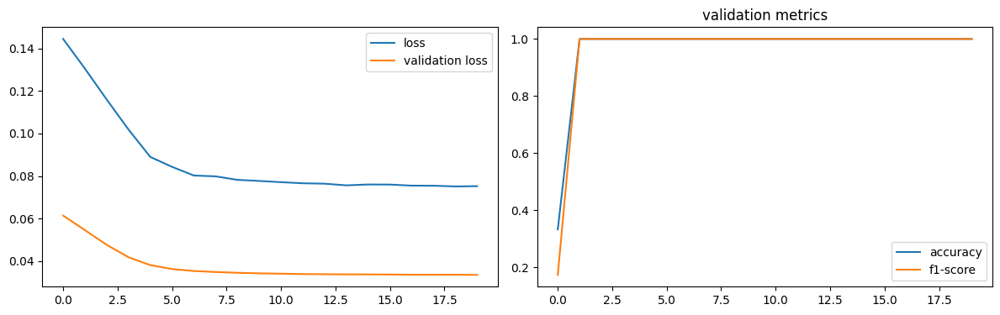

num of dropped: 28
Test: loss: 0.5685436725616455, avg metrics: (0.9866666674613953, 0.9890217900276184)
dropping feature: (6, 'neuron11')


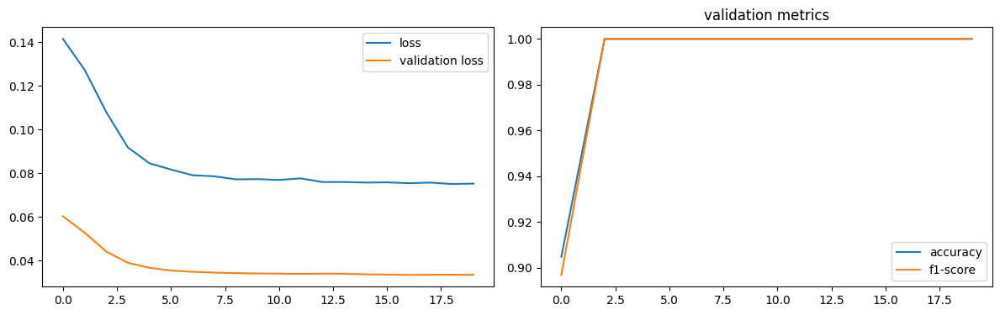

num of dropped: 29
Test: loss: 0.5678800940513611, avg metrics: (0.9911111116409301, 0.9926811933517456)
dropping feature: (18, 'neuron34')


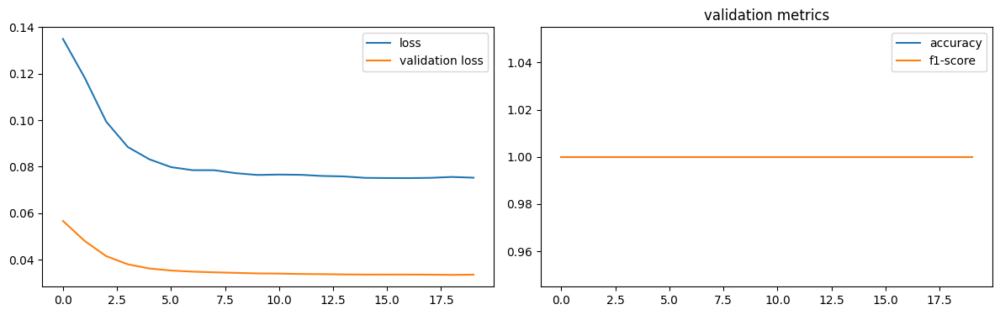

num of dropped: 30
Test: loss: 0.5664734840393066, avg metrics: (0.9911111116409301, 0.9926811933517456)
dropping feature: (1, 'neuron1')


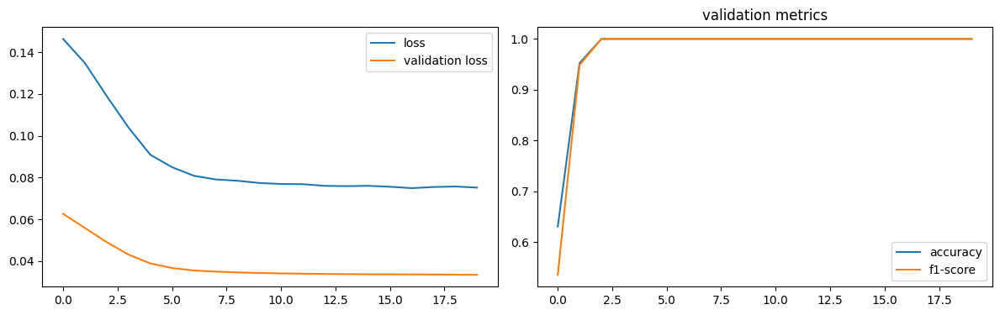

num of dropped: 31
Test: loss: 0.5672286748886108, avg metrics: (0.9822222232818604, 0.9853623867034912)
dropping feature: (32, 'neuron62')


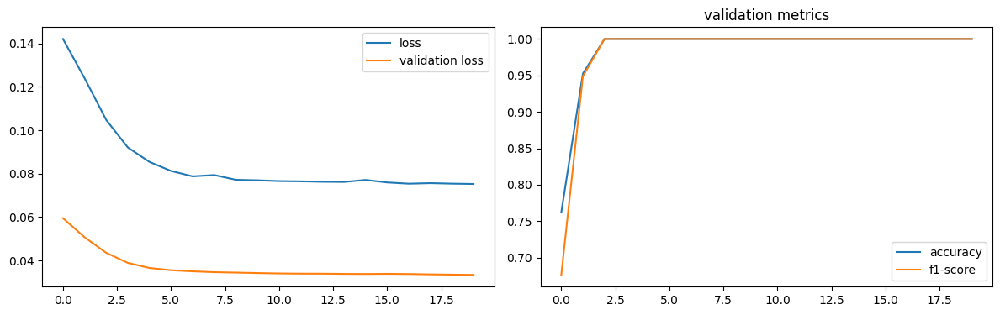

num of dropped: 32
Test: loss: 0.5687652826309204, avg metrics: (0.9822222232818604, 0.9853623867034912)
dropping feature: (1, 'neuron2')


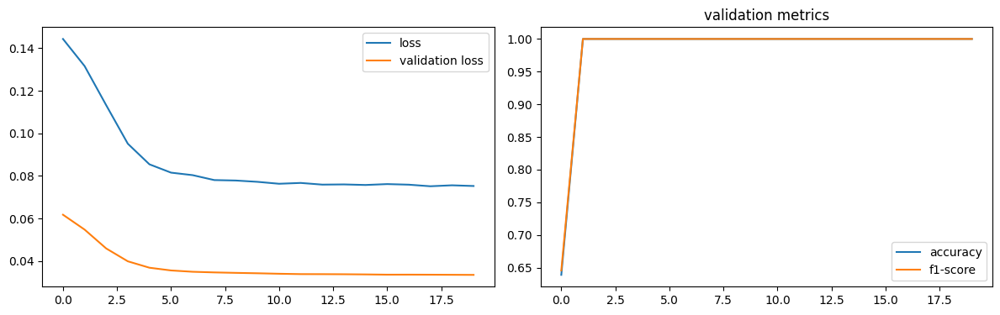

num of dropped: 33
Test: loss: 0.565693736076355, avg metrics: (0.9955555558204651, 0.9963405966758728)
dropping feature: (30, 'neuron61')


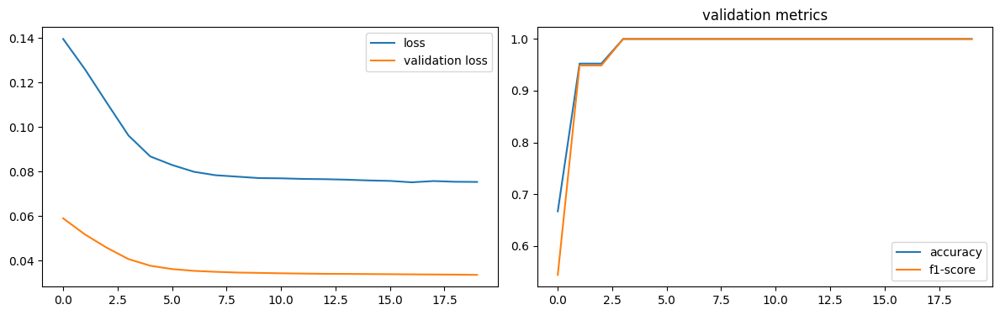

num of dropped: 34
Test: loss: 0.5695992708206177, avg metrics: (0.9866666674613953, 0.9890217900276184)
dropping feature: (4, 'neuron13')


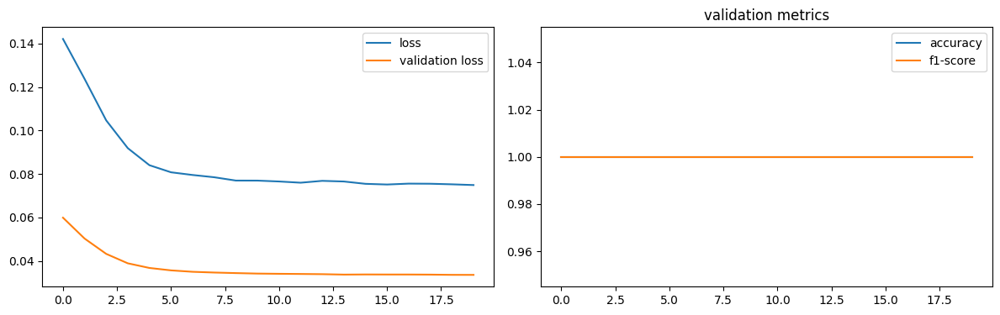

num of dropped: 35
Test: loss: 0.5687301754951477, avg metrics: (0.9866666674613953, 0.9890217900276184)
dropping feature: (28, 'neuron59')


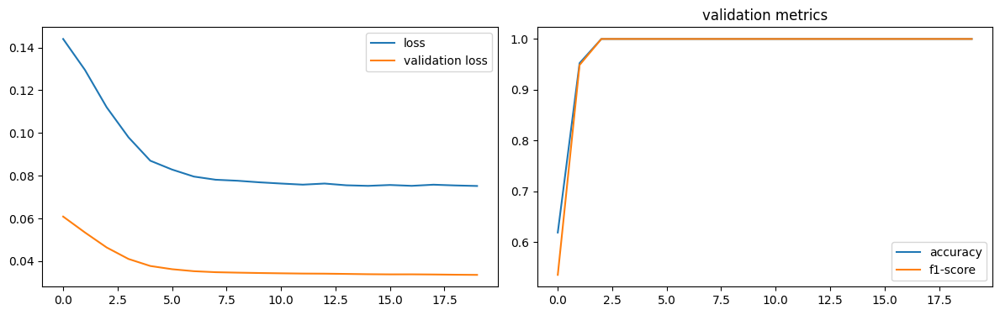

num of dropped: 36
Test: loss: 0.5682247877120972, avg metrics: (0.9777777791023254, 0.981702983379364)
dropping feature: (8, 'neuron22')


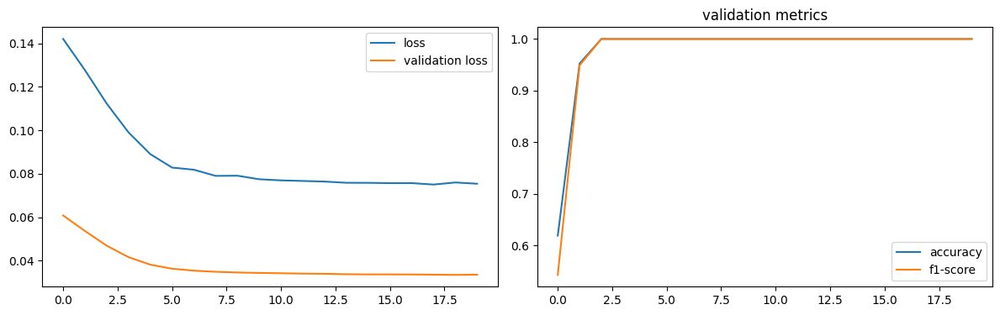

num of dropped: 37
Test: loss: 0.5675085783004761, avg metrics: (0.9777777791023254, 0.981702983379364)
dropping feature: (11, 'neuron30')


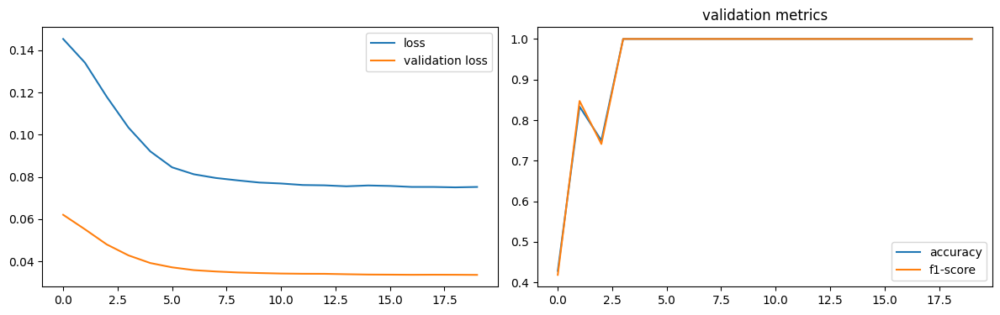

num of dropped: 38
Test: loss: 0.5692805647850037, avg metrics: (0.9822222232818604, 0.9853623867034912)
dropping feature: (22, 'neuron51')


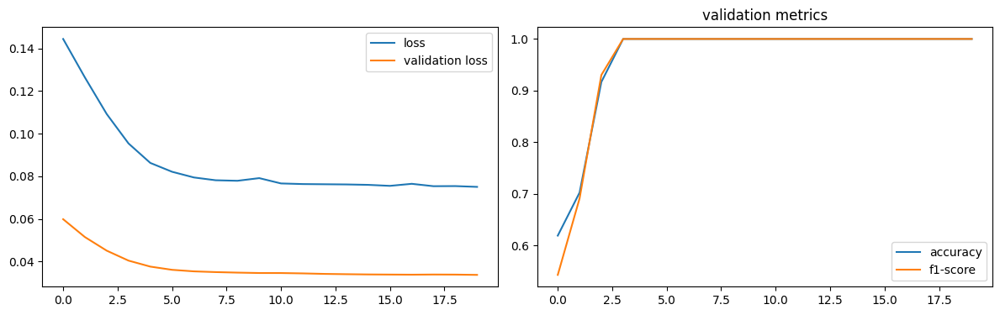

num of dropped: 39
Test: loss: 0.5700867772102356, avg metrics: (0.9866666674613953, 0.9890217900276184)
dropping feature: (17, 'neuron43')


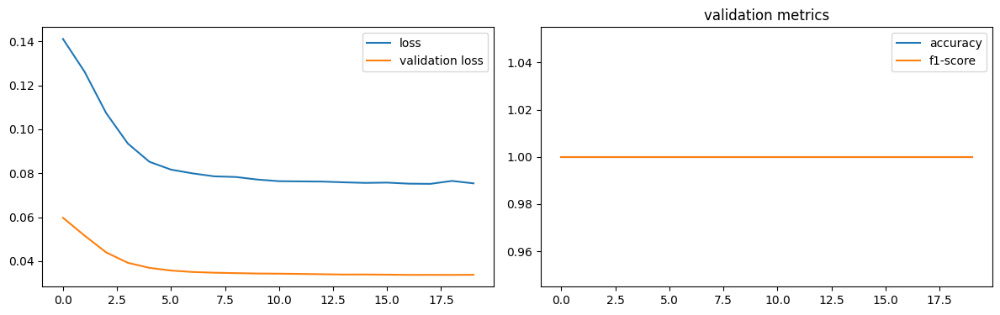

num of dropped: 40
Test: loss: 0.5671711564064026, avg metrics: (0.9822222232818604, 0.9853623867034912)
dropping feature: (21, 'neuron52')


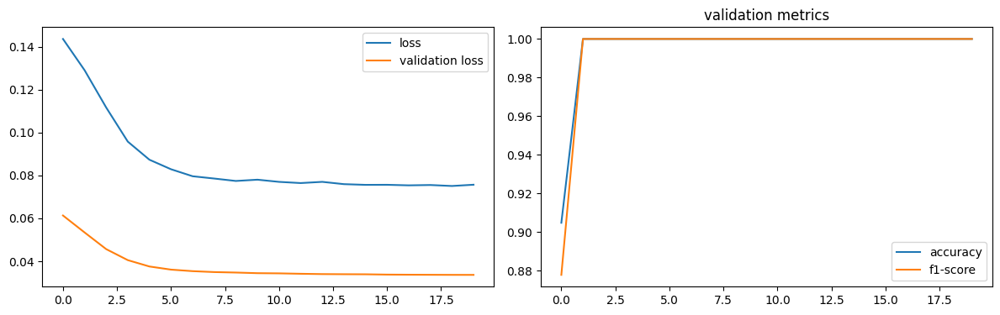

num of dropped: 41
Test: loss: 0.5686705112457275, avg metrics: (0.9866666674613953, 0.9890217900276184)
dropping feature: (19, 'neuron48')


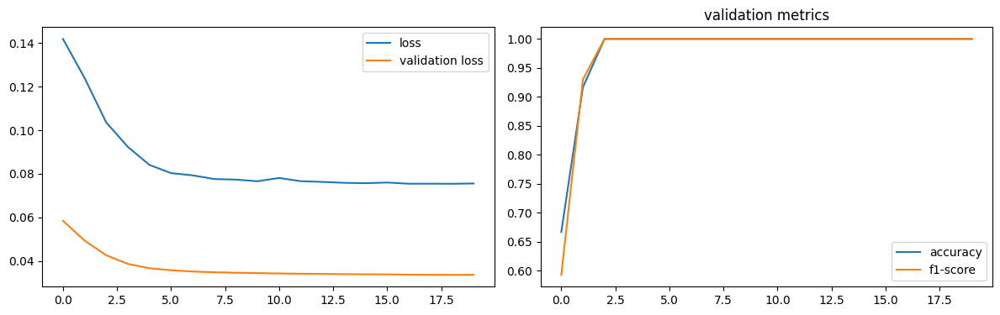

num of dropped: 42
Test: loss: 0.5673927068710327, avg metrics: (0.9822222232818604, 0.9853623867034912)
dropping feature: (18, 'neuron47')


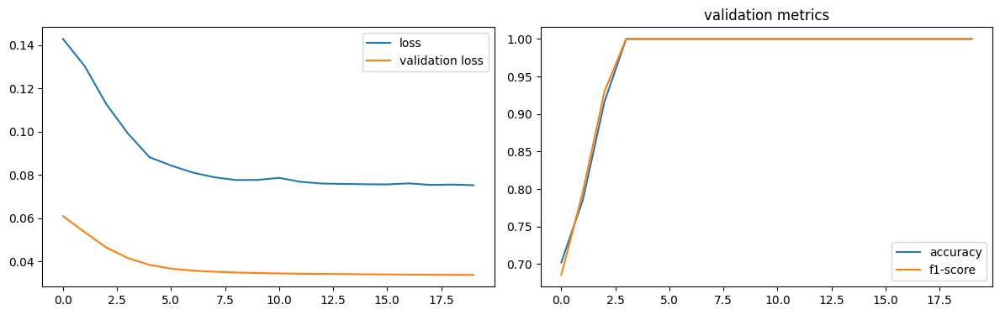

num of dropped: 43
Test: loss: 0.5689860582351685, avg metrics: (0.9822222232818604, 0.9853623867034912)
dropping feature: (20, 'neuron57')


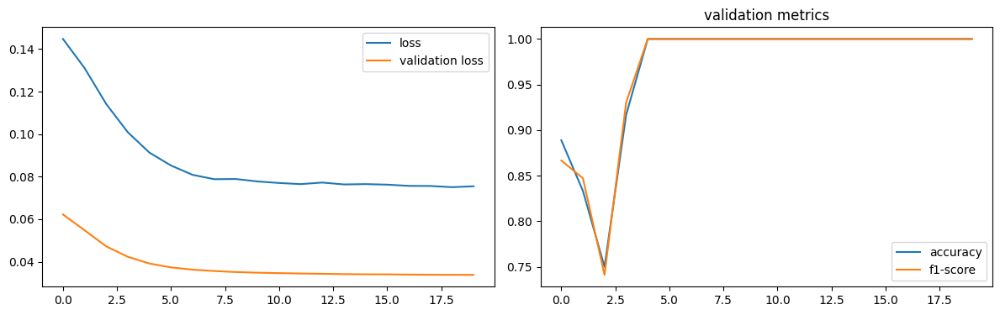

num of dropped: 44
Test: loss: 0.5661293864250183, avg metrics: (0.9822222232818604, 0.9853623867034912)
dropping feature: (16, 'neuron41')


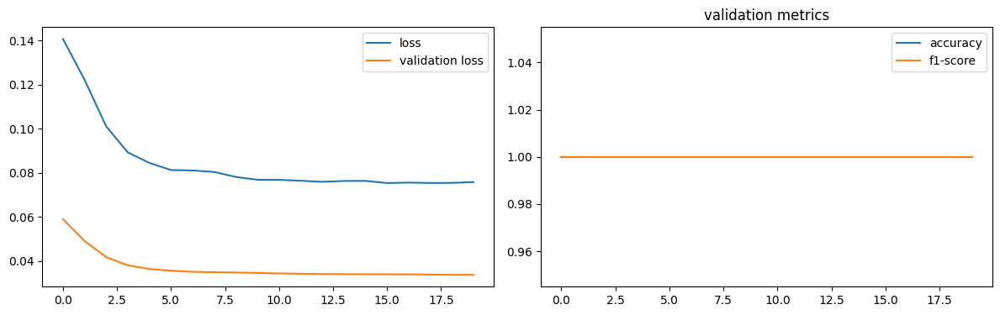

num of dropped: 45
Test: loss: 0.5693560838699341, avg metrics: (0.9822222232818604, 0.9853623867034912)
dropping feature: (0, 'neuron0')


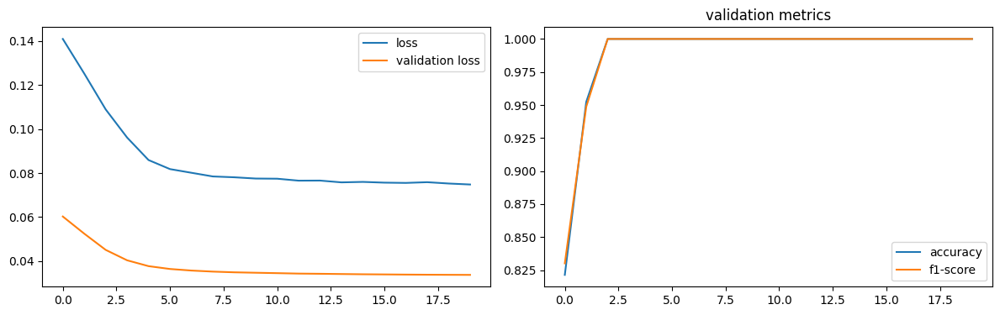

num of dropped: 46
Test: loss: 0.5672212243080139, avg metrics: (0.9822222232818604, 0.9853623867034912)
dropping feature: (2, 'neuron9')


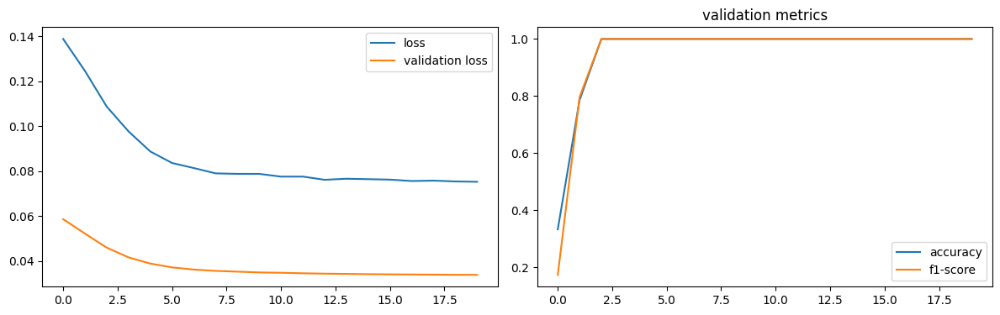

num of dropped: 47
Test: loss: 0.569084644317627, avg metrics: (0.9777777791023254, 0.981702983379364)
dropping feature: (16, 'neuron54')


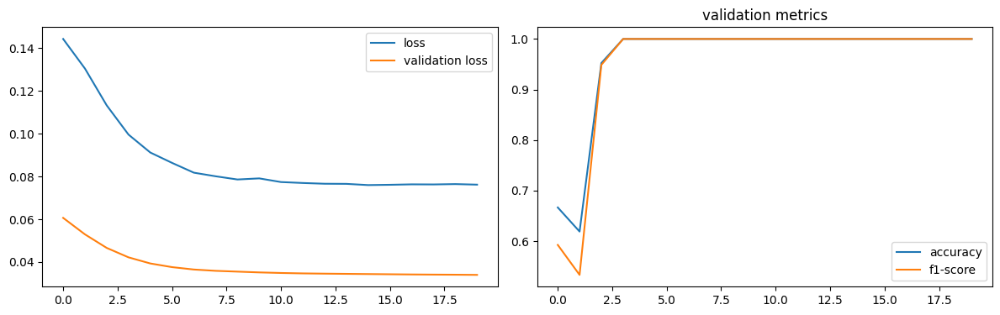

num of dropped: 48
Test: loss: 0.5704476237297058, avg metrics: (0.9822222232818604, 0.9853623867034912)
dropping feature: (3, 'neuron18')


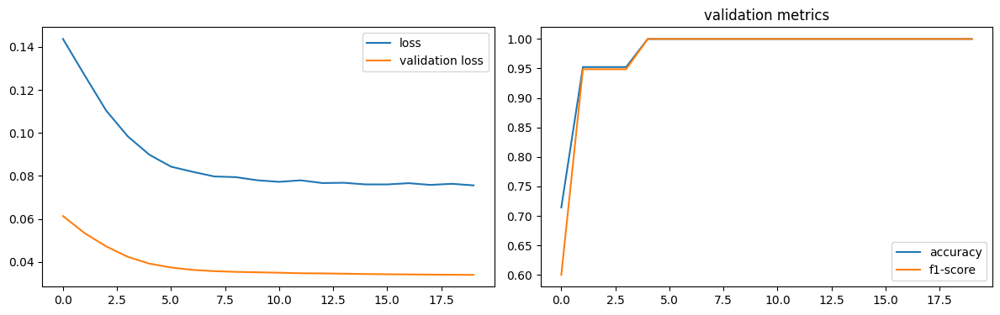

num of dropped: 49
Test: loss: 0.5689056515693665, avg metrics: (0.9777777791023254, 0.981702983379364)
dropping feature: (13, 'neuron44')


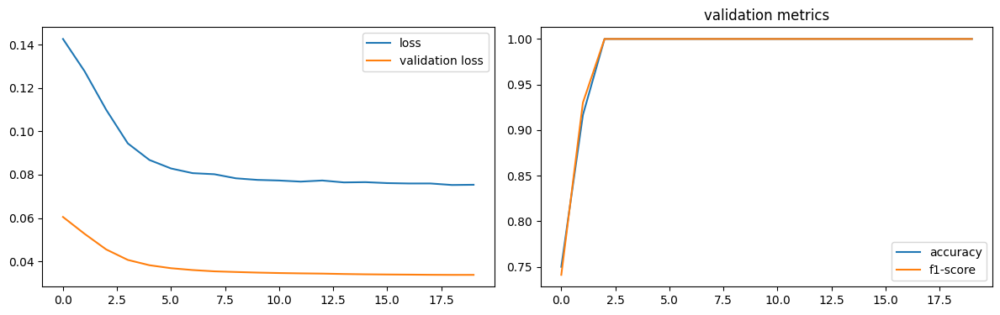

num of dropped: 50
Test: loss: 0.5702917575836182, avg metrics: (0.9866666674613953, 0.9890217900276184)
dropping feature: (0, 'neuron5')


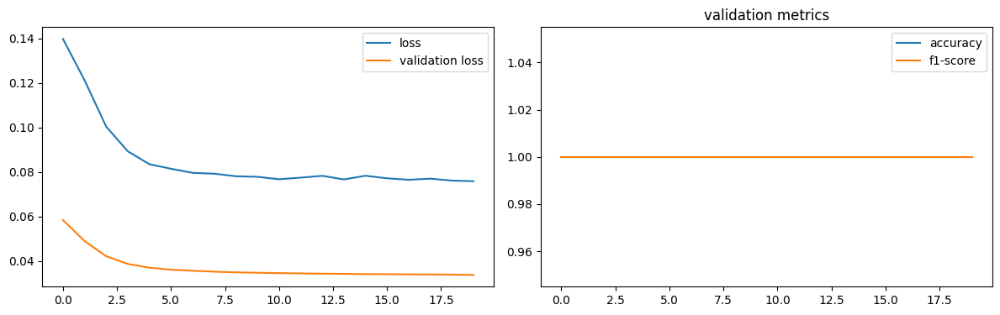

num of dropped: 51
Test: loss: 0.5699470639228821, avg metrics: (0.9777777791023254, 0.981702983379364)
dropping feature: (11, 'neuron40')


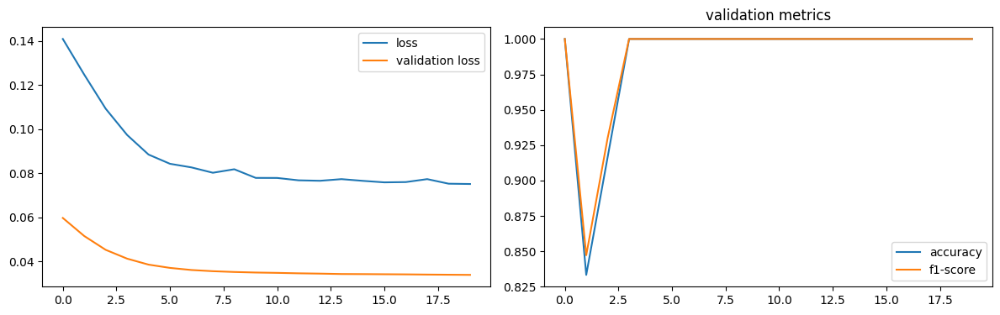

num of dropped: 52
Test: loss: 0.574454665184021, avg metrics: (0.9777777791023254, 0.981702983379364)
dropping feature: (9, 'neuron35')


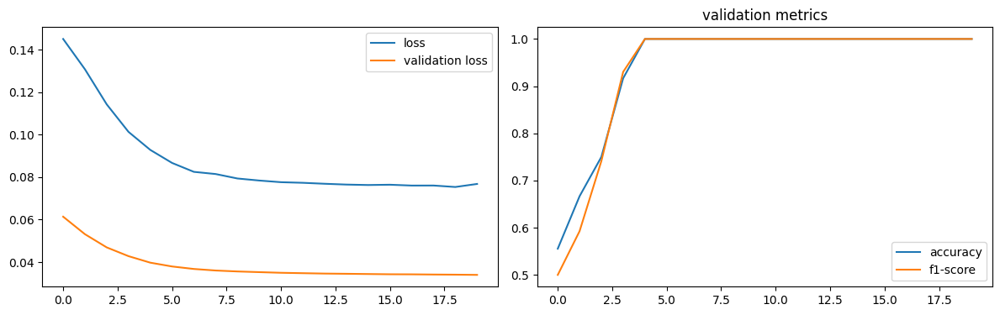

num of dropped: 53
Test: loss: 0.5732682943344116, avg metrics: (0.9777777791023254, 0.981702983379364)
dropping feature: (4, 'neuron23')


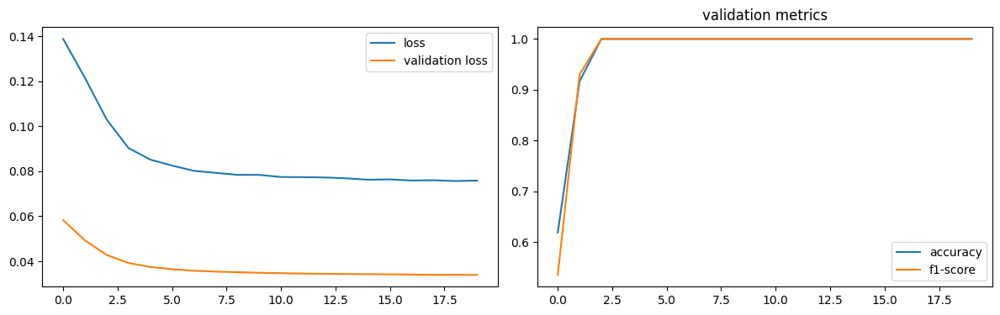

num of dropped: 54
Test: loss: 0.5770469903945923, avg metrics: (0.9777777791023254, 0.981702983379364)
dropping feature: (5, 'neuron29')


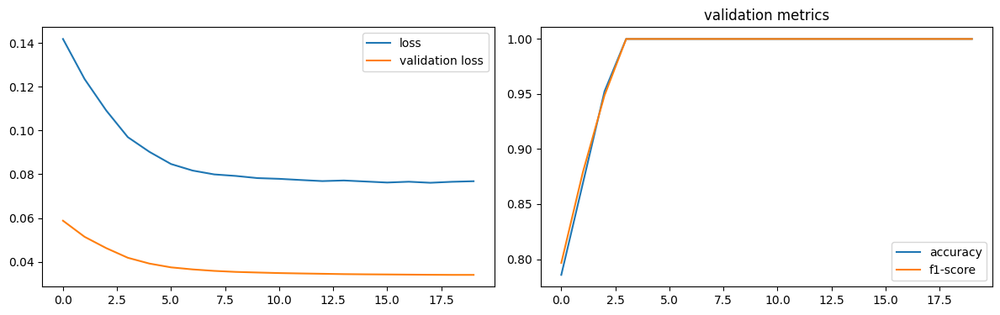

num of dropped: 55
Test: loss: 0.580142080783844, avg metrics: (0.975, 0.9781401634216309)
dropping feature: (3, 'neuron20')


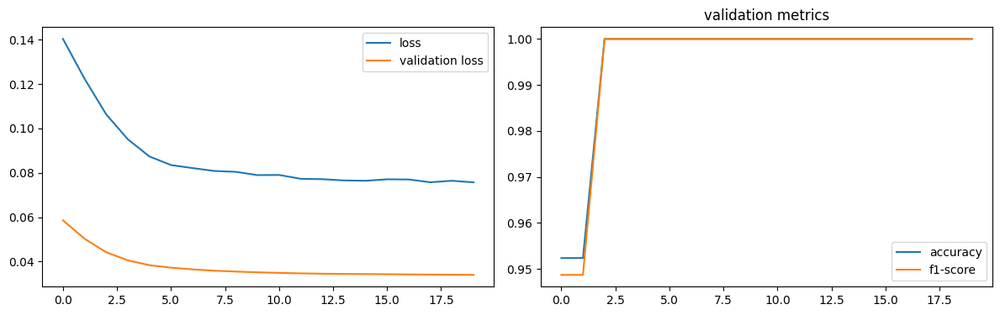

num of dropped: 56
Test: loss: 0.5721319913864136, avg metrics: (0.9777777791023254, 0.981702983379364)
dropping feature: (2, 'neuron19')


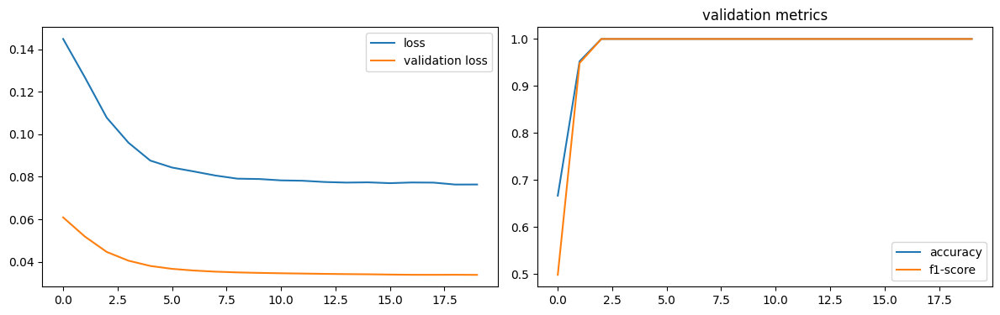

num of dropped: 57
Test: loss: 0.573125958442688, avg metrics: (0.9777777791023254, 0.981702983379364)
dropping feature: (4, 'neuron33')


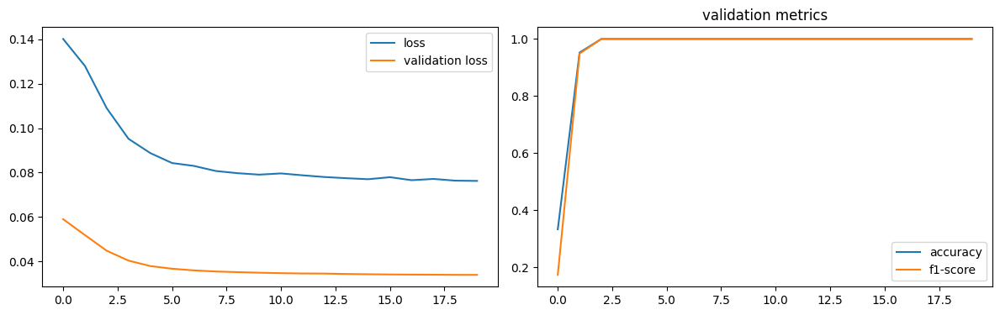

num of dropped: 58
Test: loss: 0.570783257484436, avg metrics: (0.9911111116409301, 0.9926811933517456)
dropping feature: (4, 'neuron37')


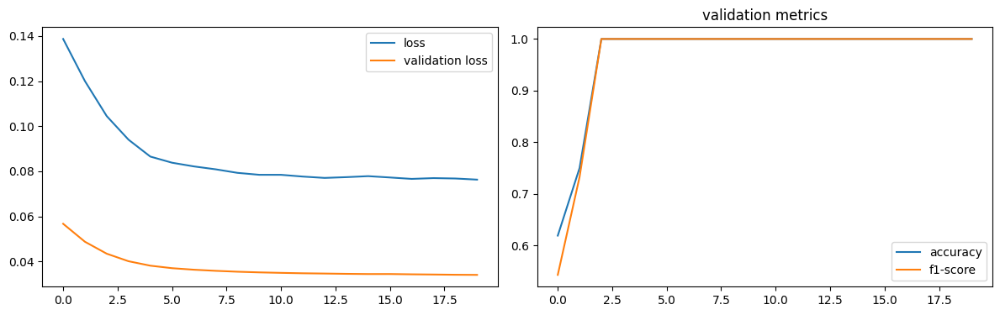

num of dropped: 59
Test: loss: 0.5700690150260925, avg metrics: (1.0, 1.0)
dropping feature: (0, 'neuron6')


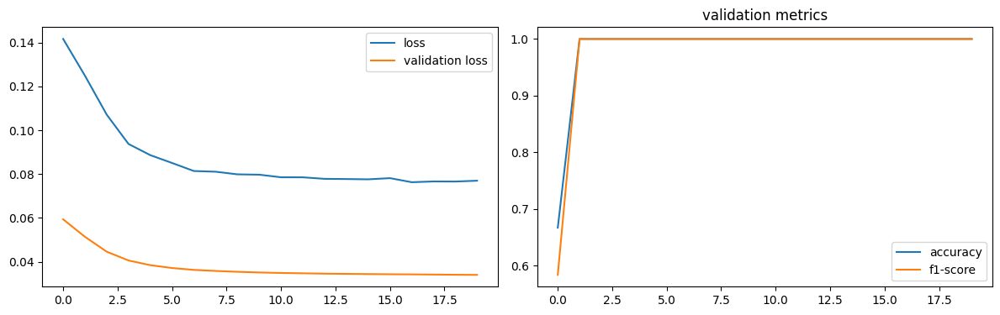

num of dropped: 60
Test: loss: 0.5688747763633728, avg metrics: (1.0, 1.0)
dropping feature: (3, 'neuron49')


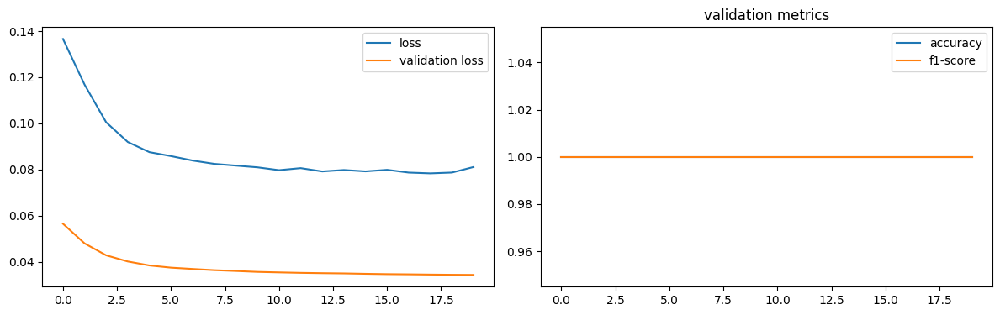

num of dropped: 61
Test: loss: 0.5805401802062988, avg metrics: (1.0, 1.0)
dropping feature: (1, 'neuron26')


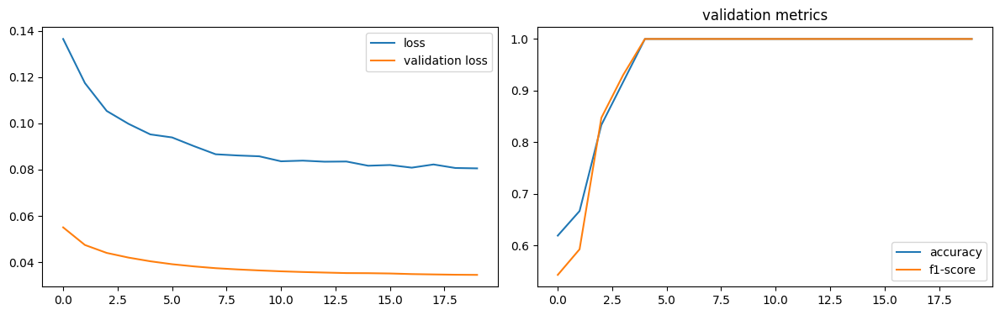

num of dropped: 62
Test: loss: 0.6198735237121582, avg metrics: (0.969444477558136, 0.9625608444213867)
dropping feature: (1, 'neuron32')


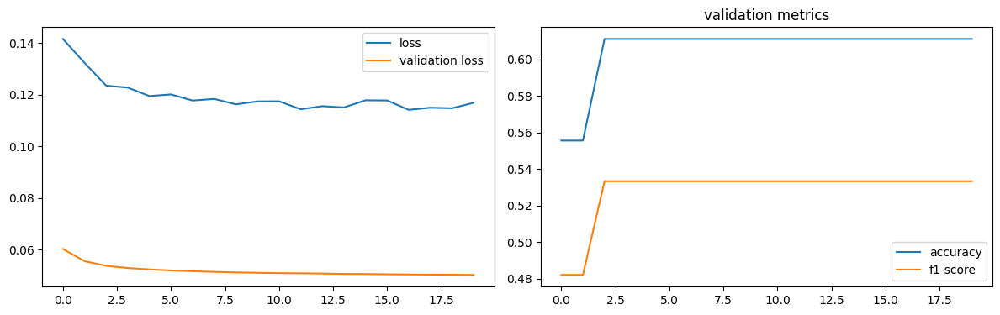

num of dropped: 63
Test: loss: 0.855955183506012, avg metrics: (0.6, 0.4963883101940155)


In [32]:
torch.manual_seed(2024)

headers = [f"neuron{i}" for i in range(64)]

def model_factory(size):
    model = WineNN(1, (size, 64))
    model.layer1 = nn.Identity()
    return model


test_metrics, dropped, models = prune(
    datasets, headers, analyze_fast,
    model_factory, optimizer_factory, criterion, score_outputs, 20,
    labels, "", None
)

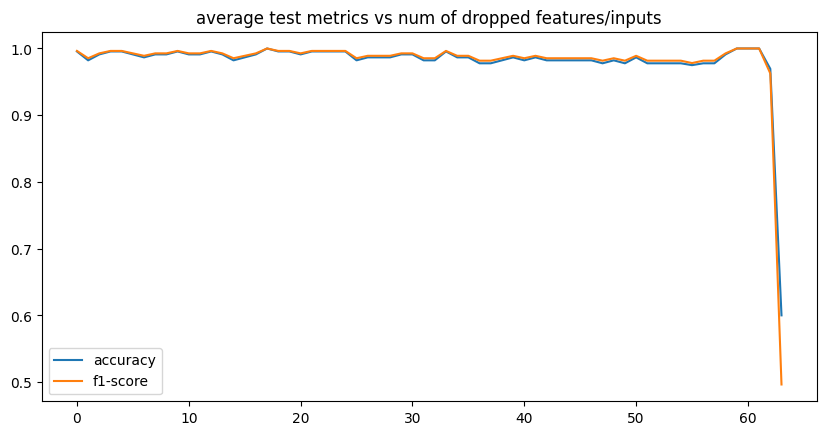

In [33]:
plot_dropping_metrics(test_metrics, labels)

In [34]:
num_drop_neurons = 61

save_models("wine", "fast-layer2", models, dropped)

reduced_datasets, reduced_headers = reduce_datasets(datasets, headers, dropped, num_drop_neurons)
layer = models[num_drop_neurons].layer2

best_model.layer2 = layer
best_model.layer1[0] = reduce_linear(best_model.layer1[0], dropped, num_drop_neurons)

features left [3]:  ['neuron15', 'neuron26', 'neuron32']


### 2nd hidden layer

In [35]:
layer.eval()

datasets = {
    key: TensorDataset(
        layer(dataset.tensors[0]).detach(),
        dataset.tensors[1]
    )
    for key, dataset in reduced_datasets.items()
}

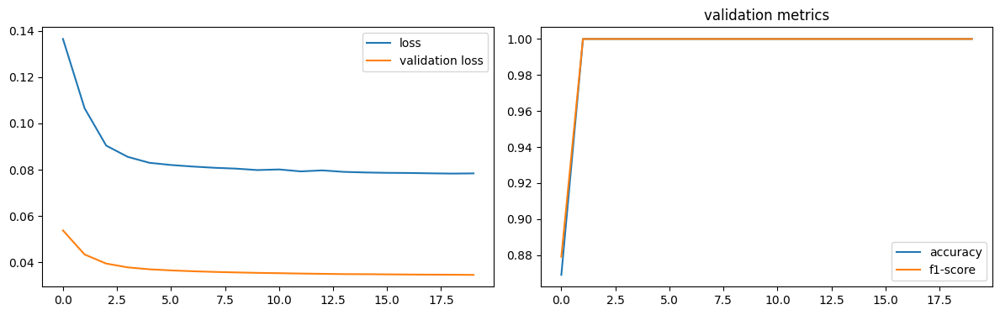

num of dropped: 0
Test: loss: 0.582146167755127, avg metrics: (1.0, 1.0)
dropping feature: (41, 'neuron41')


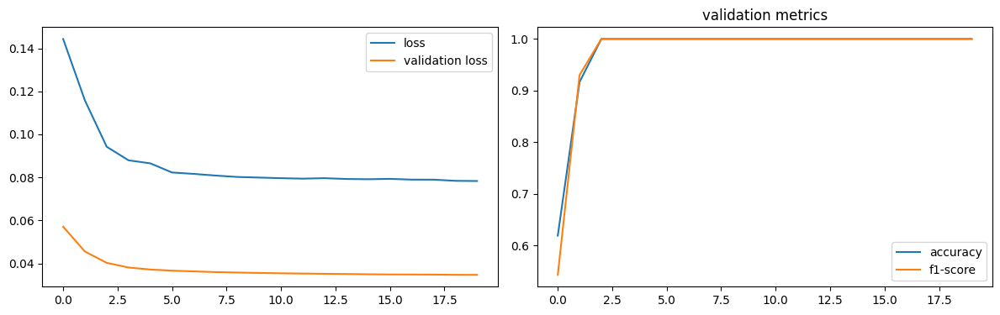

num of dropped: 1
Test: loss: 0.5823897123336792, avg metrics: (1.0, 1.0)
dropping feature: (27, 'neuron27')


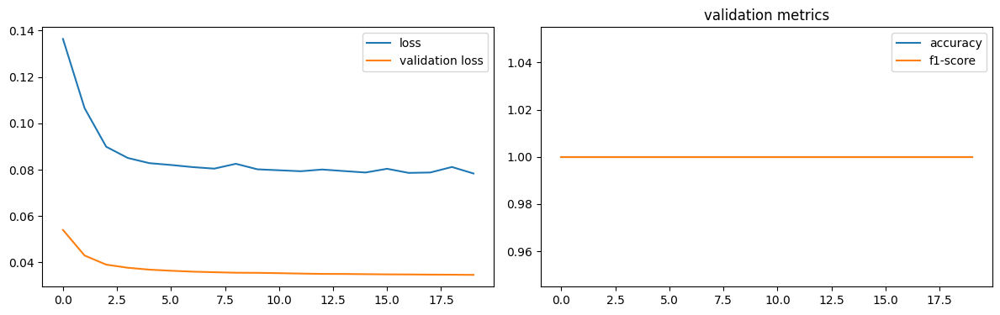

num of dropped: 2
Test: loss: 0.5814683437347412, avg metrics: (1.0, 1.0)
dropping feature: (32, 'neuron33')


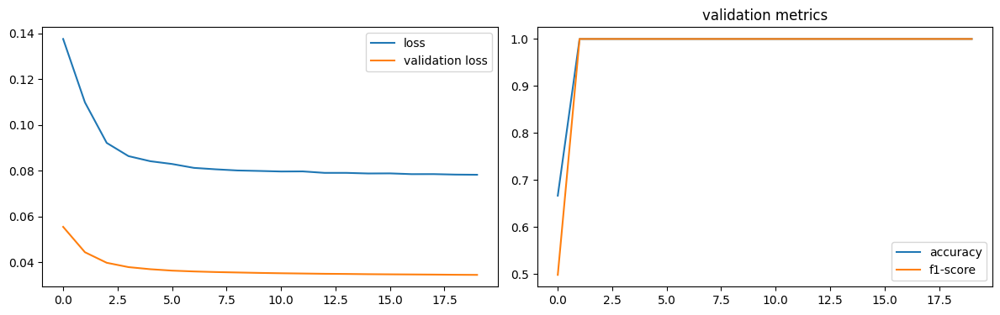

num of dropped: 3
Test: loss: 0.5829333066940308, avg metrics: (1.0, 1.0)
dropping feature: (26, 'neuron26')


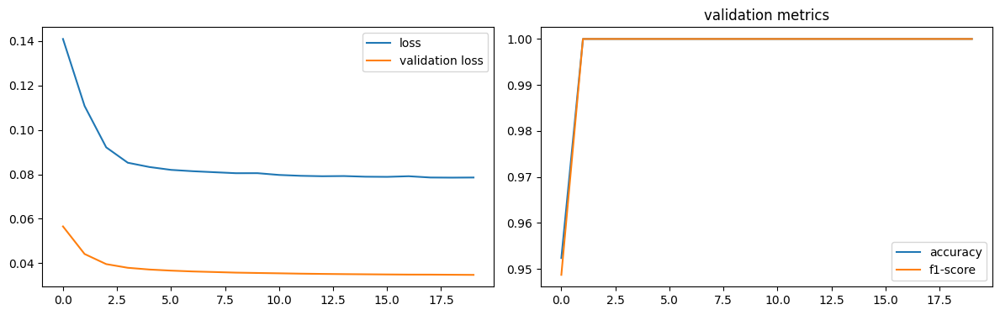

num of dropped: 4
Test: loss: 0.5817455053329468, avg metrics: (1.0, 1.0)
dropping feature: (12, 'neuron12')


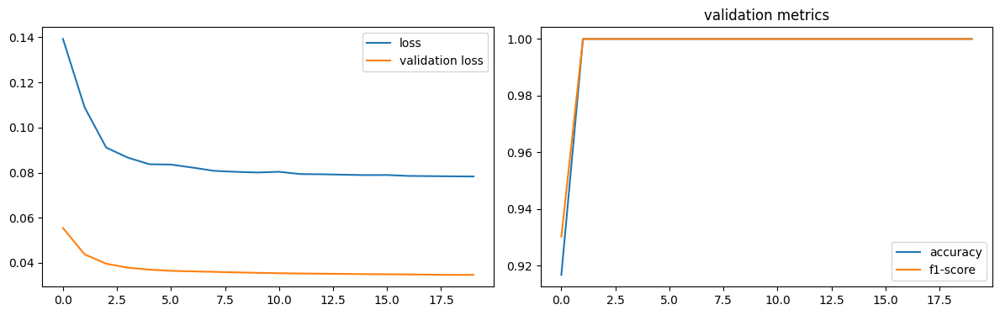

num of dropped: 5
Test: loss: 0.5822956562042236, avg metrics: (1.0, 1.0)
dropping feature: (14, 'neuron15')


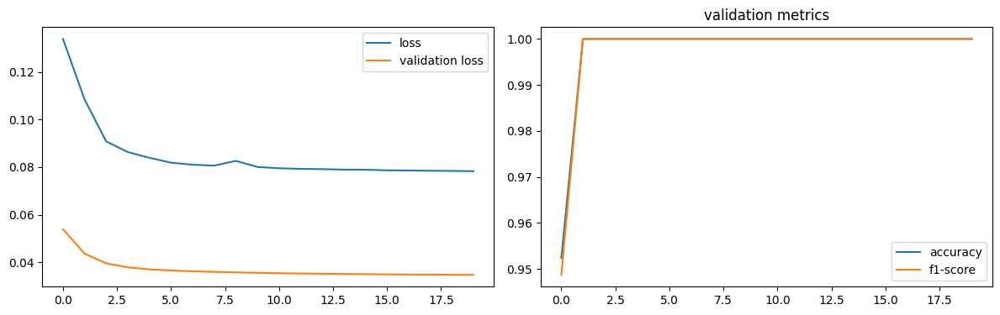

num of dropped: 6
Test: loss: 0.5822733044624329, avg metrics: (1.0, 1.0)
dropping feature: (29, 'neuron34')


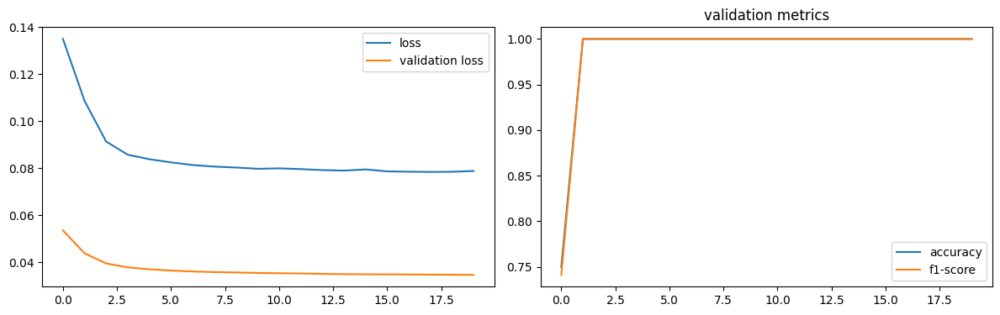

num of dropped: 7
Test: loss: 0.5820614099502563, avg metrics: (1.0, 1.0)
dropping feature: (14, 'neuron16')


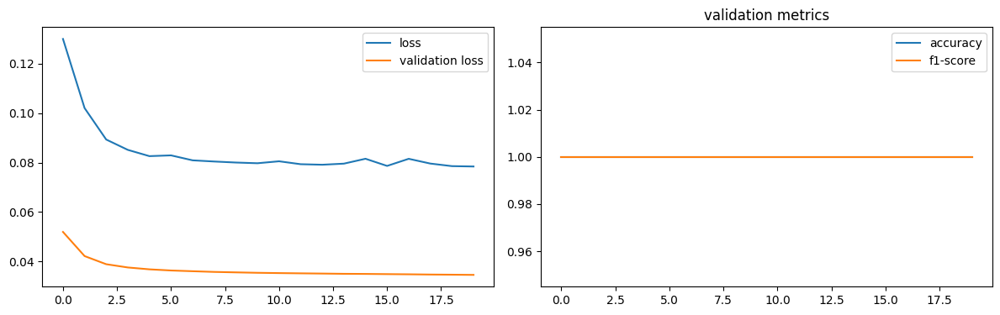

num of dropped: 8
Test: loss: 0.5840029716491699, avg metrics: (1.0, 1.0)
dropping feature: (54, 'neuron62')


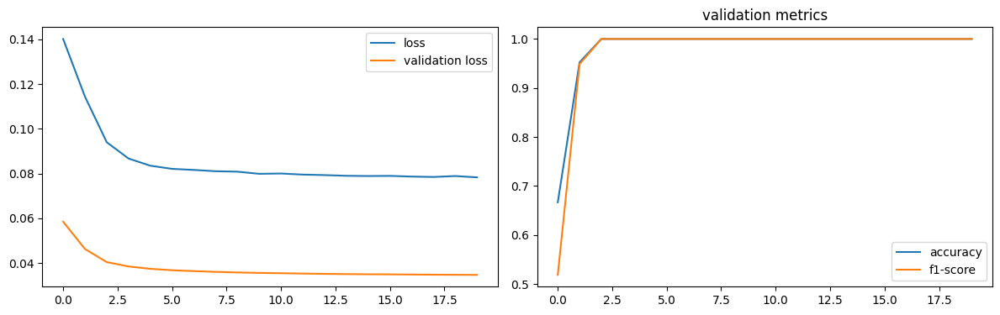

num of dropped: 9
Test: loss: 0.582711935043335, avg metrics: (1.0, 1.0)
dropping feature: (23, 'neuron28')


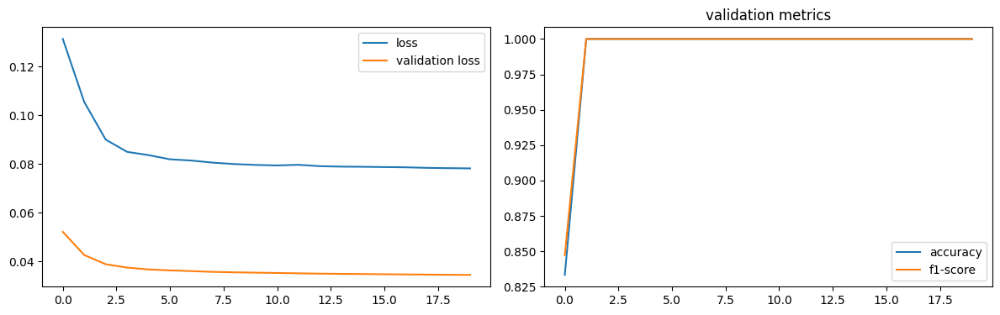

num of dropped: 10
Test: loss: 0.5822012424468994, avg metrics: (1.0, 1.0)
dropping feature: (47, 'neuron56')


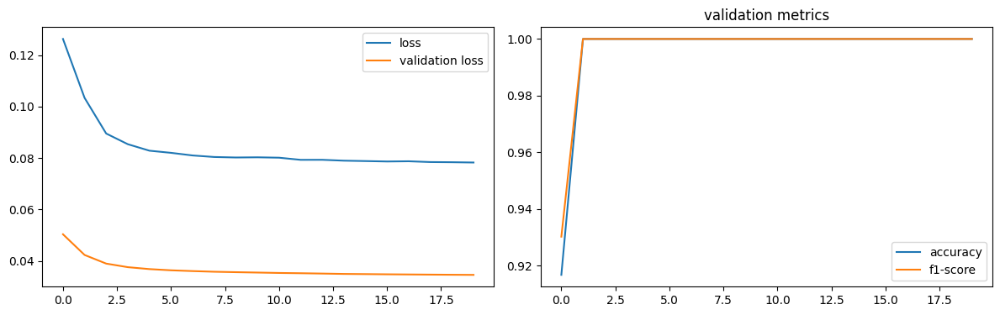

num of dropped: 11
Test: loss: 0.5821033120155334, avg metrics: (1.0, 1.0)
dropping feature: (40, 'neuron49')


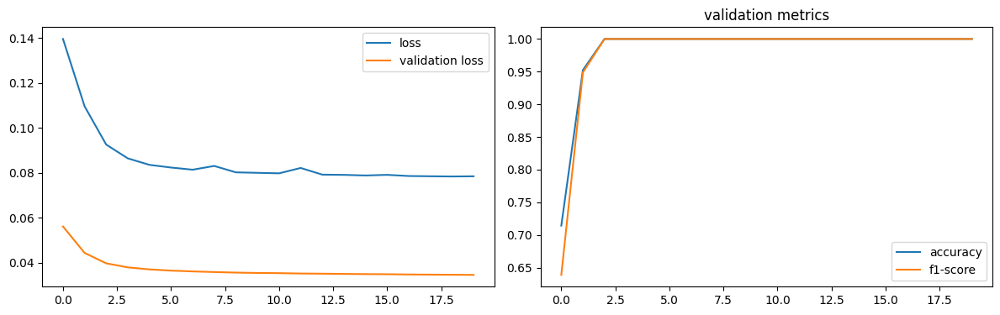

num of dropped: 12
Test: loss: 0.5824992060661316, avg metrics: (1.0, 1.0)
dropping feature: (19, 'neuron22')


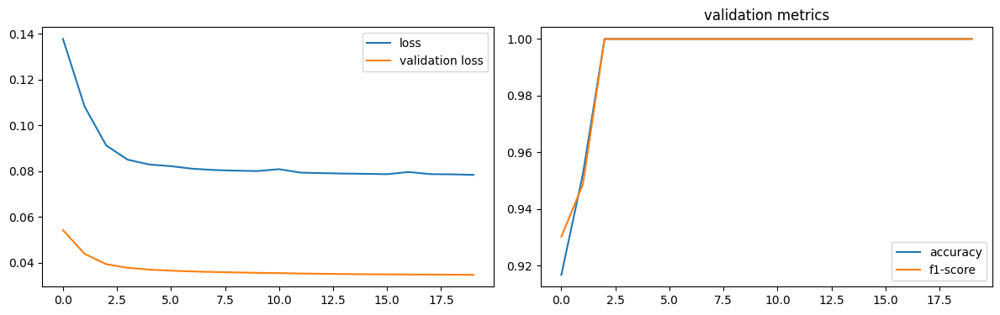

num of dropped: 13
Test: loss: 0.5821695327758789, avg metrics: (1.0, 1.0)
dropping feature: (43, 'neuron54')


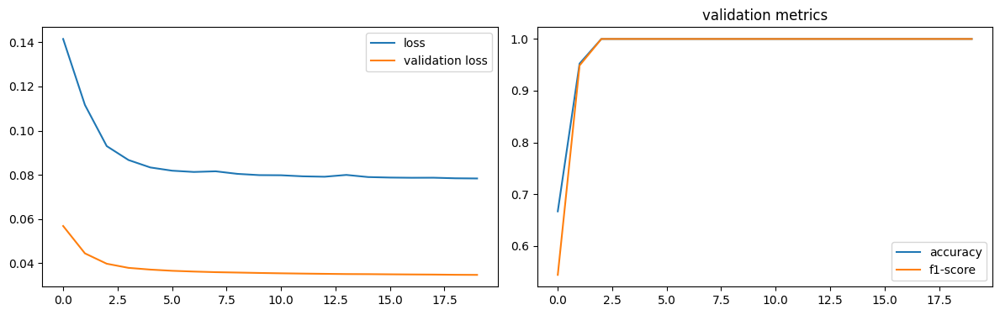

num of dropped: 14
Test: loss: 0.582406759262085, avg metrics: (1.0, 1.0)
dropping feature: (42, 'neuron53')


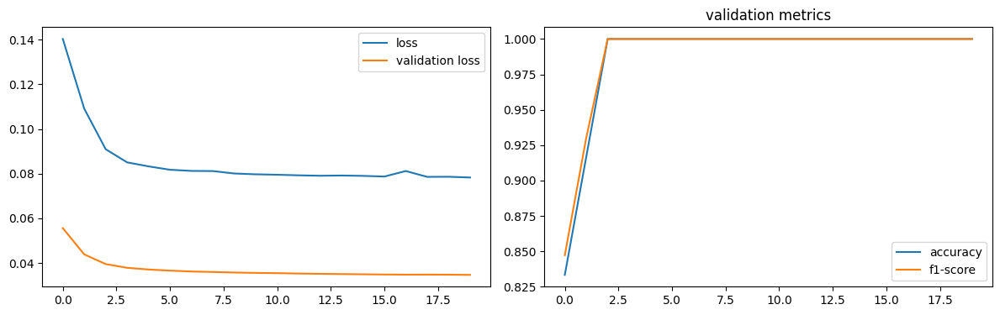

num of dropped: 15
Test: loss: 0.5815332531929016, avg metrics: (1.0, 1.0)
dropping feature: (42, 'neuron55')


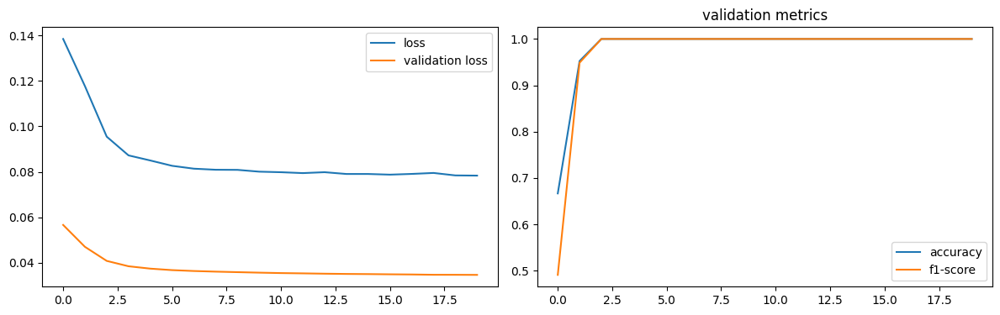

num of dropped: 16
Test: loss: 0.5825700759887695, avg metrics: (1.0, 1.0)
dropping feature: (16, 'neuron19')


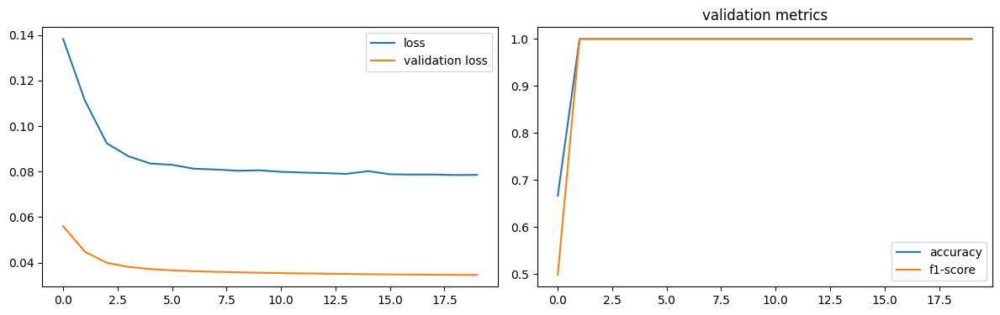

num of dropped: 17
Test: loss: 0.5825813412666321, avg metrics: (1.0, 1.0)
dropping feature: (8, 'neuron8')


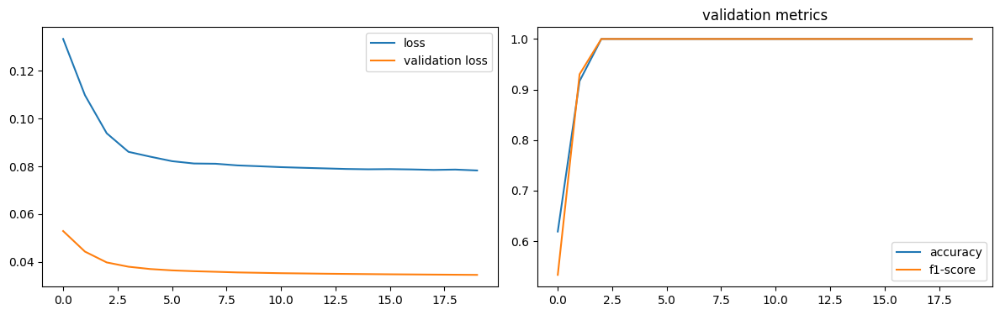

num of dropped: 18
Test: loss: 0.5814780592918396, avg metrics: (1.0, 1.0)
dropping feature: (9, 'neuron10')


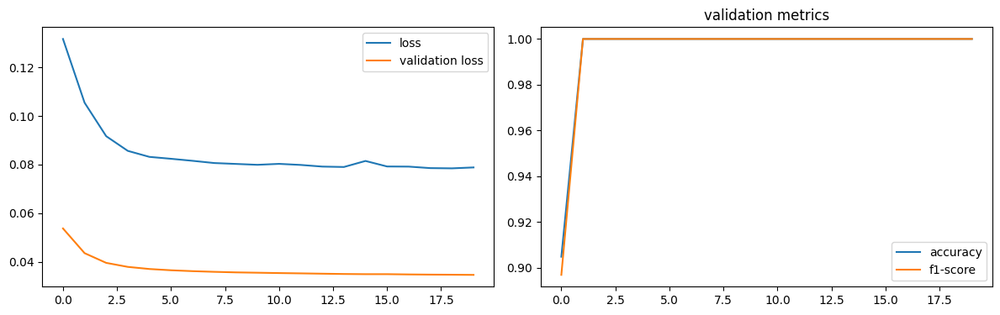

num of dropped: 19
Test: loss: 0.5825209021568298, avg metrics: (1.0, 1.0)
dropping feature: (38, 'neuron52')


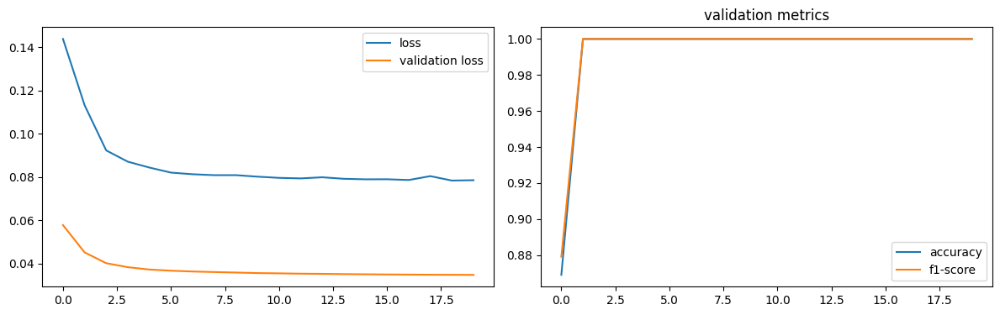

num of dropped: 20
Test: loss: 0.5818794369697571, avg metrics: (1.0, 1.0)
dropping feature: (39, 'neuron58')


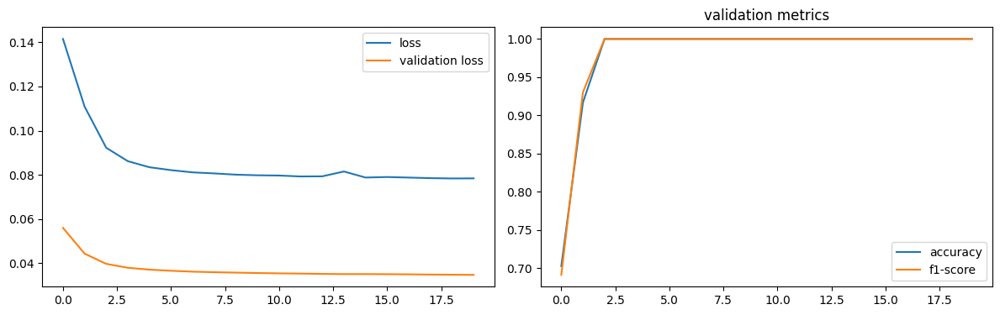

num of dropped: 21
Test: loss: 0.5816635489463806, avg metrics: (1.0, 1.0)
dropping feature: (16, 'neuron23')


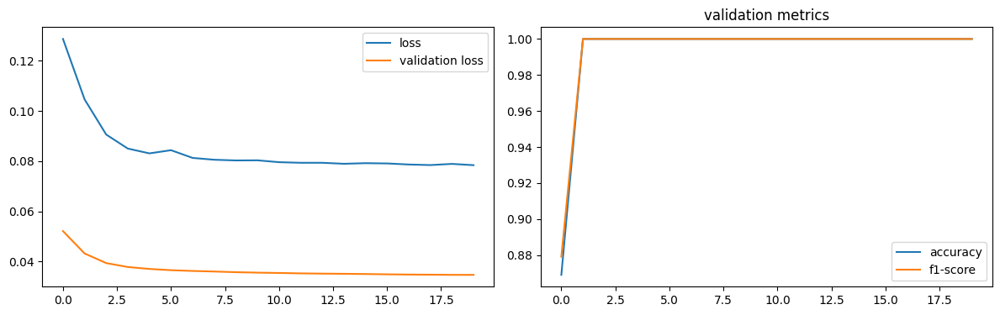

num of dropped: 22
Test: loss: 0.5822499990463257, avg metrics: (1.0, 1.0)
dropping feature: (28, 'neuron42')


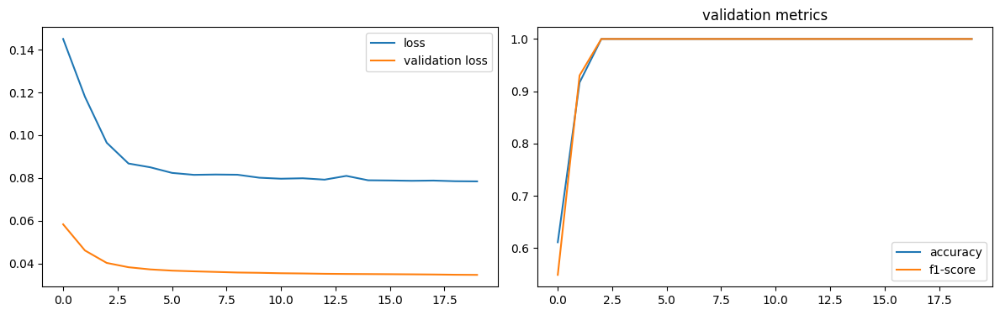

num of dropped: 23
Test: loss: 0.582668662071228, avg metrics: (1.0, 1.0)
dropping feature: (27, 'neuron40')


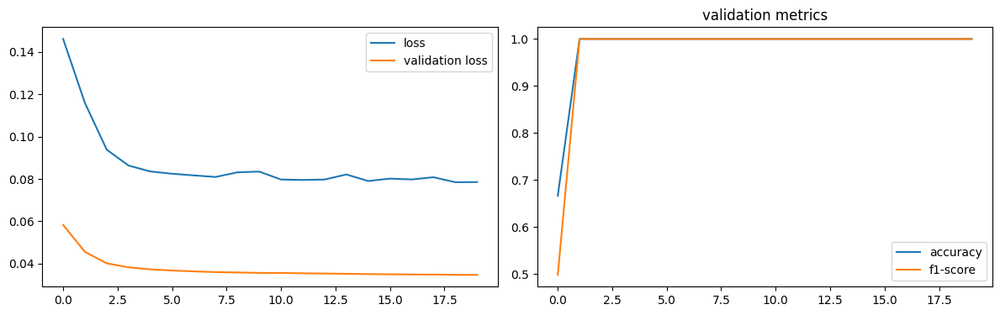

num of dropped: 24
Test: loss: 0.5834749937057495, avg metrics: (1.0, 1.0)
dropping feature: (26, 'neuron39')


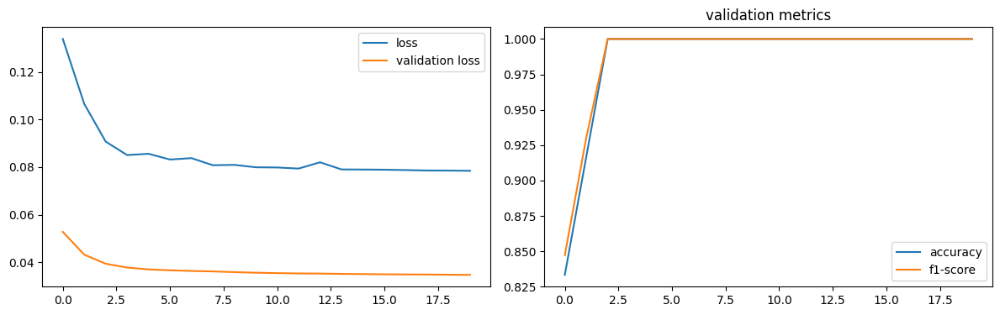

num of dropped: 25
Test: loss: 0.5832726359367371, avg metrics: (1.0, 1.0)
dropping feature: (35, 'neuron59')


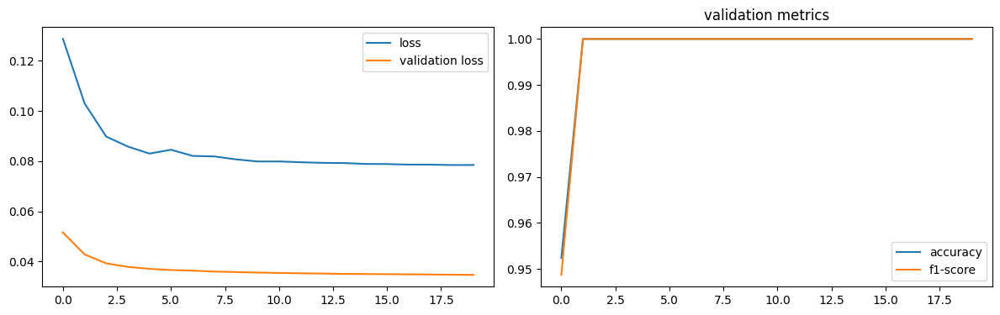

num of dropped: 26
Test: loss: 0.5827941298484802, avg metrics: (1.0, 1.0)
dropping feature: (17, 'neuron25')


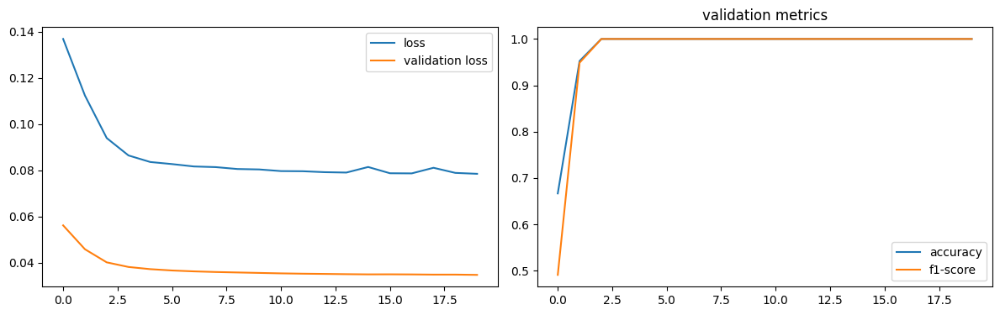

num of dropped: 27
Test: loss: 0.5827680826187134, avg metrics: (1.0, 1.0)
dropping feature: (5, 'neuron5')


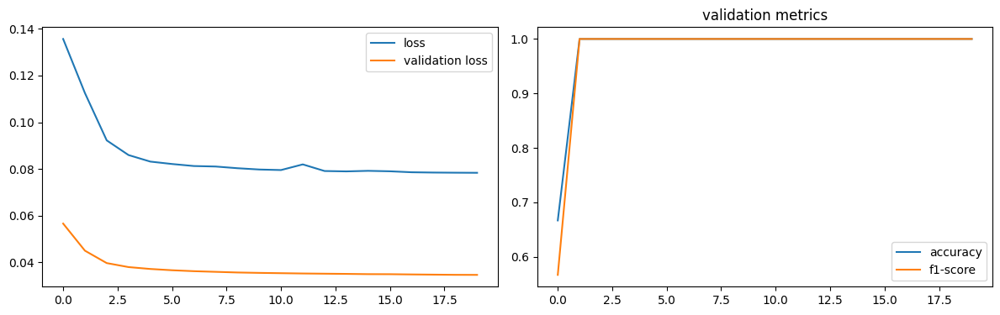

num of dropped: 28
Test: loss: 0.5824488997459412, avg metrics: (1.0, 1.0)
dropping feature: (12, 'neuron18')


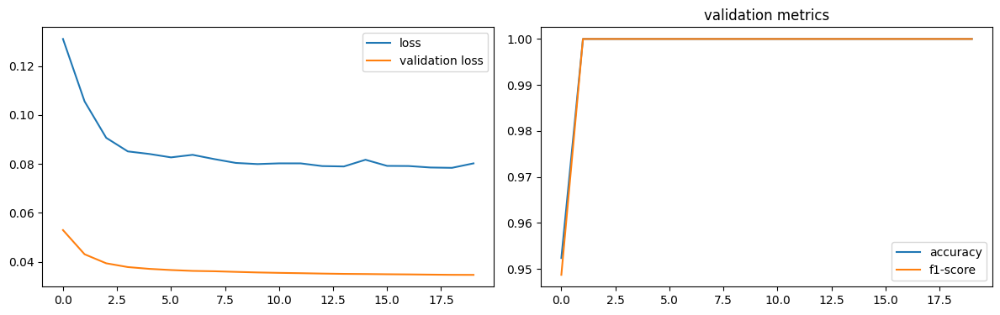

num of dropped: 29
Test: loss: 0.5826933979988098, avg metrics: (1.0, 1.0)
dropping feature: (25, 'neuron45')


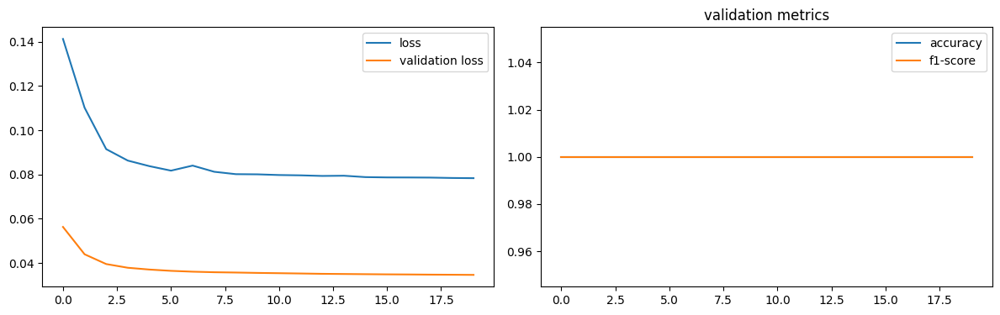

num of dropped: 30
Test: loss: 0.5827037692070007, avg metrics: (1.0, 1.0)
dropping feature: (20, 'neuron36')


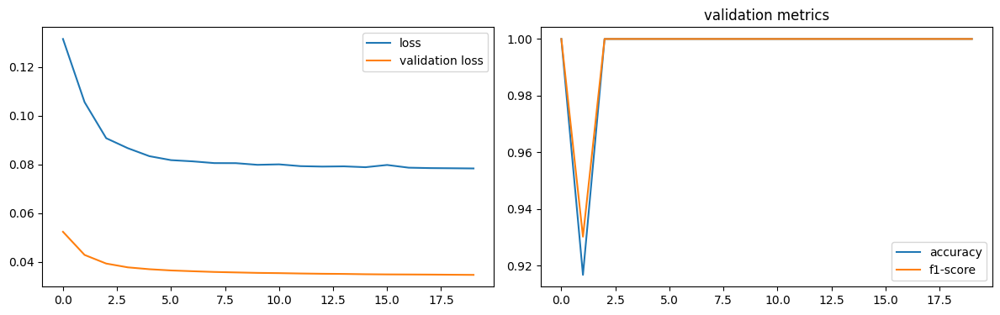

num of dropped: 31
Test: loss: 0.5818254351615906, avg metrics: (1.0, 1.0)
dropping feature: (18, 'neuron32')


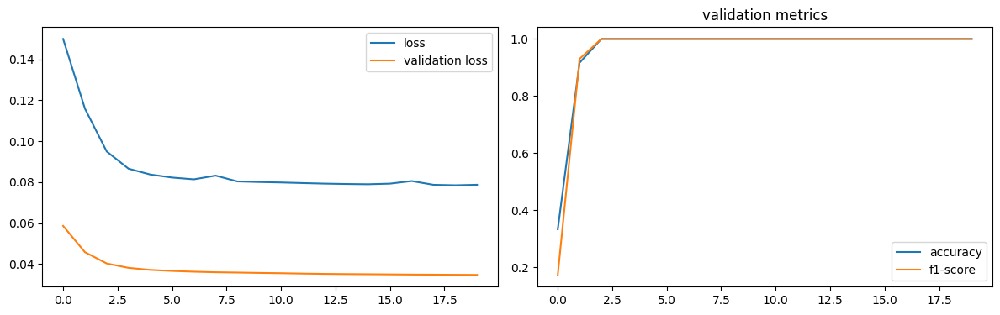

num of dropped: 32
Test: loss: 0.5830991864204407, avg metrics: (1.0, 1.0)
dropping feature: (25, 'neuron48')


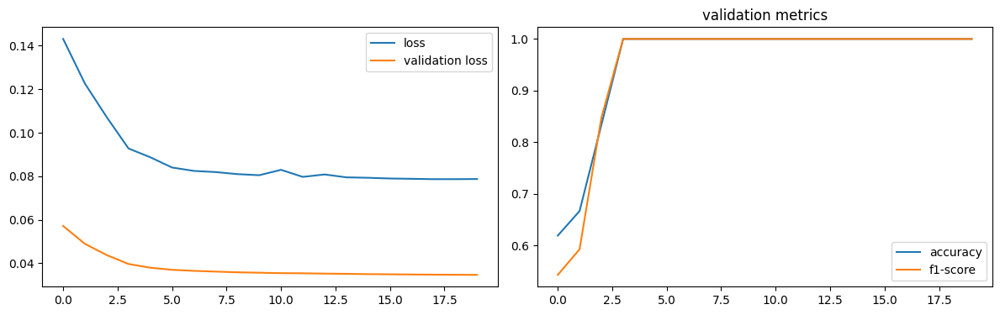

num of dropped: 33
Test: loss: 0.5838097333908081, avg metrics: (1.0, 1.0)
dropping feature: (30, 'neuron63')


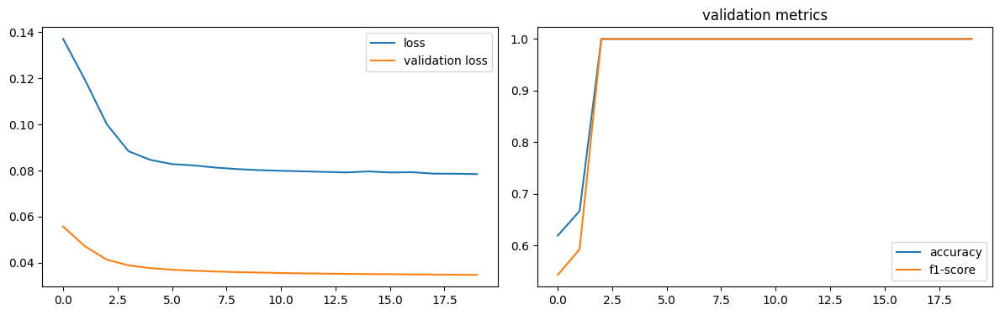

num of dropped: 34
Test: loss: 0.5824863314628601, avg metrics: (1.0, 1.0)
dropping feature: (12, 'neuron20')


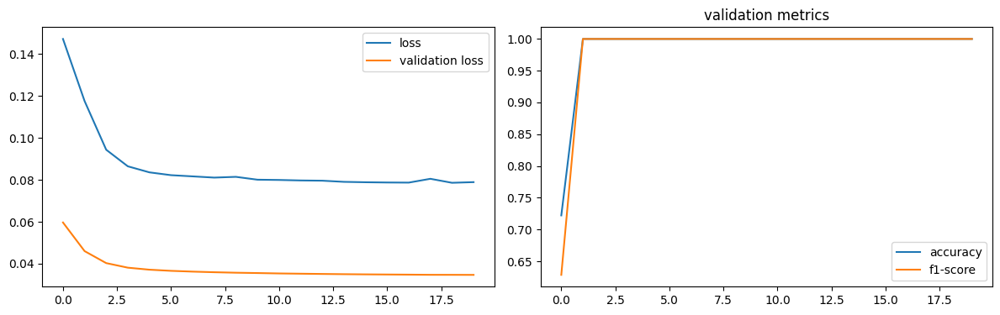

num of dropped: 35
Test: loss: 0.5821011662483215, avg metrics: (1.0, 1.0)
dropping feature: (23, 'neuron47')


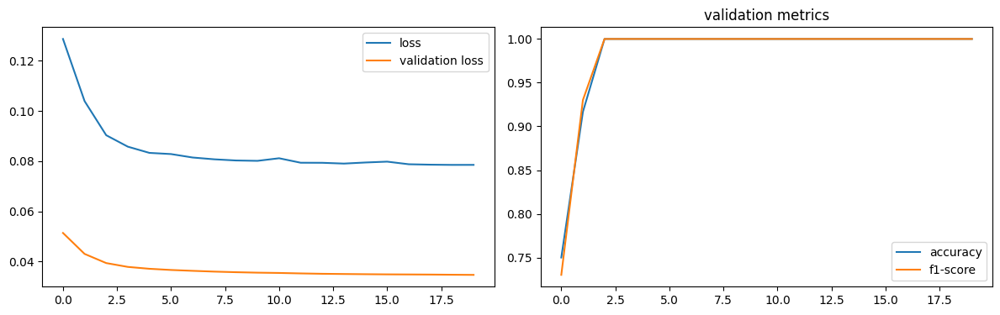

num of dropped: 36
Test: loss: 0.5822367072105408, avg metrics: (1.0, 1.0)
dropping feature: (15, 'neuron30')


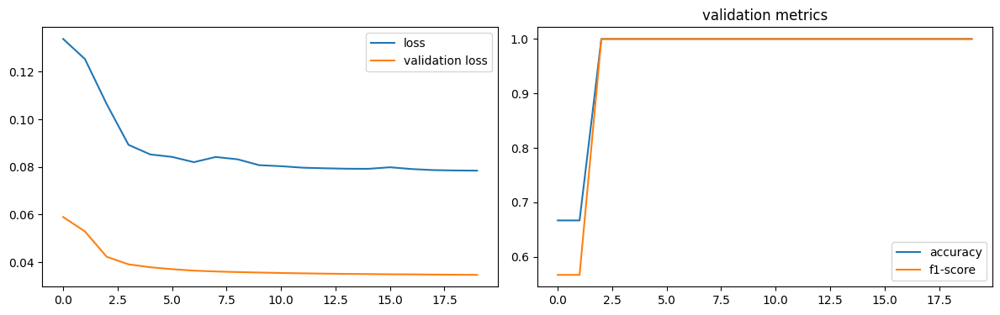

num of dropped: 37
Test: loss: 0.583341121673584, avg metrics: (1.0, 1.0)
dropping feature: (9, 'neuron13')


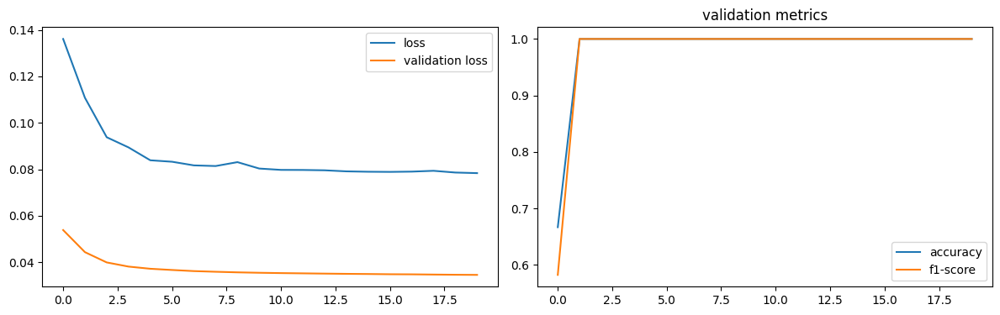

num of dropped: 38
Test: loss: 0.583892285823822, avg metrics: (1.0, 1.0)
dropping feature: (8, 'neuron11')


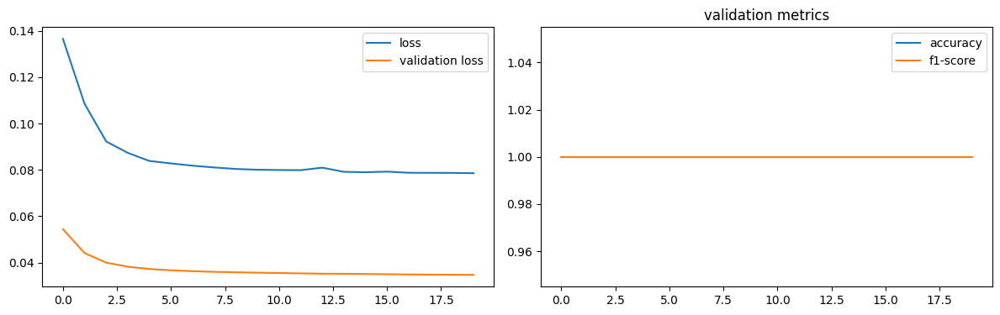

num of dropped: 39
Test: loss: 0.5829747319221497, avg metrics: (1.0, 1.0)
dropping feature: (15, 'neuron37')


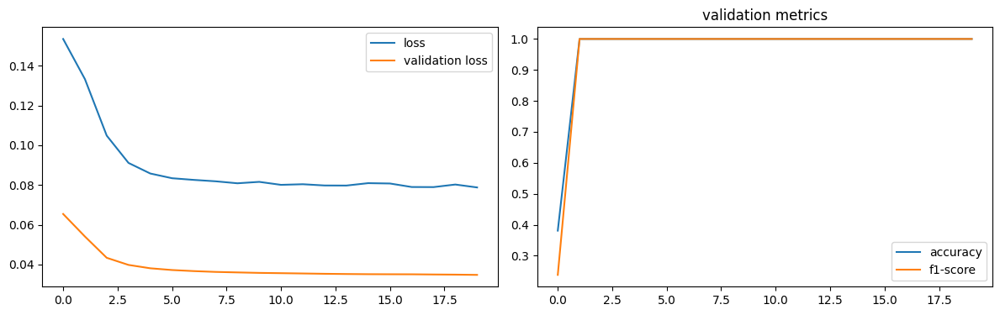

num of dropped: 40
Test: loss: 0.5842323899269104, avg metrics: (1.0, 1.0)
dropping feature: (12, 'neuron29')


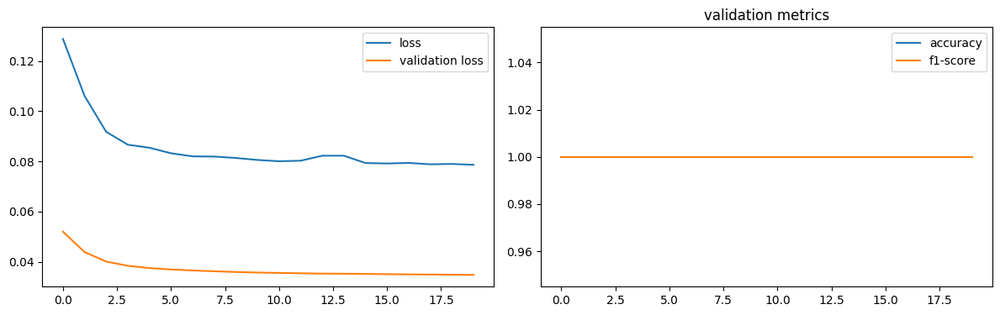

num of dropped: 41
Test: loss: 0.5854970812797546, avg metrics: (1.0, 1.0)
dropping feature: (14, 'neuron38')


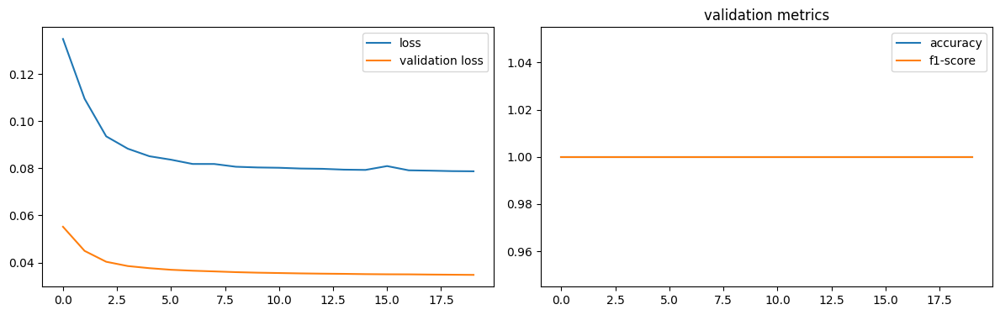

num of dropped: 42
Test: loss: 0.5847932696342468, avg metrics: (1.0, 1.0)
dropping feature: (21, 'neuron61')


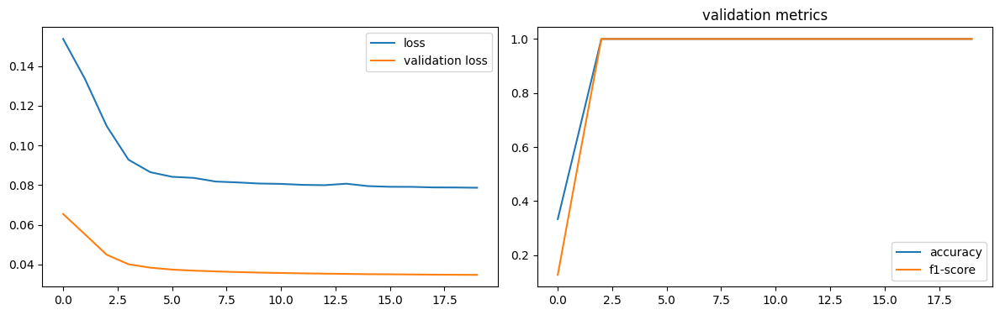

num of dropped: 43
Test: loss: 0.5852903127670288, avg metrics: (1.0, 1.0)
dropping feature: (16, 'neuron46')


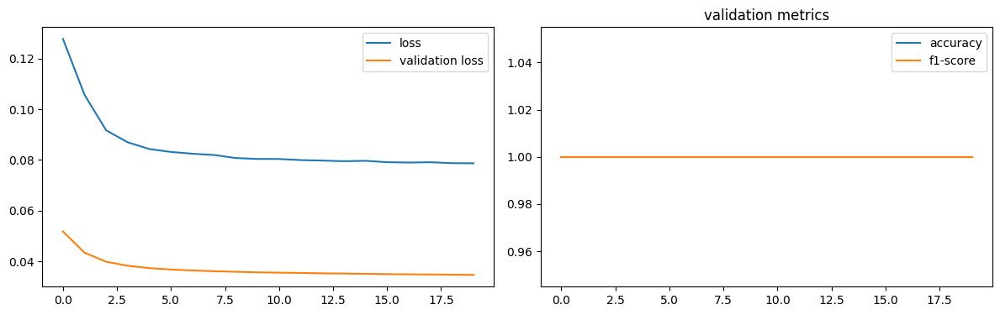

num of dropped: 44
Test: loss: 0.5855491757392883, avg metrics: (1.0, 1.0)
dropping feature: (7, 'neuron9')


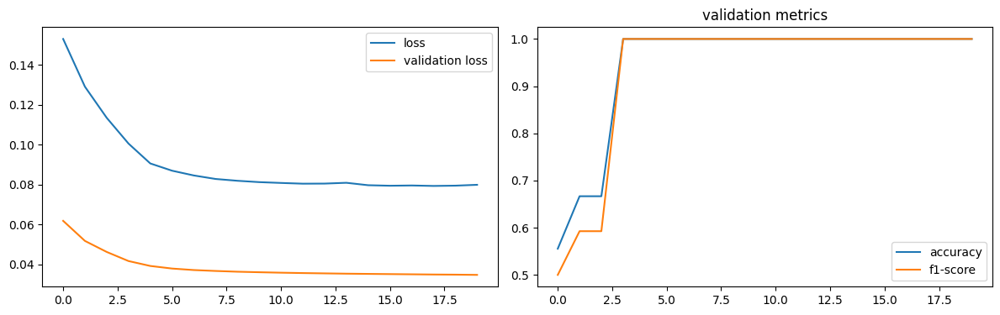

num of dropped: 45
Test: loss: 0.5880182981491089, avg metrics: (1.0, 1.0)
dropping feature: (8, 'neuron17')


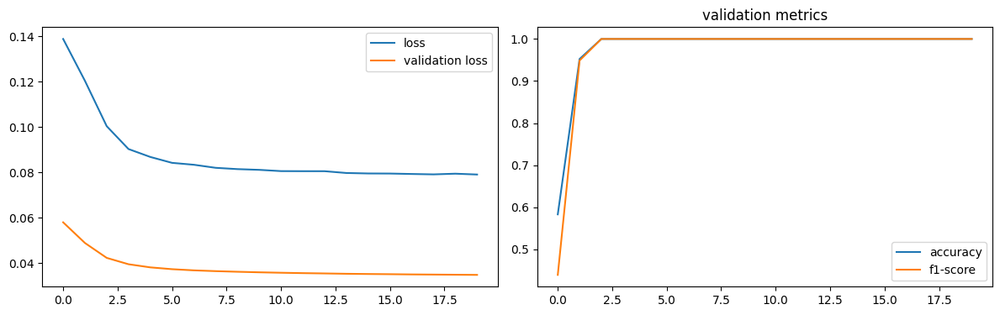

num of dropped: 46
Test: loss: 0.5878811478614807, avg metrics: (1.0, 1.0)
dropping feature: (7, 'neuron14')


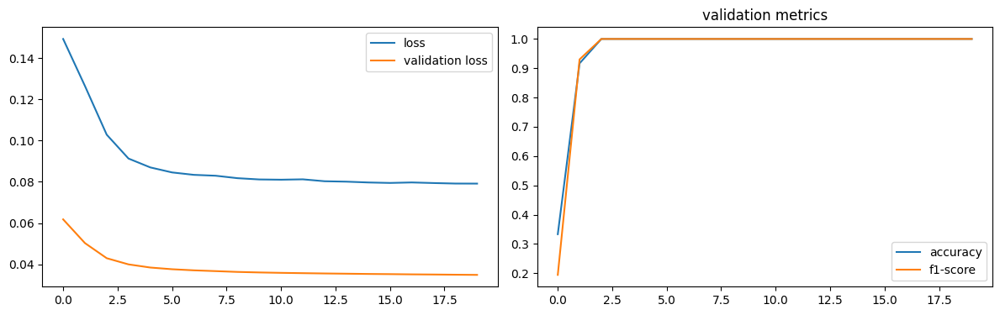

num of dropped: 47
Test: loss: 0.5874999165534973, avg metrics: (1.0, 1.0)
dropping feature: (13, 'neuron50')


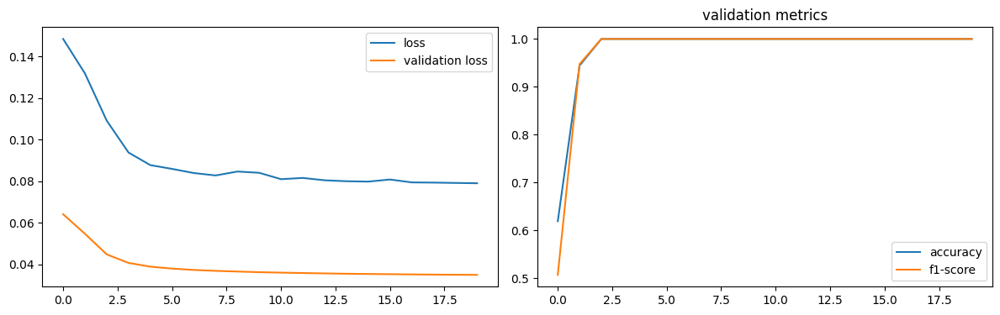

num of dropped: 48
Test: loss: 0.5885934829711914, avg metrics: (1.0, 1.0)
dropping feature: (3, 'neuron3')


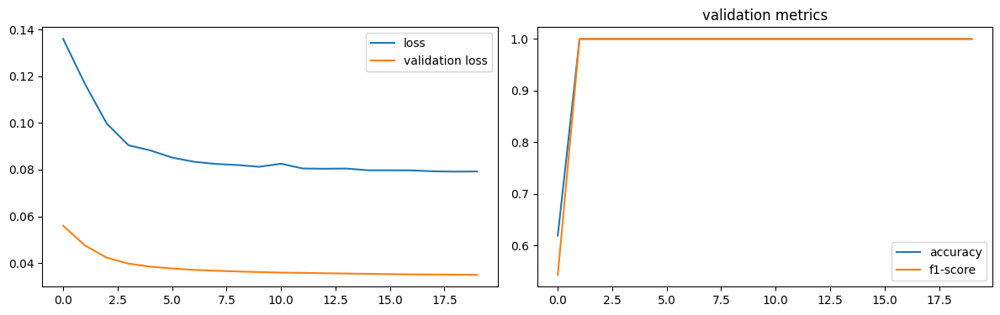

num of dropped: 49
Test: loss: 0.5882796049118042, avg metrics: (1.0, 1.0)
dropping feature: (2, 'neuron2')


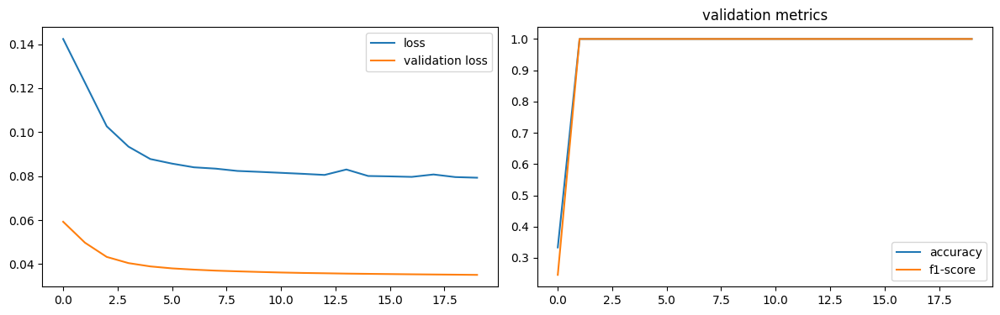

num of dropped: 50
Test: loss: 0.5903409123420715, avg metrics: (1.0, 1.0)
dropping feature: (2, 'neuron4')


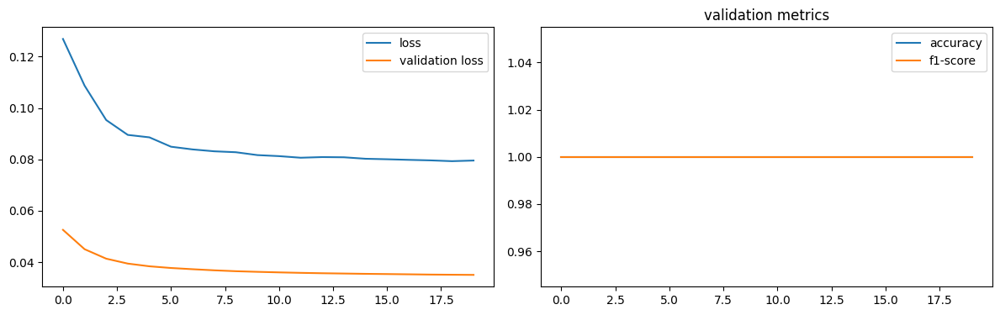

num of dropped: 51
Test: loss: 0.5896178483963013, avg metrics: (1.0, 1.0)
dropping feature: (8, 'neuron43')


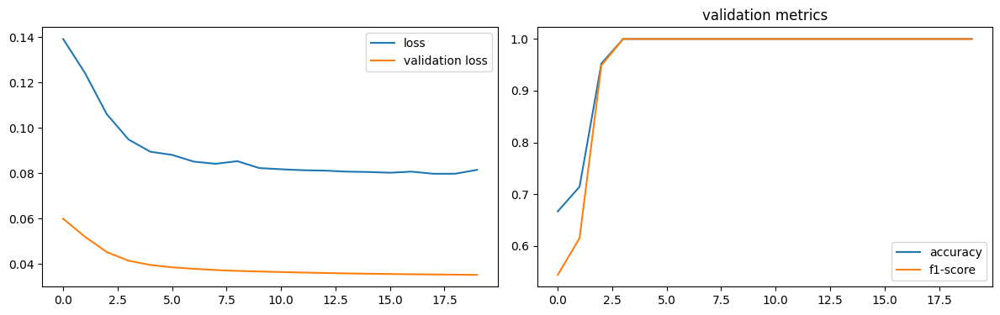

num of dropped: 52
Test: loss: 0.5930677652359009, avg metrics: (1.0, 1.0)
dropping feature: (2, 'neuron6')


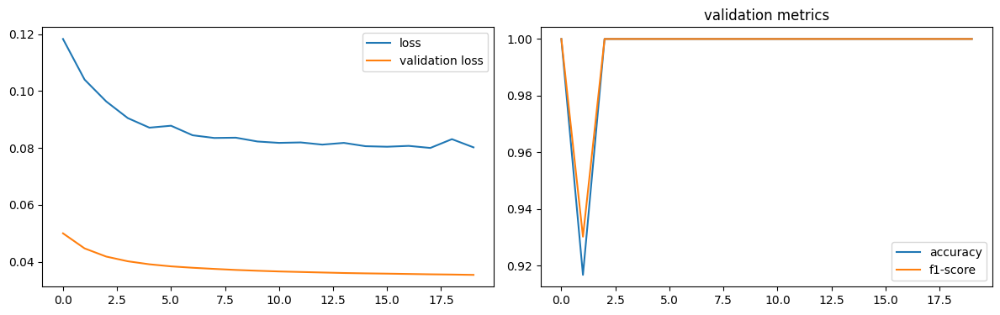

num of dropped: 53
Test: loss: 0.5930467844009399, avg metrics: (1.0, 1.0)
dropping feature: (0, 'neuron0')


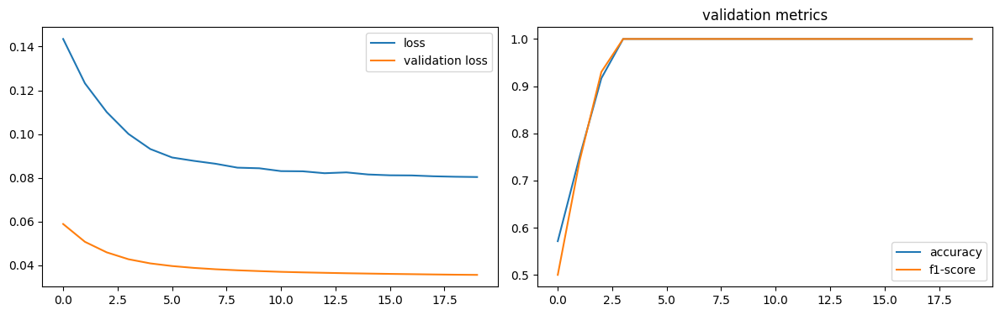

num of dropped: 54
Test: loss: 0.5999054908752441, avg metrics: (1.0, 1.0)
dropping feature: (7, 'neuron51')


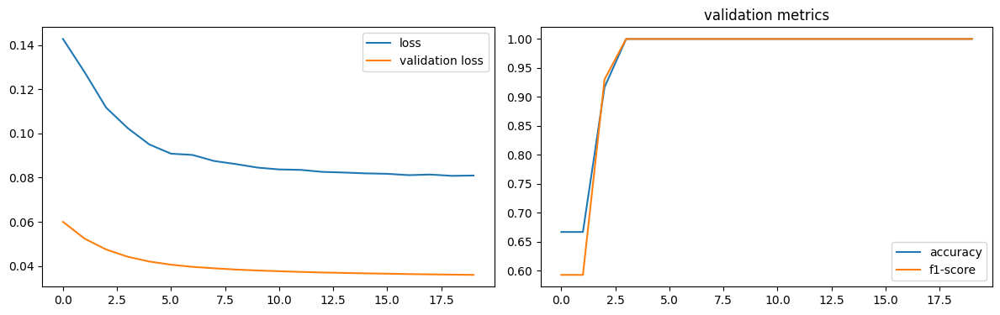

num of dropped: 55
Test: loss: 0.6007555723190308, avg metrics: (1.0, 1.0)
dropping feature: (1, 'neuron7')


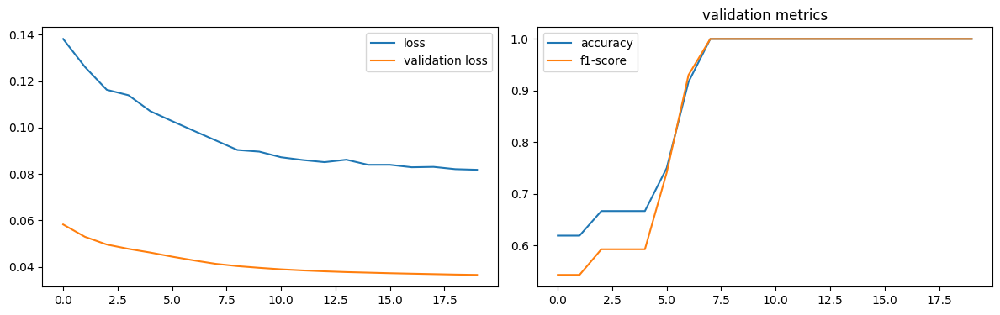

num of dropped: 56
Test: loss: 0.6135820746421814, avg metrics: (1.0, 1.0)
dropping feature: (5, 'neuron44')


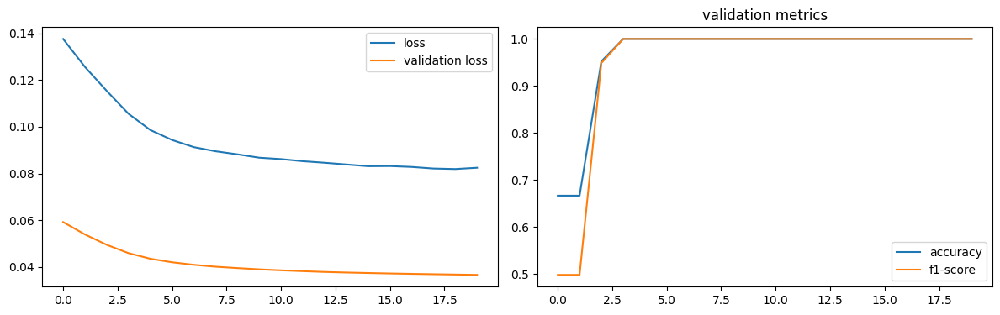

num of dropped: 57
Test: loss: 0.6123138666152954, avg metrics: (1.0, 1.0)
dropping feature: (0, 'neuron1')


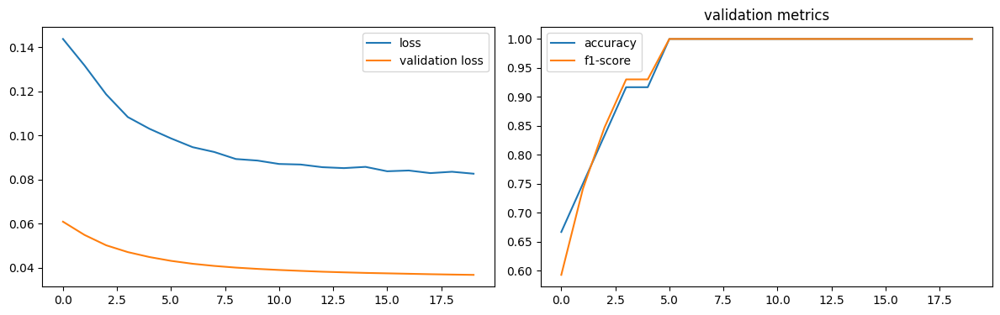

num of dropped: 58
Test: loss: 0.6171405911445618, avg metrics: (1.0, 1.0)
dropping feature: (1, 'neuron24')


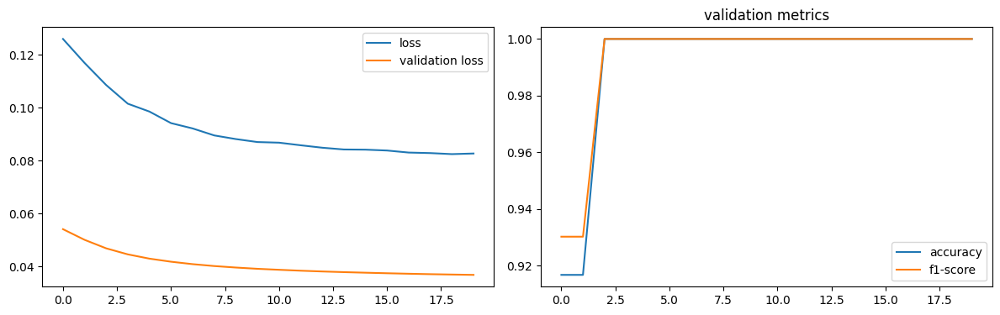

num of dropped: 59
Test: loss: 0.616265594959259, avg metrics: (1.0, 1.0)
dropping feature: (4, 'neuron60')


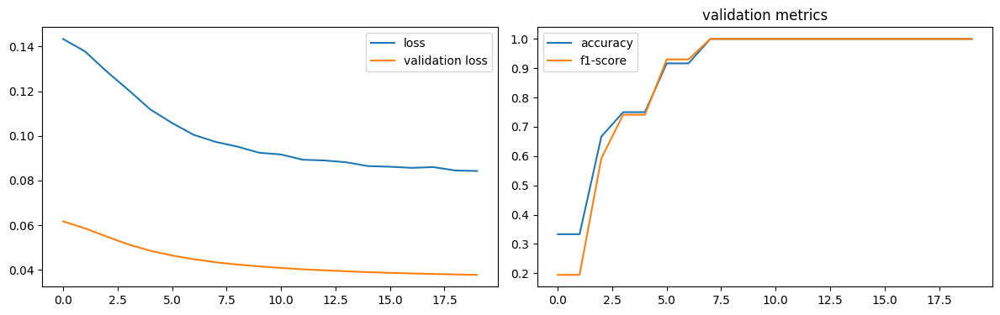

num of dropped: 60
Test: loss: 0.6279457807540894, avg metrics: (1.0, 1.0)
dropping feature: (0, 'neuron21')


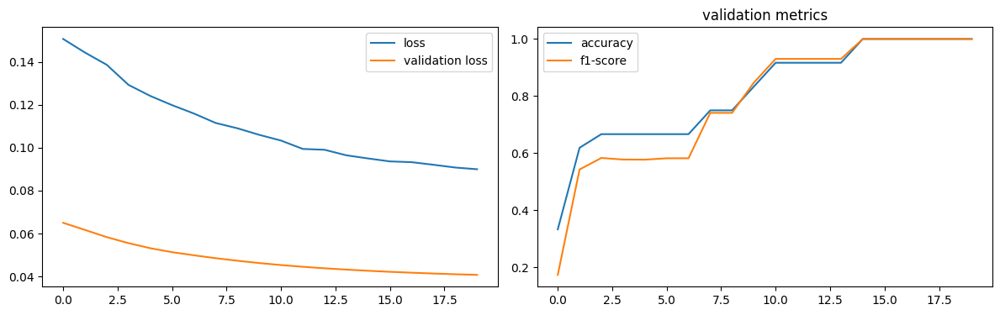

num of dropped: 61
Test: loss: 0.6719477772712708, avg metrics: (1.0, 1.0)
dropping feature: (2, 'neuron57')


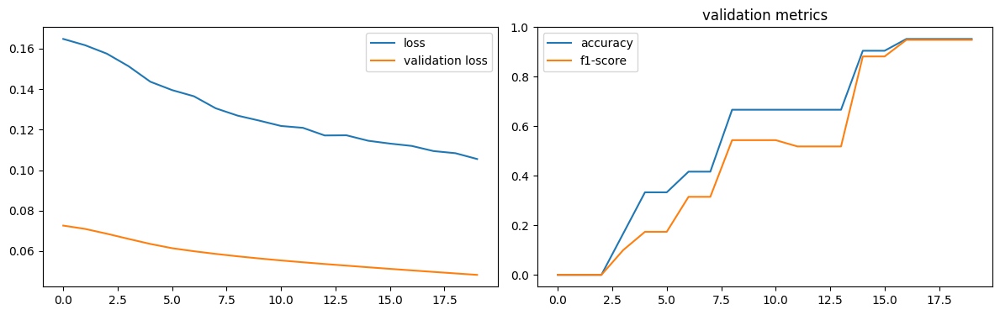

num of dropped: 62
Test: loss: 0.8033999800682068, avg metrics: (0.9944444417953491, 0.9928620338439942)
dropping feature: (1, 'neuron35')


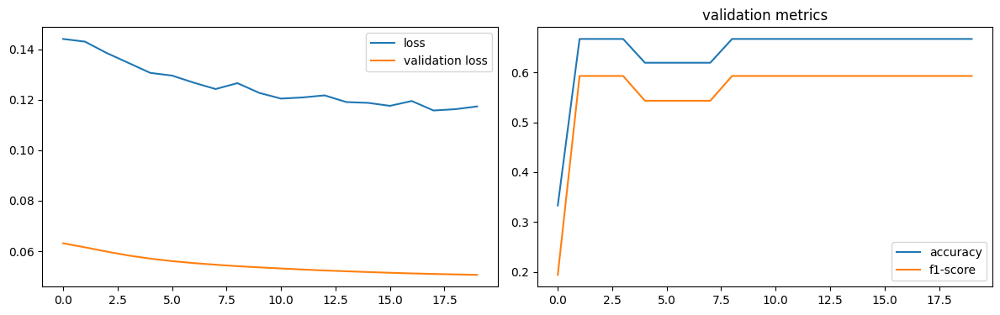

num of dropped: 63
Test: loss: 0.9109882116317749, avg metrics: (0.6638888955116272, 0.5664973735809327)


In [36]:
torch.manual_seed(2024)

headers = [f"neuron{i}" for i in range(64)]


def model_factory(size):
    model = WineNN(1, (1, size))
    model.layer1 = nn.Identity()
    model.layer2 = nn.Identity()
    return model


test_metrics, dropped, models = prune(
    datasets, headers, analyze_dgsm,
    model_factory, optimizer_factory, criterion, score_outputs, 20,
    labels, "", None
)

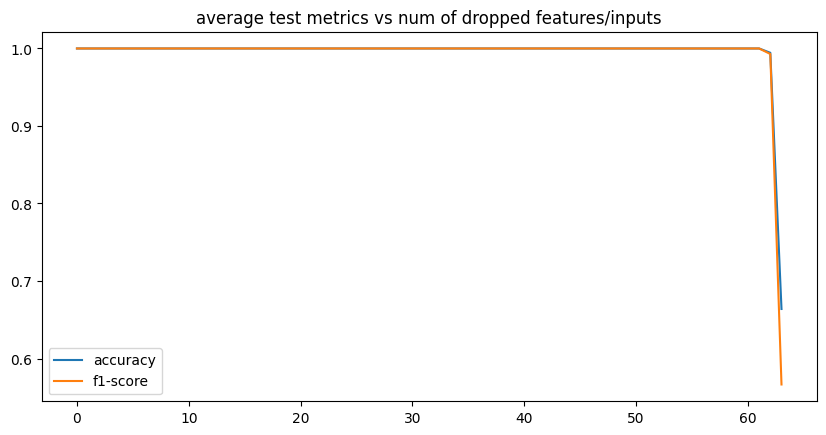

In [37]:
plot_dropping_metrics(test_metrics, labels)

In [38]:
num_drop_neurons = 61

save_models("wine", "fast-layer3", models, dropped)

reduced_datasets, reduced_headers = reduce_datasets(datasets, headers, dropped, num_drop_neurons)
layer = models[num_drop_neurons].out

best_model.out = layer
best_model.layer2[0] = reduce_linear(best_model.layer2[0], dropped, num_drop_neurons)

features left [3]:  ['neuron31', 'neuron35', 'neuron57']


### pruned

In [39]:
best_model

WineNN(
  (layer1): Sequential(
    (0): Linear(in_features=8, out_features=3, bias=True)
    (1): ReLU()
  )
  (layer2): Sequential(
    (0): Linear(in_features=3, out_features=3, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.1, inplace=False)
  )
  (out): Sequential(
    (0): Linear(in_features=3, out_features=3, bias=True)
    (1): Softmax(dim=-1)
  )
)

In [40]:
with torch.no_grad():
    inputs, targets = fast_dataset["test"][:]
    outputs = best_model(inputs)

    test_metrics = score_outputs(outputs, targets)

print(f"test {labels}: {test_metrics}")

test ('accuracy', 'f1-score'): (1.0, 1.0)


test: ('accuracy', 'f1-score'): (1.0, 1.0)


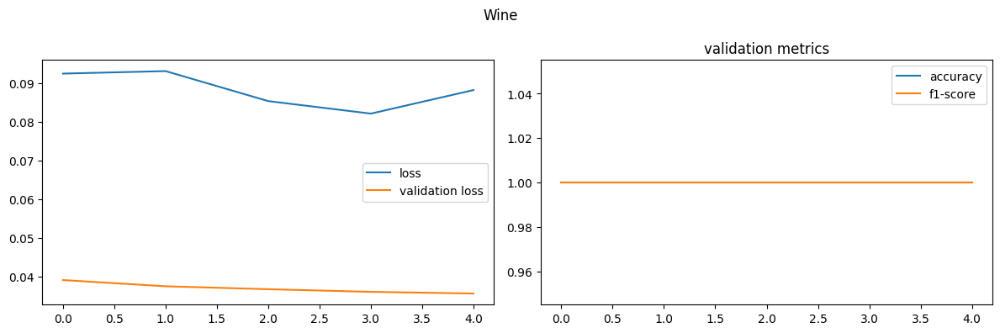

In [41]:
optimizer = optimizer_factory(best_model)
metrics = model_train(fast_dataset, best_model, optimizer, criterion, score_outputs, 5)

with torch.no_grad():
    inputs, targets = fast_dataset["test"][:]
    outputs = best_model(inputs)

    test_metrics = score_outputs(outputs, targets)

print(f"test: {labels}: {test_metrics}")
plot_metrics('Wine', metrics, labels)

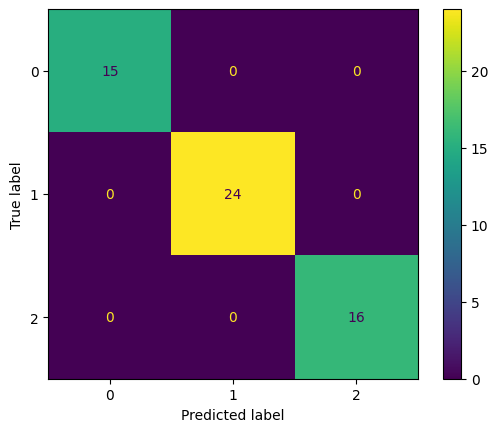

In [42]:
ConfusionMatrixDisplay.from_predictions(targets, outputs.argmax(dim=1))
plt.show()

In [43]:
save_models("wine", "fast-prunned", [best_model], None)